In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#dataset is from kaggle.com

In [3]:
#dataframe to work with
df = pd.read_csv('spotifydata.csv')
df.head()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity,mood
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,44,Sad
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,10,Happy
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,63,Happy
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,9,Happy
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,8,Happy


In [5]:
#drop irrelevant attributes
#df.drop(['track_id','acousticness','duration_ms','key','instrumentalness','time_signature'],axis=1)

In [6]:
#writing code for general neural network

In [7]:
def neuralnetwork(inp1,inp2,w1,w2,b):
    output = inp1*w1 + inp2*w2+b
    return normalise(output)

In [8]:
#writing code for normalising
def normalise(x):
    return 1/(1+np.exp(-x))

In [9]:
#replace sad with 0 and happy with 1
new_arr = []
for i in df['mood']:
    if i=='Sad':
        new_arr.append(0)
    else:
        new_arr.append(1)

In [10]:
#print(new_arr)

In [11]:
df['result']=new_arr

In [14]:
ldata = len(df)

In [15]:
#print(ldata)

In [16]:
#80% training 20%  test   ------   fixing length of training and test data set {not needed}
trainlen = int(ldata*0.8)
testlen = ldata-trainlen
i=0

In [20]:
#we are going to work with energy ,valence ,mood ---->  x , y , output

energy = np.array(df['energy'])
valence=np.array(df['valence'])
output = np.array(df['result'])

In [151]:
print(energy,valence,output)

[0.339 0.557 0.723 ... 0.747 0.506 0.145] [0.118 0.371 0.382 ... 0.584 0.271 0.433] [0 1 1 ... 1 1 0]


In [21]:
len(energy)

116372

In [22]:
dt =[]
#now we have to make the data in form of a[x,y,ouput]
for t in range(len(energy)):
    dt.append([energy[t],valence[t],output[t]])
    

In [23]:
dt

[[0.33899999999999997, 0.11800000000000001, 0],
 [0.557, 0.371, 1],
 [0.723, 0.382, 1],
 [0.579, 0.6409999999999999, 1],
 [0.792, 0.9279999999999999, 1],
 [0.41700000000000004, 0.8370000000000001, 0],
 [0.72, 0.934, 1],
 [0.348, 0.18, 0],
 [0.47200000000000003, 0.622, 0],
 [0.731, 0.9440000000000001, 1],
 [0.83, 0.8959999999999999, 1],
 [0.865, 0.695, 1],
 [0.698, 0.9640000000000001, 1],
 [0.7090000000000001, 0.489, 1],
 [0.573, 0.7659999999999999, 1],
 [0.581, 0.503, 1],
 [0.7090000000000001, 0.653, 1],
 [0.645, 0.0359, 1],
 [0.598, 0.623, 1],
 [0.504, 0.585, 1],
 [0.8240000000000001, 0.591, 1],
 [0.703, 0.503, 1],
 [0.537, 0.523, 1],
 [0.5870000000000001, 0.616, 1],
 [0.45399999999999996, 0.281, 0],
 [0.695, 0.316, 1],
 [0.789, 0.9229999999999999, 1],
 [0.629, 0.502, 1],
 [0.46299999999999997, 0.684, 0],
 [0.452, 0.499, 0],
 [0.94, 0.444, 1],
 [0.5720000000000001, 0.6729999999999999, 1],
 [0.855, 0.8079999999999999, 1],
 [0.948, 0.754, 1],
 [0.615, 0.603, 1],
 [0.5379999999999999, 0.

In [24]:
#lets see the data now 
dtl = len(dt)



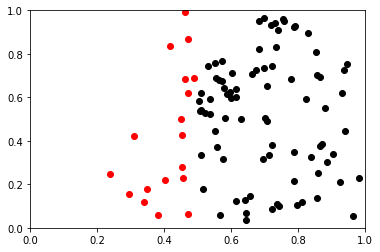

In [39]:
for z in range(100):
    plt.axis([0,1,0,1])
  
    point = dt[z]
    color = 'r'  #sadsongs
    if point[2] == 1:
        color='k'  #happysongs
    plt.scatter(point[0],point[1],c=color)
    


In [40]:
def normalise_derivative(n):
    return normalise(n)*(1-normalise(n))

In [102]:
#setting random weights 
w1 = np.random.randn()
w2 = np.random.randn()
b = np.random.randn()
print(w1,w2)
#triaining the data 
learning_rate = 0.7
costs=[]
for i in range(12000):
    pos = np.random.randint(len(dt))
    dat = dt[pos]
    input1 = dat[0]
    input2 = dat[1]
    out = dat[2]
    z = input1*w1+input2*w2+b
    
    prediction = neuralnetwork(input1,input2,w1,w2,b)
    cost = np.square(prediction-out)
    costs.append(cost)
    #derivatives  -- - --  -- - -- - dcost_pred = {d/d(pred){(pred-out)**2} similarly for all
    dcost_pred = 2*(prediction-out)
    dpred_z=normalise_derivative(z)
    dz_w1=input1
    dz_w2=input2
    dz_b =1
    
    
    #applying chain rule
    
    dcost_z = dcost_pred*dpred_z
    dcost_w1= dcost_z*dz_w1
    dcost_w2=dcost_z*dz_w2
    dcost_b=dcost_z*dz_b

    #subtracting the learning rate
    
    w1 = w1 - learning_rate*dcost_w1
    w2 = w2 - learning_rate*dcost_w2
    b = b - learning_rate*dcost_b
    

-1.0128856630276022 0.5479393847213356


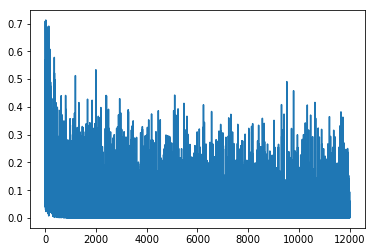

In [103]:
plt.plot(costs)

In [108]:
predicted_results=[]
for i in range(len(dt)):
    pt = dt[i]
    print(pt)
    pred = neuralnetwork(pt[0],pt[1],w1,w2,b)
    if pred>0.5:
        print('Happy  : ',pred)
        predicted_results.append(1)
    else:
        print('Sad    : ',pred)
        predicted_results.append(0)
        

[0.33899999999999997, 0.11800000000000001, 0]
Sad    :  0.04539179196390709
[0.557, 0.371, 1]
Happy  :  0.8148885113106394
[0.723, 0.382, 1]
Happy  :  0.9930294485820198
[0.579, 0.6409999999999999, 1]
Happy  :  0.869894575375292
[0.792, 0.9279999999999999, 1]
Happy  :  0.9981994860092449
[0.41700000000000004, 0.8370000000000001, 0]
Sad    :  0.17855527511191222
[0.72, 0.934, 1]
Happy  :  0.9919025593014539
[0.348, 0.18, 0]
Sad    :  0.053795875640253704
[0.47200000000000003, 0.622, 0]
Sad    :  0.4159908995019887
[0.731, 0.9440000000000001, 1]
Happy  :  0.9935486821027315
[0.83, 0.8959999999999999, 1]
Happy  :  0.9991913415702168
[0.865, 0.695, 1]
Happy  :  0.9996237495749813
[0.698, 0.9640000000000001, 1]
Happy  :  0.9871598030149887
[0.7090000000000001, 0.489, 1]
Happy  :  0.9905157934315963
[0.573, 0.7659999999999999, 1]
Happy  :  0.8524987278574951
[0.581, 0.503, 1]
Happy  :  0.8769618999560115
[0.7090000000000001, 0.653, 1]
Happy  :  0.9902666596223142
[0.645, 0.0359, 1]
Happy  : 

[0.27899999999999997, 0.5, 0]
Sad    :  0.012563410581582791
[0.17800000000000002, 0.184, 0]
Sad    :  0.0016091257205822107
[0.35700000000000004, 0.32799999999999996, 0]
Sad    :  0.06283881949917089
[0.10400000000000001, 0.665, 0]
Sad    :  0.00031645950037811427
[0.457, 0.165, 0]
Sad    :  0.3587850490623618
[0.779, 0.175, 1]
Happy  :  0.9979040669539833
[0.6509999999999999, 0.49200000000000005, 1]
Happy  :  0.9687097783781249
[0.838, 0.773, 1]
Happy  :  0.9993293619398027
[0.125, 0.0863, 0]
Sad    :  0.0005388492653060289
[0.131, 0.187, 0]
Sad    :  0.0006012645376172393
[0.265, 0.293, 0]
Sad    :  0.00971169598901224
[0.0767, 0.0735, 0]
Sad    :  0.00019629870989495814
[0.111, 0.0859, 0]
Sad    :  0.00040191874604250845
[0.23800000000000002, 0.107, 0]
Sad    :  0.005704439627104456
[0.912, 0.851, 1]
Happy  :  0.9998559083634817
[0.523, 0.41100000000000003, 1]
Happy  :  0.6820473732140758
[0.828, 0.0631, 1]
Happy  :  0.9992616659833214
[0.8, 0.611, 1]
Happy  :  0.9985520189254665
[

Sad    :  4.020110162472841e-05
[0.00399, 0.12300000000000001, 0]
Sad    :  4.244308824624429e-05
[0.006509999999999999, 0.282, 0]
Sad    :  4.362323695055272e-05
[0.11199999999999999, 0.239, 0]
Sad    :  0.00040052126288256206
[0.0137, 0.297, 0]
Sad    :  5.059554260832694e-05
[0.20800000000000002, 0.34, 0]
Sad    :  0.002939208158289874
[0.00132, 0.499, 0]
Sad    :  3.7795555824649896e-05
[0.171, 0.0732, 0]
Sad    :  0.0014146474530813903
[0.182, 0.172, 0]
Sad    :  0.0017529277952833646
[0.00532, 0.32, 0]
Sad    :  4.2291543579678e-05
[0.209, 0.172, 0]
Sad    :  0.0030825953584433805
[0.0417, 0.456, 0]
Sad    :  8.869614165787839e-05
[0.0562, 0.43200000000000005, 0]
Sad    :  0.00012064841372104108
[0.0282, 0.134, 0]
Sad    :  7.036737257388879e-05
[0.008029999999999999, 0.22, 0]
Sad    :  4.548302263665377e-05
[0.0153, 0.135, 0]
Sad    :  5.3691342717085944e-05
[0.184, 0.278, 0]
Sad    :  0.0017972069285444358
[0.0446, 0.159, 0]
Sad    :  9.8829083164078e-05
[0.0127, 0.122, 0]
Sad 

Happy  :  0.7218331713195933
[0.649, 0.816, 1]
Happy  :  0.965743570836618
[0.862, 0.9329999999999999, 1]
Happy  :  0.9995838367448908
[0.672, 0.8240000000000001, 1]
Happy  :  0.9785372408701328
[0.943, 0.94, 1]
Happy  :  0.9999236687124801
[0.544, 0.9079999999999999, 1]
Happy  :  0.7547181587985885
[0.38299999999999995, 0.8059999999999999, 0]
Sad    :  0.09676229196523052
[0.491, 0.789, 0]
Happy  :  0.5080630337481178
[0.728, 0.74, 1]
Happy  :  0.9933515198834736
[0.682, 0.856, 1]
Happy  :  0.9824361595332181
[0.614, 0.0391, 1]
Happy  :  0.938749717129336
[0.6679999999999999, 0.9620000000000001, 1]
Happy  :  0.9761977394425597
[0.647, 0.675, 1]
Happy  :  0.9650958181327569
[0.46399999999999997, 0.722, 0]
Sad    :  0.3721821617056769
[0.667, 0.963, 1]
Happy  :  0.9757021328404148
[0.604, 0.747, 1]
Happy  :  0.9173603075800979
[0.474, 0.621, 0]
Sad    :  0.42624671970596895
[0.7040000000000001, 0.6409999999999999, 1]
Happy  :  0.9892234928782709
[0.473, 0.6829999999999999, 0]
Sad    :  

Sad    :  7.080146532726897e-05
[0.24600000000000002, 0.153, 0]
Sad    :  0.00668963706550443
[0.35100000000000003, 0.616, 0]
Sad    :  0.05345413678518055
[0.115, 0.306, 0]
Sad    :  0.0004219632430681134
[0.0742, 0.196, 0]
Sad    :  0.00018267432429892413
[0.146, 0.845, 0]
Sad    :  0.0007411445965674964
[0.0846, 0.688, 0]
Sad    :  0.00020999418095038951
[0.0905, 0.929, 0]
Sad    :  0.00022865853981147616
[0.134, 0.45899999999999996, 0]
Sad    :  0.0006130644464081419
[0.0853, 0.772, 0]
Sad    :  0.00021025881921745443
[0.0763, 0.435, 0]
Sad    :  0.00018374670657686604
[0.0195, 0.0868, 0]
Sad    :  5.9083813281345965e-05
[0.0943, 0.41100000000000003, 0]
Sad    :  0.00026894742120912
[0.15, 0.16399999999999998, 0]
Sad    :  0.0008983656264885402
[0.0308, 0.355, 0]
Sad    :  7.173180959952747e-05
[0.111, 0.8240000000000001, 0]
Sad    :  0.0003572605314963196
[0.136, 0.185, 0]
Sad    :  0.0006678533677036835
[0.10300000000000001, 0.289, 0]
Sad    :  0.0003290634589111866
[0.0628, 0.12

Happy  :  0.9998453778093682
[0.628, 0.677, 1]
Happy  :  0.9488813173654165
[0.147, 0.16899999999999998, 0]
Sad    :  0.000842998996071541
[0.73, 0.391, 1]
Happy  :  0.9939661785321754
[0.6970000000000001, 0.78, 1]
Happy  :  0.9872660589771076
[0.785, 0.397, 1]
Happy  :  0.9980846844225933
[0.9690000000000001, 0.436, 1]
Happy  :  0.9999591543907677
[0.519, 0.203, 1]
Happy  :  0.6709702821750501
[0.97, 0.32799999999999996, 1]
Happy  :  0.9999606850960243
[0.6829999999999999, 0.188, 1]
Happy  :  0.9845075375731503
[0.8640000000000001, 0.0405, 1]
Happy  :  0.9996538896111284
[0.523, 0.134, 1]
Happy  :  0.6915587324403405
[0.863, 0.0397, 1]
Happy  :  0.9996466076296452
[0.733, 0.47200000000000003, 1]
Happy  :  0.9942584072724922
[0.594, 0.845, 1]
Happy  :  0.8986035286723077
[0.585, 0.401, 1]
Happy  :  0.8873623544610681
[0.875, 0.0394, 1]
Happy  :  0.999725174792646
[0.37, 0.787, 0]
Sad    :  0.07563933755748163
[0.995, 0.6459999999999999, 1]
Happy  :  0.999975504764207
[0.753, 0.0358, 1]

[0.00495, 0.0312, 0]
Sad    :  4.394484654007109e-05
[0.9209999999999999, 0.96, 1]
Happy  :  0.9998785786212571
[0.708, 0.599, 1]
Happy  :  0.9901470387021948
[0.853, 0.551, 1]
Happy  :  0.9995272130896696
[0.37200000000000005, 0.659, 0]
Sad    :  0.08011543287566945
[0.711, 0.307, 1]
Happy  :  0.9911597845002487
[0.508, 0.6779999999999999, 1]
Happy  :  0.600183609190046
[0.5329999999999999, 0.321, 1]
Happy  :  0.7285199171915024
[0.446, 0.45, 0]
Sad    :  0.29803837318750714
[0.664, 0.787, 1]
Happy  :  0.9748639925257461
[0.948, 0.884, 1]
Happy  :  0.9999318732215828
[0.748, 0.664, 1]
Happy  :  0.9956704505231023
[0.682, 0.779, 1]
Happy  :  0.9826470123692034
[0.386, 0.192, 0]
Sad    :  0.11176462903860976
[0.7659999999999999, 0.18600000000000003, 1]
Happy  :  0.9972447051341028
[0.679, 0.685, 1]
Happy  :  0.9818117304902255
[0.816, 0.7509999999999999, 1]
Happy  :  0.9989406986049277
[0.7559999999999999, 0.327, 1]
Happy  :  0.9965274956091599
[0.41200000000000003, 0.833, 0]
Sad    :  

[0.395, 0.254, 0]
Sad    :  0.13077389490753313
[0.809, 0.866, 1]
Happy  :  0.9987508399157108
[0.534, 0.20800000000000002, 1]
Happy  :  0.7361632887523792
[0.537, 0.596, 1]
Happy  :  0.7363436434636079
[0.626, 0.664, 1]
Happy  :  0.9469140784202129
[0.948, 0.873, 1]
Happy  :  0.9999319927408493
[0.772, 0.8490000000000001, 1]
Happy  :  0.997298838104589
[0.7440000000000001, 0.5710000000000001, 1]
Happy  :  0.9953626979284783
[0.595, 0.18100000000000002, 1]
Happy  :  0.9095999384898661
[0.736, 0.479, 1]
Happy  :  0.9946003755269539
[0.687, 0.706, 1]
Happy  :  0.9845247930997304
[0.518, 0.883, 1]
Happy  :  0.6417726468871375
[0.648, 0.725, 1]
Happy  :  0.9655302401096105
[0.309, 0.0426, 0]
Sad    :  0.025022989442398367
[0.649, 0.0365, 1]
Happy  :  0.9696300934542127
[0.573, 0.493, 1]
Happy  :  0.8578950960364379
[0.56, 0.8029999999999999, 1]
Happy  :  0.8139672958719378
[0.713, 0.237, 1]
Happy  :  0.9916130131980624
[0.693, 0.574, 1]
Happy  :  0.9866095076072222
[0.126, 0.815, 0]
Sad   

Sad    :  0.02472925292541766
[0.652, 0.922, 1]
Happy  :  0.9672315253452506
[0.358, 0.0976, 0]
Sad    :  0.06632600377218686
[0.77, 0.46799999999999997, 1]
Happy  :  0.9973493028905325
[0.828, 0.708, 1]
Happy  :  0.9991816687085254
[0.65, 0.509, 1]
Happy  :  0.9679842969930046
[0.823, 0.325, 1]
Happy  :  0.9991451977744534
[0.88, 0.58, 1]
Happy  :  0.9997302056492257
[0.575, 0.141, 1]
Happy  :  0.8694405749999524
[0.8079999999999999, 0.625, 1]
Happy  :  0.9987725039580718
[0.762, 0.96, 1]
Happy  :  0.996611881203809
[0.9179999999999999, 0.519, 1]
Happy  :  0.9998794896301542
[0.47200000000000003, 0.542, 0]
Sad    :  0.4190968311958234
[0.285, 0.0587, 0]
Sad    :  0.015245051563043467
[0.732, 0.368, 1]
Happy  :  0.9942334996418111
[0.825, 0.397, 1]
Happy  :  0.999170786777569
[0.54, 0.599, 1]
Happy  :  0.748276259296045
[0.8690000000000001, 0.231, 1]
Happy  :  0.9996786879554873
[0.905, 0.647, 1]
Happy  :  0.9998384912794032
[0.409, 0.0361, 0]
Sad    :  0.17279289018498512
[0.531, 0.69

Happy  :  0.519228953320206
[0.574, 0.147, 1]
Happy  :  0.8669328309418696
[0.8909999999999999, 0.325, 1]
Happy  :  0.9997942836981336
[0.42100000000000004, 0.628, 0]
Sad    :  0.19639543695271336
[0.8959999999999999, 0.382, 1]
Happy  :  0.9998130511168193
[0.862, 0.314, 1]
Happy  :  0.999622979174104
[0.843, 0.643, 1]
Happy  :  0.9994084331560297
[0.922, 0.436, 1]
Happy  :  0.9998906370521111
[0.358, 0.525, 0]
Sad    :  0.06222373476409653
[0.77, 0.6890000000000001, 1]
Happy  :  0.997254378018771
[0.5579999999999999, 0.298, 1]
Happy  :  0.8197571229494572
[0.953, 0.222, 1]
Happy  :  0.9999448022895158
[0.86, 0.742, 1]
Happy  :  0.9995790583400803
[0.9309999999999999, 0.612, 1]
Happy  :  0.99990685299092
[0.841, 0.579, 1]
Happy  :  0.9993893944588512
[0.604, 0.675, 1]
Happy  :  0.9182275013839726
[0.69, 0.847, 1]
Happy  :  0.9851278256671486
[0.998, 0.0385, 1]
Happy  :  0.9999791233114869
[0.363, 0.409, 0]
Sad    :  0.06981881893090772
[0.961, 0.276, 1]
Happy  :  0.9999529175419406
[0.

Happy  :  0.983542354715016
[0.8109999999999999, 0.96, 1]
Happy  :  0.9987839618020057
[0.642, 0.374, 1]
Happy  :  0.9631335797595254
[0.682, 0.698, 1]
Happy  :  0.9828661348712936
[0.875, 0.9670000000000001, 1]
Happy  :  0.9996813248390513
[0.696, 0.78, 1]
Happy  :  0.9869998939590149
[0.792, 0.915, 1]
Happy  :  0.9982032120399179
[0.8320000000000001, 0.898, 1]
Happy  :  0.9992242607542005
[0.75, 0.513, 1]
Happy  :  0.9959459260709962
[0.618, 0.19399999999999998, 1]
Happy  :  0.9420608853323663
[0.858, 0.978, 1]
Happy  :  0.9995442034675355
[0.8320000000000001, 0.391, 1]
Happy  :  0.9992845298105809
[0.893, 0.6729999999999999, 1]
Happy  :  0.9997914587031066
[0.723, 0.18100000000000002, 1]
Happy  :  0.9932480787306377
[0.47200000000000003, 0.379, 0]
Sad    :  0.4254447971074434
[0.601, 0.665, 1]
Happy  :  0.9135073505307945
[0.72, 0.491, 1]
Happy  :  0.9924512564762714
[0.23600000000000002, 0.7659999999999999, 0]
Sad    :  0.004927891222463883
[0.0261, 0.0369, 0]
Sad    :  6.838986054

Happy  :  0.9999396521508881
[0.846, 0.532, 1]
Happy  :  0.999454211249501
[0.693, 0.573, 1]
Happy  :  0.9866116164601137
[0.655, 0.222, 1]
Happy  :  0.9723364618176963
[0.9109999999999999, 0.645, 1]
Happy  :  0.9998576168309051
[0.898, 0.0393, 1]
Happy  :  0.9998302661085595
[0.937, 0.494, 1]
Happy  :  0.9999193904629905
[0.616, 0.375, 1]
Happy  :  0.938072924103093
[0.7759999999999999, 0.156, 1]
Happy  :  0.9977751153926734
[0.78, 0.434, 1]
Happy  :  0.9978609840813921
[0.915, 0.42700000000000005, 1]
Happy  :  0.9998735418158559
[0.32799999999999996, 0.934, 0]
Sad    :  0.032085079824916166
[0.6809999999999999, 0.623, 1]
Happy  :  0.9827141954534901
[0.502, 0.922, 1]
Happy  :  0.5600934114113958
[0.977, 0.42200000000000004, 1]
Happy  :  0.9999655357973679
[0.5770000000000001, 0.349, 1]
Happy  :  0.8704258249769954
[0.561, 0.807, 1]
Happy  :  0.8170242798060288
[0.688, 0.66, 1]
Happy  :  0.9849500976026563
[0.865, 0.361, 1]
Happy  :  0.999643278574466
[0.537, 0.653, 1]
Happy  :  0.734

[0.511, 0.0808, 1]
Happy  :  0.637478098763188
[0.71, 0.27, 1]
Happy  :  0.9910269397538684
[0.645, 0.363, 1]
Happy  :  0.965360789676016
[0.628, 0.812, 1]
Happy  :  0.9478257928698394
[0.64, 0.247, 1]
Happy  :  0.9623575160613212
[0.825, 0.371, 1]
Happy  :  0.9991742185460697
[0.6559999999999999, 0.245, 1]
Happy  :  0.9727976088111032
[0.311, 0.271, 0]
Sad    :  0.02515631950041362
[0.326, 0.565, 0]
Sad    :  0.03261706540666569
[0.6809999999999999, 0.467, 1]
Happy  :  0.9831321872480392
[0.775, 0.47700000000000004, 1]
Happy  :  0.9976089353932586
[0.49, 0.20600000000000002, 0]
Happy  :  0.5260683648053182
[0.978, 0.873, 1]
Happy  :  0.999963731114315
[0.638, 0.344, 1]
Happy  :  0.9602221853298029
[0.755, 0.21, 1]
Happy  :  0.9965196021564406
[0.521, 0.409, 1]
Happy  :  0.6729600425475063
[0.525, 0.955, 1]
Happy  :  0.6722249901379918
[0.815, 0.46, 1]
Happy  :  0.9989673403725962
[0.7979999999999999, 0.0372, 1]
Happy  :  0.9986221116749596
[0.7140000000000001, 0.326, 1]
Happy  :  0.99

[0.491, 0.33799999999999997, 0]
Happy  :  0.5260394162509534
[0.875, 0.943, 1]
Happy  :  0.9996825430655597
[0.695, 0.5920000000000001, 1]
Happy  :  0.9871155798571356
[0.57, 0.655, 1]
Happy  :  0.8467307028975302
[0.828, 0.527, 1]
Happy  :  0.999204957192378
[0.7120000000000001, 0.61, 1]
Happy  :  0.9909163153366897
[0.47, 0.25, 0]
Sad    :  0.4202420135816744
[0.9309999999999999, 0.34299999999999997, 1]
Happy  :  0.999910767966656
[0.409, 0.0948, 0]
Sad    :  0.17145757543322185
[0.797, 0.505, 1]
Happy  :  0.9984840397934381
[0.77, 0.6409999999999999, 1]
Happy  :  0.9972752792731202
[0.9259999999999999, 0.6559999999999999, 1]
Happy  :  0.9998958353244627
[0.593, 0.594, 1]
Happy  :  0.9003318048666701
[0.934, 0.965, 1]
Happy  :  0.999907457920251
[0.382, 0.22399999999999998, 0]
Sad    :  0.10323602164869357
[0.685, 0.7709999999999999, 1]
Happy  :  0.9837076163939241
[0.34600000000000003, 0.501, 0]
Sad    :  0.04924643400777912
[0.823, 0.456, 1]
Happy  :  0.9991271491162388
[0.609, 0.7

Happy  :  0.9908075128535272
[0.845, 0.6509999999999999, 1]
Happy  :  0.9994319764076739
[0.6940000000000001, 0.381, 1]
Happy  :  0.9872764547288577
[0.285, 0.513, 0]
Sad    :  0.014193699382918699
[0.872, 0.857, 1]
Happy  :  0.9996665590299193
[0.7809999999999999, 0.518, 1]
Happy  :  0.9978770313714608
[0.8009999999999999, 0.358, 1]
Happy  :  0.9986380580379464
[0.8059999999999999, 0.353, 1]
Happy  :  0.998774352986395
[0.856, 0.7979999999999999, 1]
Happy  :  0.9995381602843982
[0.374, 0.62, 0]
Sad    :  0.08373555199735165
[0.574, 0.37, 1]
Happy  :  0.8627721603555902
[0.532, 0.223, 1]
Happy  :  0.7274681206819161
[0.586, 0.0396, 1]
Happy  :  0.8949871888582523
[0.6509999999999999, 0.43, 1]
Happy  :  0.9690083981672251
[0.703, 0.6629999999999999, 1]
Happy  :  0.9889595053031814
[0.877, 0.872, 1]
Happy  :  0.9996989995119813
[0.516, 0.45899999999999996, 1]
Happy  :  0.6476762978355155
[0.765, 0.6, 1]
Happy  :  0.9969948708956203
[0.6990000000000001, 0.705, 1]
Happy  :  0.9879260059681

Happy  :  0.9692199449763574
[0.359, 0.17800000000000002, 0]
Sad    :  0.06683070192093428
[0.542, 0.462, 1]
Happy  :  0.7600991040665326
[0.196, 0.9, 0]
Sad    :  0.002091993640994429
[0.7909999999999999, 0.65, 1]
Happy  :  0.9982410966821819
[0.396, 0.573, 0]
Sad    :  0.12740483915713105
[0.7809999999999999, 0.17, 1]
Happy  :  0.9979915247162241
[0.643, 0.27699999999999997, 1]
Happy  :  0.9644058924591847
[0.639, 0.284, 1]
Happy  :  0.9613722174709619
[0.6679999999999999, 0.0362, 1]
Happy  :  0.9794005861711131
[0.726, 0.787, 1]
Happy  :  0.9930170814663029
[0.847, 0.603, 1]
Happy  :  0.9994594347387115
[0.506, 0.152, 1]
Happy  :  0.6102320572103499
[0.6659999999999999, 0.523, 1]
Happy  :  0.9768435602850504
[0.9059999999999999, 0.885, 1]
Happy  :  0.9998357164045588
[0.455, 0.27, 0]
Sad    :  0.3454012340527093
[0.223, 0.309, 0]
Sad    :  0.004040332582501735
[0.787, 0.953, 1]
Happy  :  0.997993007639396
[0.778, 0.701, 1]
Happy  :  0.9976727364550557
[0.18899999999999997, 0.358, 0]

[0.74, 0.48200000000000004, 1]
Happy  :  0.9950300219875838
[0.742, 0.645, 1]
Happy  :  0.9951079938026979
[0.701, 0.653, 1]
Happy  :  0.9885105208522883
[0.6679999999999999, 0.9670000000000001, 1]
Happy  :  0.9761791857964712
[0.324, 0.441, 0]
Sad    :  0.03192636523779356
[0.45, 0.38299999999999995, 0]
Sad    :  0.31818271787775493
[0.5329999999999999, 0.591, 1]
Happy  :  0.7199117170993807
[0.408, 0.679, 0]
Sad    :  0.1558351199663614
[0.705, 0.638, 1]
Happy  :  0.9894496192728943
[0.479, 0.47600000000000003, 0]
Sad    :  0.45778758625333277
[0.9159999999999999, 0.414, 1]
Happy  :  0.9998764206980766
[0.40399999999999997, 0.128, 0]
Sad    :  0.15638000468939894
[0.465, 0.932, 0]
Sad    :  0.3692502554002015
[0.7070000000000001, 0.16899999999999998, 1]
Happy  :  0.990601570905909
[0.662, 0.39899999999999997, 1]
Happy  :  0.9753501087838251
[0.818, 0.966, 1]
Happy  :  0.9989486999279806
[0.45, 0.35700000000000004, 0]
Sad    :  0.31908383939435714
[0.9079999999999999, 0.753, 1]
Happy 

Sad    :  0.13606377554616156
[0.396, 0.192, 0]
Sad    :  0.13432124046107494
[0.884, 0.841, 1]
Happy  :  0.9997413406232828
[0.35200000000000004, 0.307, 0]
Sad    :  0.05712397827045987
[0.47, 0.40399999999999997, 0]
Sad    :  0.41426433516453853
[0.275, 0.287, 0]
Sad    :  0.011960118973245672
[0.19, 0.0345, 0]
Sad    :  0.0021181041974191656
[0.184, 0.39, 0]
Sad    :  0.0017654154892087408
[0.7120000000000001, 0.5489999999999999, 1]
Happy  :  0.9910035506686601
[0.6829999999999999, 0.45, 1]
Happy  :  0.9838565006904483
[0.298, 0.196, 0]
Sad    :  0.019500430313254564
[0.223, 0.0376, 0]
Sad    :  0.004218476614497651
[0.8690000000000001, 0.204, 1]
Happy  :  0.9996800694665287
[0.843, 0.865, 1]
Happy  :  0.9993871053049544
[0.7240000000000001, 0.523, 1]
Happy  :  0.9930186915247844
[0.805, 0.302, 1]
Happy  :  0.998758565337286
[0.509, 0.306, 1]
Happy  :  0.6192985512033238
[0.7240000000000001, 0.43200000000000005, 1]
Happy  :  0.9931186838910495
[0.856, 0.385, 1]
Happy  :  0.999567614

Happy  :  0.9999059593284262
[0.031, 0.0372, 0]
Sad    :  7.578153533857542e-05
[0.0239, 0.0395, 0]
Sad    :  6.52815194763362e-05
[0.0369, 0.0864, 0]
Sad    :  8.508346464252648e-05
[0.0303, 0.10099999999999999, 0]
Sad    :  7.392139050278581e-05
[0.0381, 0.0658, 0]
Sad    :  8.753741072871505e-05
[0.231, 0.5579999999999999, 0]
Sad    :  0.0045890611396435105
[0.0352, 0.228, 0]
Sad    :  8.027089862446107e-05
[0.0322, 0.0377, 0]
Sad    :  7.770505874007219e-05
[0.0151, 0.039, 0]
Sad    :  5.429245391310926e-05
[0.16699999999999998, 0.34700000000000003, 0]
Sad    :  0.0012454736245309974
[0.0247, 0.0398, 0]
Sad    :  6.638193482369915e-05
[0.927, 0.24600000000000002, 1]
Happy  :  0.9999044572660631
[0.774, 0.773, 1]
Happy  :  0.997440583780988
[0.61, 0.799, 1]
Happy  :  0.9258379181842327
[0.82, 0.49700000000000005, 1]
Happy  :  0.9990644676020247
[0.032, 0.23800000000000002, 0]
Sad    :  7.494513034484029e-05
[0.0982, 0.309, 0]
Sad    :  0.0002966344366724622
[0.0715, 0.111, 0]
Sad   

Happy  :  0.9659169506310257
[0.7290000000000001, 0.303, 1]
Happy  :  0.9939246067427776
[0.3, 0.348, 0]
Sad    :  0.019840726587285844
[0.0929, 0.0401, 0]
Sad    :  0.00027710016862364197
[0.409, 0.0589, 0]
Sad    :  0.17227325834290658
[0.389, 0.5379999999999999, 0]
Sad    :  0.11252469117696914
[0.48, 0.0662, 0]
Sad    :  0.4792927500737304
[0.76, 0.723, 1]
Happy  :  0.9965980832562642
[0.725, 0.484, 1]
Happy  :  0.9932046301206929
[0.6609999999999999, 0.34299999999999997, 1]
Happy  :  0.9750595502641727
[0.9079999999999999, 0.718, 1]
Happy  :  0.9998466024369487
[0.498, 0.455, 0]
Happy  :  0.5578072618161848
[0.615, 0.841, 1]
Happy  :  0.9322970895702619
[0.815, 0.74, 1]
Happy  :  0.9989201854995242
[0.6679999999999999, 0.396, 1]
Happy  :  0.9782092942769708
[0.9309999999999999, 0.294, 1]
Happy  :  0.9999114631816214
[0.439, 0.7979999999999999, 0]
Sad    :  0.2575189286096437
[0.7190000000000001, 0.711, 1]
Happy  :  0.9920193286797652
[0.845, 0.368, 1]
Happy  :  0.9994570537688187


Happy  :  0.9755225794692494
[0.679, 0.196, 1]
Happy  :  0.9831545549568577
[0.573, 0.619, 1]
Happy  :  0.8554252210946229
[0.486, 0.11900000000000001, 0]
Happy  :  0.508607116051897
[0.292, 0.22399999999999998, 0]
Sad    :  0.01716054806785989
[0.9129999999999999, 0.35700000000000004, 1]
Happy  :  0.9998695949423285
[0.805, 0.0703, 1]
Happy  :  0.9988035910947147
[0.8170000000000001, 0.774, 1]
Happy  :  0.9989588318819502
[0.195, 0.299, 0]
Sad    :  0.002254529437025531
[0.89, 0.647, 1]
Happy  :  0.9997788497208507
[0.7859999999999999, 0.14400000000000002, 1]
Happy  :  0.998198442476027
[0.107, 0.418, 0]
Sad    :  0.0003505349935179282
[0.544, 0.373, 1]
Happy  :  0.7701827085019799
[0.696, 0.723, 1]
Happy  :  0.987116133467921
[0.8, 0.488, 1]
Happy  :  0.9985801335485959
[0.59, 0.48100000000000004, 1]
Happy  :  0.8962362457392139
[0.345, 0.35100000000000003, 0]
Sad    :  0.04938659979833155
[0.266, 0.33299999999999996, 0]
Sad    :  0.009852833221077882
[0.787, 0.0467, 1]
Happy  :  0.9

Sad    :  5.3818261938998024e-05
[0.679, 0.523, 1]
Happy  :  0.9822678418153122
[0.34, 0.145, 0]
Sad    :  0.046118567076458464
[0.8740000000000001, 0.747, 1]
Happy  :  0.9996858054290266
[0.7070000000000001, 0.777, 1]
Happy  :  0.9896535300631667
[0.258, 0.162, 0]
Sad    :  0.008573694288463683
[0.5589999999999999, 0.42100000000000004, 1]
Happy  :  0.8199521720467806
[0.772, 0.731, 1]
Happy  :  0.9973491110052778
[0.26899999999999996, 0.0717, 0]
Sad    :  0.010927205383266044
[0.321, 0.493, 0]
Sad    :  0.029798497926514064
[0.547, 0.873, 1]
Happy  :  0.767168671581878
[0.7759999999999999, 0.68, 1]
Happy  :  0.9975814658579034
[0.638, 0.37200000000000005, 1]
Happy  :  0.9600511040597742
[0.5670000000000001, 0.146, 1]
Happy  :  0.849101808916059
[0.289, 0.0374, 0]
Sad    :  0.016611439055129493
[0.11199999999999999, 0.153, 0]
Sad    :  0.0004060556614540314
[0.177, 0.33299999999999996, 0]
Sad    :  0.0015388248607419784
[0.83, 0.0606, 1]
Happy  :  0.999292232667024
[0.945, 0.7929999999

[0.695, 0.391, 1]
Happy  :  0.9875173658580694
[0.674, 0.621, 1]
Happy  :  0.9800438235905528
[0.555, 0.583, 1]
Happy  :  0.8031875844265353
[0.615, 0.644, 1]
Happy  :  0.9342553308420369
[0.33299999999999996, 0.105, 0]
Sad    :  0.04032466967635737
[0.87, 0.8540000000000001, 1]
Happy  :  0.9996524581032058
[0.8440000000000001, 0.578, 1]
Happy  :  0.9994266707158106
[0.43200000000000005, 0.131, 0]
Sad    :  0.24990509178961437
[0.794, 0.469, 1]
Happy  :  0.9983950677724686
[0.575, 0.32, 1]
Happy  :  0.8661625018121655
[0.878, 0.605, 1]
Happy  :  0.9997175361163684
[0.7709999999999999, 0.764, 1]
Happy  :  0.9972788654848277
[0.898, 0.5660000000000001, 1]
Happy  :  0.9998153801806455
[0.561, 0.39799999999999996, 1]
Happy  :  0.8265839082105519
[0.68, 0.75, 1]
Happy  :  0.9819996968276543
[0.725, 0.6970000000000001, 1]
Happy  :  0.9929712455483389
[0.746, 0.594, 1]
Happy  :  0.9955359070784395
[0.892, 0.607, 1]
Happy  :  0.9997892747929351
[0.17800000000000002, 0.18, 0]
Sad    :  0.001610

[0.612, 0.0375, 1]
Happy  :  0.9363102626658153
[0.867, 0.317, 1]
Happy  :  0.9996603092336734
[0.622, 0.494, 1]
Happy  :  0.9439913246213192
[0.7170000000000001, 0.33899999999999997, 1]
Happy  :  0.9921564810365409
[0.753, 0.35600000000000004, 1]
Happy  :  0.9962859173027819
[0.46, 0.708, 0]
Sad    :  0.3533247811056245
[0.685, 0.67, 1]
Happy  :  0.9839640216520212
[0.643, 0.622, 1]
Happy  :  0.962466189571656
[0.8390000000000001, 0.204, 1]
Happy  :  0.9994002517975186
[0.7190000000000001, 0.91, 1]
Happy  :  0.9917638494657645
[0.11900000000000001, 0.0733, 0]
Sad    :  0.000476199397115412
[0.221, 0.6459999999999999, 0]
Sad    :  0.0036729134904299274
[0.0161, 0.0775, 0]
Sad    :  5.510247016636111e-05
[0.11800000000000001, 0.45, 0]
Sad    :  0.0004391239256515439
[0.111, 0.45299999999999996, 0]
Sad    :  0.0003790505050339163
[0.14, 0.46799999999999997, 0]
Sad    :  0.0006941508970485801
[0.0557, 0.0608, 0]
Sad    :  0.00012667875562553675
[0.894, 0.161, 1]
Happy  :  0.99981180733938

Happy  :  0.993012853801111
[0.20800000000000002, 0.08199999999999999, 0]
Sad    :  0.0030624137705874467
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.726, 0.159, 1]
Happy  :  0.9936789825238113
[0.937, 0.446, 1]
Happy  :  0.9999200057365293
[0.8590000000000001, 0.648, 1]
Happy  :  0.9995765472667786
[0.772, 0.256, 1]
Happy  :  0.9975422156562419
[0.8420000000000001, 0.8370000000000001, 1]
Happy  :  0.9993769235262565
[0.431, 0.32899999999999996, 0]
Sad    :  0.2401817756671072
[0.915, 0.51, 1]
Happy  :  0.9998718553096775
[0.483, 0.531, 0]
Sad    :  0.47646543483695214
[0.618, 0.764, 1]
Happy  :  0.936889792615818
[0.7859999999999999, 0.24, 1]
Happy  :  0.9981706712885544
[0.5539999999999999, 0.665, 1]
Happy  :  0.7977499903305972
[0.7240000000000001, 0.56, 1]
Happy  :  0.9929776239144306
[0.107, 0.33399999999999996, 0]
Sad    :  0.0003552655218663122
[0.6679999999999999, 0.0515, 1]
Happy  :  0.9793512513635811
[0.971, 0.515, 1]
Happy  :  0.9999603337948466
[0.499, 0.617, 0]
Happy 

[0.684, 0.324, 1]
Happy  :  0.9844960228873414
[0.526, 0.39799999999999996, 1]
Happy  :  0.6959616297040049
[0.5670000000000001, 0.33899999999999997, 1]
Happy  :  0.8451115497808542
[0.561, 0.48700000000000004, 1]
Happy  :  0.824537854522017
[0.733, 0.46, 1]
Happy  :  0.9942693327376664
[0.9740000000000001, 0.564, 1]
Happy  :  0.9999624581844104
[0.732, 0.665, 1]
Happy  :  0.9939552017124551
[0.677, 0.7170000000000001, 1]
Happy  :  0.9809527559934966
[0.6509999999999999, 0.37799999999999995, 1]
Happy  :  0.9692567246459454
[0.698, 0.451, 1]
Happy  :  0.988157483671131
[0.7140000000000001, 0.198, 1]
Happy  :  0.9918360825198097
[0.488, 0.524, 0]
Happy  :  0.5029226142361042
[0.466, 0.5489999999999999, 0]
Sad    :  0.38856771752442276
[0.575, 0.8390000000000001, 1]
Happy  :  0.8562631671117351
[0.529, 0.0764, 1]
Happy  :  0.7195739040436165
[0.728, 0.677, 1]
Happy  :  0.9934176121866358
[0.433, 0.46799999999999997, 0]
Sad    :  0.24379946569706998
[0.907, 0.10400000000000001, 1]
Happy  :

[0.679, 0.537, 1]
Happy  :  0.9822288722188397
[0.718, 0.6859999999999999, 1]
Happy  :  0.9918838879746253
[0.586, 0.545, 1]
Happy  :  0.8871591179540483
[0.733, 0.263, 1]
Happy  :  0.9944457656374244
[0.55, 0.7190000000000001, 1]
Happy  :  0.7824234529208584
[0.903, 0.396, 1]
Happy  :  0.9998381933789672
[0.129, 0.0571, 0]
Sad    :  0.0005886738339101628
[0.856, 0.595, 1]
Happy  :  0.9995528804689938
[0.243, 0.506, 0]
Sad    :  0.005942266856404579
[0.28800000000000003, 0.58, 0]
Sad    :  0.01494252343068509
[0.818, 0.353, 1]
Happy  :  0.999046611644673
[0.466, 0.166, 0]
Sad    :  0.4031889802621298
[0.614, 0.0805, 1]
Happy  :  0.938368602155976
[0.151, 0.498, 0]
Sad    :  0.0008697820162383404
[0.445, 0.127, 0]
Sad    :  0.3044810529347401
[0.5579999999999999, 0.787, 1]
Happy  :  0.8079337228396007
[0.54, 0.93, 1]
Happy  :  0.7381933662603217
[0.7340000000000001, 0.588, 1]
Happy  :  0.9942723087719665
[0.975, 0.35, 1]
Happy  :  0.9999644713814806
[0.231, 0.184, 0]
Sad    :  0.0048700

Sad    :  0.14762010316978558
[0.5579999999999999, 0.228, 1]
Happy  :  0.8214023504989906
[0.495, 0.387, 0]
Happy  :  0.5449419998053343
[0.48200000000000004, 0.523, 0]
Sad    :  0.47155899302802967
[0.563, 0.623, 1]
Happy  :  0.8274413804423526
[0.292, 0.295, 0]
Sad    :  0.016970424757374137
[0.168, 0.187, 0]
Sad    :  0.00130467633528422
[0.485, 0.35700000000000004, 0]
Sad    :  0.4938707211907086
[0.89, 0.7070000000000001, 1]
Happy  :  0.9997767217704171
[0.18600000000000003, 0.065, 0]
Sad    :  0.0019386802451032482
[0.121, 0.10800000000000001, 0]
Sad    :  0.0004938303134575886
[0.512, 0.293, 1]
Happy  :  0.6344872195493979
[0.384, 0.23199999999999998, 0]
Sad    :  0.10705908104783403
[0.698, 0.508, 1]
Happy  :  0.9880505255934224
[0.575, 0.648, 1]
Happy  :  0.8599752817028614
[0.342, 0.583, 0]
Sad    :  0.044901936066303653
[0.68, 0.125, 1]
Happy  :  0.983681080282166
[0.772, 0.447, 1]
Happy  :  0.9974663139716493
[0.78, 0.887, 1]
Happy  :  0.9977009366538023
[0.594, 0.466, 1]
H

Happy  :  0.9875709202826538
[0.8420000000000001, 0.239, 1]
Happy  :  0.9994336218003314
[0.853, 0.6970000000000001, 1]
Happy  :  0.9995160697031636
[0.484, 0.46299999999999997, 0]
Sad    :  0.48440599795622624
[0.27399999999999997, 0.461, 0]
Sad    :  0.011397720825087707
[0.81, 0.82, 1]
Happy  :  0.998785652774034
[0.613, 0.35, 1]
Happy  :  0.934563083863108
[0.782, 0.914, 1]
Happy  :  0.9977855933383128
[0.11599999999999999, 0.273, 0]
Sad    :  0.00043317043821282955
[0.00985, 0.115, 0]
Sad    :  4.804984480461801e-05
[0.6559999999999999, 0.233, 1]
Happy  :  0.9728482560408976
[0.802, 0.96, 1]
Happy  :  0.9985319256009286
[0.826, 0.355, 1]
Happy  :  0.9991933910928579
[0.985, 0.322, 1]
Happy  :  0.9999713167450295
[0.698, 0.8390000000000001, 1]
Happy  :  0.9874102937089733
[0.138, 0.0523, 0]
Sad    :  0.0007113194293942226
[0.514, 0.831, 1]
Happy  :  0.6242302440268982
[0.727, 0.778, 1]
Happy  :  0.9931706557910347
[0.581, 0.46299999999999997, 1]
Happy  :  0.8776492419867729
[0.83, 

Happy  :  0.9174779540371949
[0.83, 0.425, 1]
Happy  :  0.9992498708715457
[0.19899999999999998, 0.626, 0]
Sad    :  0.0023267950014472403
[0.907, 0.857, 1]
Happy  :  0.9998398401759362
[0.8220000000000001, 0.7040000000000001, 1]
Happy  :  0.9990727188137251
[0.456, 0.648, 0]
Sad    :  0.33655084822926706
[0.542, 0.34700000000000003, 1]
Happy  :  0.7634307369657114
[0.574, 0.39799999999999996, 1]
Happy  :  0.8622420837513626
[0.542, 0.647, 1]
Happy  :  0.7546724876860159
[0.46299999999999997, 0.13, 0]
Sad    :  0.389523231709112
[0.445, 0.588, 0]
Sad    :  0.2891239011028541
[0.584, 0.507, 1]
Happy  :  0.8835205331920531
[0.653, 0.519, 1]
Happy  :  0.9698296730956214
[0.5489999999999999, 0.7120000000000001, 1]
Happy  :  0.7790272502739436
[0.619, 0.531, 1]
Happy  :  0.9402420525899479
[0.69, 0.644, 1]
Happy  :  0.9855952262644834
[0.9259999999999999, 0.638, 1]
Happy  :  0.9998961341806252
[0.6579999999999999, 0.616, 1]
Happy  :  0.9723356803842373
[0.9359999999999999, 0.915, 1]
Happy  

Happy  :  0.9927605293504931
[0.508, 0.0447, 1]
Happy  :  0.6241802134167258
[0.82, 0.78, 1]
Happy  :  0.9990212754005557
[0.701, 0.34700000000000003, 1]
Happy  :  0.989052290734063
[0.828, 0.647, 1]
Happy  :  0.9991895924850404
[0.716, 0.7440000000000001, 1]
Happy  :  0.9914614036301976
[0.696, 0.5, 1]
Happy  :  0.9875611189647338
[0.44, 0.196, 0]
Sad    :  0.28052771994670256
[0.847, 0.855, 1]
Happy  :  0.9994372575098501
[0.626, 0.737, 1]
Happy  :  0.9463252160233893
[0.36, 0.24, 0]
Sad    :  0.0675236768451817
[0.586, 0.375, 1]
Happy  :  0.8898474902533733
[0.8759999999999999, 0.495, 1]
Happy  :  0.9997105750930891
[0.564, 0.20600000000000002, 1]
Happy  :  0.839582748677919
[0.9179999999999999, 0.7070000000000001, 1]
Happy  :  0.9998758184994195
[0.312, 0.141, 0]
Sad    :  0.02619968795625339
[0.655, 0.5539999999999999, 1]
Happy  :  0.970874598494588
[0.504, 0.23600000000000002, 1]
Happy  :  0.5969964304362085
[0.442, 0.504, 0]
Sad    :  0.2790654977140618
[0.978, 0.442, 1]
Happy  

Happy  :  0.9826529510190569
[0.0009689999999999999, 0.519, 0]
Sad    :  3.739898338391111e-05
[0.508, 0.28600000000000003, 1]
Happy  :  0.6151017232832434
[0.218, 0.6409999999999999, 0]
Sad    :  0.0034526287018165776
[0.5489999999999999, 0.156, 1]
Happy  :  0.7939277707005657
[0.6659999999999999, 0.596, 1]
Happy  :  0.9765784827109562
[0.695, 0.737, 1]
Happy  :  0.9868178350577547
[0.536, 0.527, 1]
Happy  :  0.7344091267899119
[0.6920000000000001, 0.711, 1]
Happy  :  0.9860317642547712
[0.685, 0.266, 1]
Happy  :  0.984950528231919
[0.395, 0.499, 0]
Sad    :  0.12639185096332514
[0.828, 0.774, 1]
Happy  :  0.9991730082303594
[0.675, 0.804, 1]
Happy  :  0.9798816785941817
[0.716, 0.364, 1]
Happy  :  0.9919599393064902
[0.239, 0.113, 0]
Sad    :  0.00581899693510109
[0.625, 0.632, 1]
Happy  :  0.94611178071629
[0.912, 0.428, 1]
Happy  :  0.999865315945125
[0.146, 0.293, 0]
Sad    :  0.0008093634165245223
[0.5379999999999999, 0.9309999999999999, 1]
Happy  :  0.7299812752448899
[0.8809999

[0.866, 0.5539999999999999, 1]
Happy  :  0.9996397473128061
[0.675, 0.615, 1]
Happy  :  0.9804679380892767
[0.8420000000000001, 0.457, 1]
Happy  :  0.9994135759098393
[0.424, 0.3, 0]
Sad    :  0.2152192573905144
[0.509, 0.43, 1]
Happy  :  0.614620585230333
[0.0582, 0.139, 0]
Sad    :  0.00013183563953250233
[0.988, 0.517, 1]
Happy  :  0.9999722128037485
[0.9520000000000001, 0.63, 1]
Happy  :  0.9999398401431006
[0.9209999999999999, 0.342, 1]
Happy  :  0.9998899844569491
[0.5329999999999999, 0.23399999999999999, 1]
Happy  :  0.7312580448206194
[0.6829999999999999, 0.486, 1]
Happy  :  0.9837649675731728
[0.391, 0.134, 0]
Sad    :  0.12359680116013036
[0.8690000000000001, 0.887, 1]
Happy  :  0.9996432268073139
[0.5, 0.185, 1]
Happy  :  0.5786618326171877
[0.7, 0.304, 1]
Happy  :  0.9888986511677555
[0.402, 0.0457, 0]
Sad    :  0.15262139077494885
[0.6579999999999999, 0.342, 1]
Happy  :  0.9734882730244963
[0.569, 0.425, 1]
Happy  :  0.8487649338217069
[0.478, 0.371, 0]
Sad    :  0.4567467

[0.583, 0.537, 1]
Happy  :  0.8808447542120462
[0.898, 0.445, 1]
Happy  :  0.9998189114877806
[0.889, 0.597, 1]
Happy  :  0.9997759624117598
[0.7390000000000001, 0.455, 1]
Happy  :  0.9949470210980054
[0.5660000000000001, 0.42100000000000004, 1]
Happy  :  0.8406023743418714
[0.247, 0.247, 0]
Sad    :  0.006729291486064968
[0.73, 0.767, 1]
Happy  :  0.9935953037683614
[0.9259999999999999, 0.584, 1]
Happy  :  0.9998970256148326
[0.642, 0.53, 1]
Happy  :  0.9622390481292881
[0.7609999999999999, 0.337, 1]
Happy  :  0.9968668717253386
[0.937, 0.37799999999999995, 1]
Happy  :  0.9999208693441642
[0.851, 0.509, 1]
Happy  :  0.999510279210986
[0.705, 0.40299999999999997, 1]
Happy  :  0.989834136470117
[0.49, 0.24, 0]
Happy  :  0.5247149361483767
[0.0734, 0.381, 0]
Sad    :  0.00017441108413226444
[0.7020000000000001, 0.41700000000000004, 1]
Happy  :  0.9891576982323905
[0.687, 0.542, 1]
Happy  :  0.9849186570036211
[0.529, 0.28600000000000003, 1]
Happy  :  0.7127727123996174
[0.351000000000000

Happy  :  0.9831929680598107
[0.682, 0.909, 1]
Happy  :  0.9822895670812708
[0.9179999999999999, 0.527, 1]
Happy  :  0.9998793356454697
[0.584, 0.231, 1]
Happy  :  0.8879788075980324
[0.794, 0.653, 1]
Happy  :  0.9983473051305535
[0.813, 0.195, 1]
Happy  :  0.9989677445312811
[0.815, 0.311, 1]
Happy  :  0.9989915890812006
[0.76, 0.424, 1]
Happy  :  0.9967561346486455
[0.485, 0.39899999999999997, 0]
Sad    :  0.4921948418933745
[0.28300000000000003, 0.375, 0]
Sad    :  0.0139181724749953
[0.321, 0.8320000000000001, 0]
Sad    :  0.028273118121852462
[0.847, 0.9670000000000001, 1]
Happy  :  0.9994271112656278
[0.124, 0.0795, 0]
Sad    :  0.0005282532567716803
[0.753, 0.615, 1]
Happy  :  0.9961297411878575
[0.7979999999999999, 0.547, 1]
Happy  :  0.9985054590302533
[0.664, 0.604, 1]
Happy  :  0.9755700104649397
[0.8270000000000001, 0.266, 1]
Happy  :  0.9992212401227909
[0.14, 0.131, 0]
Sad    :  0.0007324896733902676
[0.44299999999999995, 0.696, 0]
Sad    :  0.27711927869904357
[0.85, 0.3

[0.138, 0.272, 0]
Sad    :  0.0006868208524753595
[0.997, 0.0714, 1]
Happy  :  0.9999785689477104
[0.889, 0.9620000000000001, 1]
Happy  :  0.9997625235346274
[0.862, 0.494, 1]
Happy  :  0.9996119926037341
[0.838, 0.35, 1]
Happy  :  0.9993731255944399
[0.903, 0.455, 1]
Happy  :  0.9998366624241178
[0.311, 0.109, 0]
Sad    :  0.025798381535283264
[0.43, 0.18600000000000003, 0]
Sad    :  0.24052359618636787
[0.6729999999999999, 0.684, 1]
Happy  :  0.9794281483374481
[0.8220000000000001, 0.845, 1]
Happy  :  0.9990516299286581
[0.809, 0.531, 1]
Happy  :  0.9988158117959842
[0.725, 0.779, 1]
Happy  :  0.9928792911527361
[0.0917, 0.17300000000000001, 0]
Sad    :  0.00026454945070685887
[0.0309, 0.07200000000000001, 0]
Sad    :  7.520398314244318e-05
[0.324, 0.763, 0]
Sad    :  0.030375290042035506
[0.033, 0.0345, 0]
Sad    :  7.905903169247387e-05
[0.9690000000000001, 0.657, 1]
Happy  :  0.9999576876918725
[0.659, 0.087, 1]
Happy  :  0.975034127554029
[0.5920000000000001, 0.48700000000000004,

[0.00298, 0.138, 0]
Sad    :  4.1454843465257464e-05
[0.544, 0.263, 1]
Happy  :  0.7732761406497869
[0.626, 0.377, 1]
Happy  :  0.9491705652240447
[0.41100000000000003, 0.155, 0]
Sad    :  0.17609522895365728
[0.9840000000000001, 0.203, 1]
Happy  :  0.9999712604955111
[0.307, 0.289, 0]
Sad    :  0.023115471847713915
[0.7759999999999999, 0.413, 1]
Happy  :  0.9976821523378766
[0.696, 0.5579999999999999, 1]
Happy  :  0.9874468644556396
[0.265, 0.175, 0]
Sad    :  0.009894545423322278
[0.828, 0.763, 1]
Happy  :  0.9991744579770105
[0.8590000000000001, 0.7929999999999999, 1]
Happy  :  0.9995666353189351
[0.618, 0.509, 1]
Happy  :  0.9392543593241927
[0.5760000000000001, 0.396, 1]
Happy  :  0.8671820837453008
[0.713, 0.95, 1]
Happy  :  0.9906114286096828
[0.34700000000000003, 0.2, 0]
Sad    :  0.05257981019852312
[0.27, 0.0561, 0]
Sad    :  0.011183538829369366
[0.7609999999999999, 0.43200000000000005, 1]
Happy  :  0.996819145874762
[0.539, 0.243, 1]
Happy  :  0.754973299821386
[0.941, 0.03

Happy  :  0.9423855911814862
[0.648, 0.376, 1]
Happy  :  0.9673371553460491
[0.763, 0.8909999999999999, 1]
Happy  :  0.99671814048877
[0.763, 0.562, 1]
Happy  :  0.9968855362487493
[0.851, 0.9620000000000001, 1]
Happy  :  0.9994735717659546
[0.61, 0.49200000000000005, 1]
Happy  :  0.9291335438920862
[0.7290000000000001, 0.642, 1]
Happy  :  0.9935889282780328
[0.877, 0.455, 1]
Happy  :  0.9997183790736055
[0.249, 0.16399999999999998, 0]
Sad    :  0.007108211821722571
[0.645, 0.156, 1]
Happy  :  0.9664489666109913
[0.941, 0.35200000000000004, 1]
Happy  :  0.9999275329757288
[0.17600000000000002, 0.036000000000000004, 0]
Sad    :  0.0015800149168498604
[0.237, 0.0382, 0]
Sad    :  0.005648151406353493
[0.41600000000000004, 0.0733, 0]
Sad    :  0.19384665716817467
[0.754, 0.794, 1]
Happy  :  0.9961002560019488
[0.667, 0.16399999999999998, 1]
Happy  :  0.9785494302033004
[0.915, 0.56, 1]
Happy  :  0.9998708285067349
[0.584, 0.7090000000000001, 1]
Happy  :  0.8801606665030389
[0.623, 0.152, 

Happy  :  0.6415857917330121
[0.145, 0.146, 0]
Sad    :  0.0008113963793218637
[0.408, 0.125, 0]
Sad    :  0.1678266086637023
[0.36200000000000004, 0.48, 0]
Sad    :  0.06775064506009784
[0.534, 0.9490000000000001, 1]
Happy  :  0.7125557619116187
[0.738, 0.7609999999999999, 1]
Happy  :  0.9945836707328127
[0.7759999999999999, 0.674, 1]
Happy  :  0.9975837757040568
[0.565, 0.795, 1]
Happy  :  0.8294954730016841
[0.561, 0.55, 1]
Happy  :  0.8230780694257824
[0.846, 0.6729999999999999, 1]
Happy  :  0.9994417936878398
[0.69, 0.519, 1]
Happy  :  0.9858758025151395
[0.8029999999999999, 0.601, 1]
Happy  :  0.9986422951773041
[0.8140000000000001, 0.445, 1]
Happy  :  0.9989480138926207
[0.889, 0.684, 1]
Happy  :  0.9997728298545994
[0.956, 0.36200000000000004, 1]
Happy  :  0.9999469940331561
[0.633, 0.433, 1]
Happy  :  0.9554200349262947
[0.648, 0.0609, 1]
Happy  :  0.9688896772220449
[0.81, 0.6679999999999999, 1]
Happy  :  0.9988147298779637
[0.882, 0.611, 1]
Happy  :  0.9997399936125702
[0.56

Happy  :  0.9997081293426664
[0.638, 0.565, 1]
Happy  :  0.9588525444559021
[0.8, 0.5479999999999999, 1]
Happy  :  0.998566487859254
[0.187, 0.136, 0]
Sad    :  0.001957387279130382
[0.8140000000000001, 0.563, 1]
Happy  :  0.9989280308647743
[0.508, 0.0392, 1]
Happy  :  0.6243861545648699
[0.0144, 0.131, 0]
Sad    :  5.2721888890020474e-05
[0.129, 0.39399999999999996, 0]
Sad    :  0.0005578671293908361
[0.389, 0.21, 0]
Sad    :  0.11786070304483064
[0.193, 0.0529, 0]
Sad    :  0.0022486316443839495
[0.281, 0.515, 0]
Sad    :  0.013063214065210639
[0.231, 0.0453, 0]
Sad    :  0.004978511232454549
[0.179, 0.14, 0]
Sad    :  0.0016547097961213315
[0.0777, 0.0374, 0]
Sad    :  0.00020161327238439524
[0.29, 0.10800000000000001, 0]
Sad    :  0.016770402926885548
[0.00295, 0.0679, 0]
Sad    :  4.189499095561069e-05
[0.0664, 0.20600000000000002, 0]
Sad    :  0.00015488423648673722
[0.0528, 0.237, 0]
Sad    :  0.00011590418513260511
[0.3, 0.777, 0]
Sad    :  0.018551782813730513
[0.655999999999

Happy  :  0.8720748898209553
[0.8170000000000001, 0.6609999999999999, 1]
Happy  :  0.9989774262699712
[0.153, 0.45, 0]
Sad    :  0.0009139478143771079
[0.348, 0.615, 0]
Sad    :  0.05036867612960849
[0.917, 0.509, 1]
Happy  :  0.9998771341312978
[0.794, 0.49700000000000005, 1]
Happy  :  0.9983878894461589
[0.527, 0.7490000000000001, 1]
Happy  :  0.6884887731811097
[0.5379999999999999, 0.149, 1]
Happy  :  0.7538709185534411
[0.731, 0.369, 1]
Happy  :  0.9941111651566388
[0.7290000000000001, 0.897, 1]
Happy  :  0.9933243405728766
[0.56, 0.632, 1]
Happy  :  0.8180655363334723
[0.879, 0.41, 1]
Happy  :  0.9997318680291669
[0.326, 0.0387, 0]
Sad    :  0.03537476544289052
[0.0872, 0.153, 0]
Sad    :  0.00024151730110557828
[0.5720000000000001, 0.23399999999999999, 1]
Happy  :  0.8603627970053064
[0.519, 0.609, 1]
Happy  :  0.656506286911067
[0.6759999999999999, 0.624, 1]
Happy  :  0.9808382616784731
[0.608, 0.395, 1]
Happy  :  0.9273735876160193
[0.64, 0.125, 1]
Happy  :  0.9630567232289363


Sad    :  0.03535431798771356
[0.695, 0.22399999999999998, 1]
Happy  :  0.9878417592969031
[0.9470000000000001, 0.9640000000000001, 1]
Happy  :  0.9999295364668621
[0.838, 0.39, 1]
Happy  :  0.9993691123836355
[0.0588, 0.0328, 0]
Sad    :  0.0001357859012670312
[0.7040000000000001, 0.0975, 1]
Happy  :  0.9901102302767804
[0.5870000000000001, 0.846, 1]
Happy  :  0.884418105894533
[0.7240000000000001, 0.105, 1]
Happy  :  0.9934663997063793
[0.7040000000000001, 0.9259999999999999, 1]
Happy  :  0.988727523693629
[0.6829999999999999, 0.18100000000000002, 1]
Happy  :  0.9845245725127068
[0.5820000000000001, 0.198, 1]
Happy  :  0.8842815565427481
[0.8270000000000001, 0.846, 1]
Happy  :  0.9991457553295657
[0.552, 0.484, 1]
Happy  :  0.7956414923924482
[0.575, 0.24, 1]
Happy  :  0.8676360804674587
[0.95, 0.42200000000000004, 1]
Happy  :  0.9999393140428422
[0.5429999999999999, 0.958, 1]
Happy  :  0.7493217697152054
[0.18600000000000003, 0.74, 0]
Sad    :  0.0017409821300938106
[0.9570000000000

Happy  :  0.9933181789140889
[0.465, 0.26, 0]
Sad    :  0.3945664217320872
[0.213, 0.74, 0]
Sad    :  0.003061616207571678
[0.486, 0.172, 0]
Happy  :  0.5064923887107088
[0.621, 0.43, 1]
Happy  :  0.9434208035141382
[0.599, 0.629, 1]
Happy  :  0.9106068009053992
[0.654, 0.603, 1]
Happy  :  0.970049704496383
[0.71, 0.0578, 1]
Happy  :  0.9913232210605653
[0.7020000000000001, 0.601, 1]
Happy  :  0.988838105659719
[0.8490000000000001, 0.292, 1]
Happy  :  0.9995067073361275
[0.635, 0.325, 1]
Happy  :  0.9578727404236318
[0.778, 0.5, 1]
Happy  :  0.9977460612352682
[0.784, 0.447, 1]
Happy  :  0.9980285598796157
[0.49200000000000005, 0.10300000000000001, 0]
Happy  :  0.5405912911556624
[0.633, 0.775, 1]
Happy  :  0.9530359446750073
[0.885, 0.5770000000000001, 1]
Happy  :  0.9997571541085368
[0.865, 0.6559999999999999, 1]
Happy  :  0.9996260839258122
[0.98, 0.986, 1]
Happy  :  0.9999645866856457
[0.685, 0.578, 1]
Happy  :  0.9841941218262874
[0.445, 0.0396, 0]
Sad    :  0.3074438243289089
[0.

Happy  :  0.6841208847160702
[0.648, 0.511, 1]
Happy  :  0.9666493222058807
[0.87, 0.784, 1]
Happy  :  0.9996563188365231
[0.499, 0.35600000000000004, 0]
Happy  :  0.5668542838392528
[0.723, 0.637, 1]
Happy  :  0.9927419395773703
[0.43700000000000006, 0.6409999999999999, 0]
Sad    :  0.25431051134815574
[0.5, 0.557, 1]
Happy  :  0.5641192325798519
[0.72, 0.57, 1]
Happy  :  0.9923561852836563
[0.594, 0.805, 1]
Happy  :  0.8991838702055667
[0.524, 0.408, 1]
Happy  :  0.6866775204326322
[0.532, 0.326, 1]
Happy  :  0.7241960380944541
[0.7809999999999999, 0.758, 1]
Happy  :  0.9977942980992462
[0.8220000000000001, 0.915, 1]
Happy  :  0.9990409829549961
[0.366, 0.22899999999999998, 0]
Sad    :  0.07600747872655363
[0.831, 0.585, 1]
Happy  :  0.9992464254827204
[0.662, 0.48700000000000004, 1]
Happy  :  0.9750100930067145
[0.5429999999999999, 0.406, 1]
Happy  :  0.7655081243419183
[0.725, 0.43700000000000006, 1]
Happy  :  0.9932550825046396
[0.956, 0.5379999999999999, 1]
Happy  :  0.9999454837

Happy  :  0.9968556558387026
[0.621, 0.132, 1]
Happy  :  0.9459072006722499
[0.9540000000000001, 0.29100000000000004, 1]
Happy  :  0.9999453482687398
[0.737, 0.599, 1]
Happy  :  0.9946100313830168
[0.479, 0.528, 0]
Sad    :  0.45572780860595424
[0.43200000000000005, 0.7120000000000001, 0]
Sad    :  0.23292490228969828
[0.8740000000000001, 0.6729999999999999, 1]
Happy  :  0.9996894941092768
[0.38799999999999996, 0.809, 0]
Sad    :  0.10626946618530198
[0.6729999999999999, 0.541, 1]
Happy  :  0.9798831093607582
[0.519, 0.14, 1]
Happy  :  0.6731867802613087
[0.779, 0.354, 1]
Happy  :  0.997843442079667
[0.963, 0.0372, 1]
Happy  :  0.9999565387388082
[0.667, 0.664, 1]
Happy  :  0.9768084082803145
[0.485, 0.302, 0]
Sad    :  0.49606552745827664
[0.349, 0.9620000000000001, 0]
Sad    :  0.04874670431928814
[0.9470000000000001, 0.639, 1]
Happy  :  0.999933098840345
[0.693, 0.312, 1]
Happy  :  0.9871509708652532
[0.509, 0.732, 1]
Happy  :  0.6031400347985095
[0.764, 0.0576, 1]
Happy  :  0.99718

Sad    :  0.46290350561813964
[0.644, 0.617, 1]
Happy  :  0.9632442094169773
[0.49, 0.517, 0]
Happy  :  0.5136767020644805
[0.5579999999999999, 0.124, 1]
Happy  :  0.8238249521877479
[0.695, 0.4, 1]
Happy  :  0.9874996429126415
[0.537, 0.35100000000000003, 1]
Happy  :  0.7438663155710271
[0.8590000000000001, 0.644, 1]
Happy  :  0.9995768174638467
[0.125, 0.128, 0]
Sad    :  0.0005352760082010933
[0.581, 0.722, 1]
Happy  :  0.8731396472808167
[0.519, 0.45799999999999996, 1]
Happy  :  0.6619215118118631
[0.418, 0.435, 0]
Sad    :  0.19138505033445033
[0.79, 0.513, 1]
Happy  :  0.9982427012930162
[0.78, 0.627, 1]
Happy  :  0.9977942022964659
[0.6679999999999999, 0.273, 1]
Happy  :  0.9786239365617504
[0.72, 0.449, 1]
Happy  :  0.992501321924869
[0.575, 0.672, 1]
Happy  :  0.8595132849219046
[0.88, 0.515, 1]
Happy  :  0.9997329899562756
[0.573, 0.7609999999999999, 1]
Happy  :  0.8525990681790392
[0.602, 0.179, 1]
Happy  :  0.9209825660335573
[0.45399999999999996, 0.8420000000000001, 0]
Sad

Happy  :  0.9752396103947105
[0.53, 0.41100000000000003, 1]
Happy  :  0.7129776752037539
[0.721, 0.39799999999999996, 1]
Happy  :  0.9927148061406967
[0.45899999999999996, 0.266, 0]
Sad    :  0.3647393522163859
[0.382, 0.278, 0]
Sad    :  0.10244067621839256
[0.387, 0.257, 0]
Sad    :  0.11281923092285509
[0.9590000000000001, 0.475, 1]
Happy  :  0.9999493176669311
[0.8490000000000001, 0.0773, 1]
Happy  :  0.9995233202751379
[0.995, 0.201, 1]
Happy  :  0.9999771844778557
[0.782, 0.26, 1]
Happy  :  0.9980046881719139
[0.536, 0.325, 1]
Happy  :  0.7406512584684269
[0.9690000000000001, 0.9670000000000001, 1]
Happy  :  0.9999555411578397
[0.624, 0.9490000000000001, 1]
Happy  :  0.942344603011162
[0.8740000000000001, 0.544, 1]
Happy  :  0.9996958211624599
[0.879, 0.573, 1]
Happy  :  0.9997248013151906
[0.868, 0.762, 1]
Happy  :  0.9996428694971266
[0.93, 0.773, 1]
Happy  :  0.9999024043846182
[0.98, 0.0757, 1]
Happy  :  0.9999693763206805
[0.888, 0.0821, 1]
Happy  :  0.9997892683792832
[0.98

Sad    :  5.296359759286259e-05
[0.433, 0.33399999999999996, 0]
Sad    :  0.24776482702552427
[0.0188, 0.11800000000000001, 0]
Sad    :  5.793421154885755e-05
[0.136, 0.601, 0]
Sad    :  0.0006249688782300633
[0.295, 0.44, 0]
Sad    :  0.017645939167664305
[0.19399999999999998, 0.501, 0]
Sad    :  0.002137965936468307
[0.185, 0.5589999999999999, 0]
Sad    :  0.0017548334054630188
[0.147, 0.40399999999999997, 0]
Sad    :  0.0008119848746897343
[0.27699999999999997, 0.564, 0]
Sad    :  0.011932881499224921
[0.15, 0.349, 0]
Sad    :  0.0008722448071244232
[0.183, 0.373, 0]
Sad    :  0.001733557473741436
[0.231, 0.7140000000000001, 0]
Sad    :  0.004476693432520811
[0.201, 0.588, 0]
Sad    :  0.0024408738278644975
[0.25, 0.7, 0]
Sad    :  0.006666436145250331
[0.158, 0.32799999999999996, 0]
Sad    :  0.0010347441474841397
[0.204, 0.18, 0]
Sad    :  0.00277326140497842
[0.377, 0.22899999999999998, 0]
Sad    :  0.09386301567757023
[0.324, 0.42, 0]
Sad    :  0.03203014124461956
[0.569, 0.6709

[0.6609999999999999, 0.568, 1]
Happy  :  0.9741709976129587
[0.905, 0.503, 1]
Happy  :  0.9998421611088497
[0.36200000000000004, 0.2, 0]
Sad    :  0.07062897883523092
[0.828, 0.624, 1]
Happy  :  0.9991925601960807
[0.765, 0.877, 1]
Happy  :  0.9968594291257117
[0.519, 0.7759999999999999, 1]
Happy  :  0.6504695486577412
[0.9279999999999999, 0.863, 1]
Happy  :  0.9998967547941626
[0.638, 0.575, 1]
Happy  :  0.9587895139002274
[0.7040000000000001, 0.659, 1]
Happy  :  0.9891928172278969
[0.787, 0.511, 1]
Happy  :  0.9981294851733679
[0.797, 0.655, 1]
Happy  :  0.9984473578318
[0.36, 0.223, 0]
Sad    :  0.06769475350047004
[0.8759999999999999, 0.214, 1]
Happy  :  0.9997232678428999
[0.773, 0.46299999999999997, 1]
Happy  :  0.997512397511435
[0.467, 0.0393, 0]
Sad    :  0.41313686409611156
[0.841, 0.0377, 1]
Happy  :  0.9994399145970276
[0.9229999999999999, 0.509, 1]
Happy  :  0.9998916495818979
[0.83, 0.165, 1]
Happy  :  0.9992803465336269
[0.6679999999999999, 0.619, 1]
Happy  :  0.97743740

[0.483, 0.368, 0]
Sad    :  0.48295991008186845
[0.747, 0.58, 1]
Happy  :  0.9956377968405585
[0.39899999999999997, 0.253, 0]
Sad    :  0.14062011762220783
[0.525, 0.355, 1]
Happy  :  0.6929716249388367
[0.35700000000000004, 0.716, 0]
Sad    :  0.059288448305640166
[0.594, 0.0369, 1]
Happy  :  0.9097681784730425
[0.586, 0.182, 1]
Happy  :  0.8928314032354739
[0.992, 0.0749, 1]
Happy  :  0.9999761882713388
[0.821, 0.6579999999999999, 1]
Happy  :  0.9990600215416624
[0.88, 0.39, 1]
Happy  :  0.9997382639082609
[0.466, 0.136, 0]
Sad    :  0.4043419170435636
[0.8370000000000001, 0.909, 1]
Happy  :  0.9993001490270198
[0.9009999999999999, 0.9570000000000001, 1]
Happy  :  0.9998154632006482
[0.467, 0.363, 0]
Sad    :  0.4006667500673059
[0.852, 0.552, 1]
Happy  :  0.9995171285214365
[0.764, 0.0923, 1]
Happy  :  0.9971696413258664
[0.6709999999999999, 0.331, 1]
Happy  :  0.9797170907625328
[0.526, 0.22899999999999998, 1]
Happy  :  0.7016399825656124
[0.261, 0.907, 0]
Sad    :  0.0081100499101

[0.955, 0.455, 1]
Happy  :  0.9999450620066983
[0.813, 0.546, 1]
Happy  :  0.9989083177263094
[0.877, 0.0512, 1]
Happy  :  0.9997359555635594
[0.727, 0.38799999999999996, 1]
Happy  :  0.9935802327150983
[0.9990000000000001, 0.636, 1]
Happy  :  0.9999775102541604
[0.95, 0.348, 1]
Happy  :  0.99994002668148
[0.9790000000000001, 0.6890000000000001, 1]
Happy  :  0.9999655112807943
[0.9890000000000001, 0.917, 1]
Happy  :  0.999970994849699
[0.37200000000000005, 0.513, 0]
Sad    :  0.08185000271294948
[0.0035299999999999997, 0.0501, 0]
Sad    :  4.2527962607112606e-05
[0.594, 0.825, 1]
Happy  :  0.8988940689939021
[0.927, 0.537, 1]
Happy  :  0.9998999145880114
[0.7190000000000001, 0.593, 1]
Happy  :  0.9921670898653704
[0.591, 0.693, 1]
Happy  :  0.8950316419049421
[0.6859999999999999, 0.8170000000000001, 1]
Happy  :  0.9839243577385353
[0.544, 0.71, 1]
Happy  :  0.7605222614646727
[0.945, 0.179, 1]
Happy  :  0.9999351746342708
[0.759, 0.608, 1]
Happy  :  0.9965892646249451
[0.713, 0.517, 1]

[0.285, 0.0392, 0]
Sad    :  0.015291855820769057
[0.644, 0.107, 1]
Happy  :  0.9660204761746242
[0.327, 0.527, 0]
Sad    :  0.03348056388413304
[0.828, 0.251, 1]
Happy  :  0.9992392004282191
[0.33, 0.163, 0]
Sad    :  0.03762413919024837
[0.737, 0.418, 1]
Happy  :  0.9947627398874711
[0.638, 0.831, 1]
Happy  :  0.957144128237035
[0.865, 0.69, 1]
Happy  :  0.9996240496629363
[0.275, 0.6579999999999999, 0]
Sad    :  0.011280096001025487
[0.6940000000000001, 0.4, 1]
Happy  :  0.9872382971582545
[0.373, 0.131, 0]
Sad    :  0.08822247618954371
[0.715, 0.389, 1]
Happy  :  0.9917585135725202
[2.0300000000000002e-05, 0.0, 0]
Sad    :  3.982968266024556e-05
[0.6759999999999999, 0.47600000000000003, 1]
Happy  :  0.9812773038308876
[0.718, 0.174, 1]
Happy  :  0.9925161048515458
[0.8320000000000001, 0.602, 1]
Happy  :  0.9992600377365066
[0.93, 0.303, 1]
Happy  :  0.9999094583981146
[0.9620000000000001, 0.34, 1]
Happy  :  0.9999534204468049
[0.5870000000000001, 0.715, 1]
Happy  :  0.8865387304219

Happy  :  0.9956919183090651
[0.9309999999999999, 0.632, 1]
Happy  :  0.9999065551461417
[0.637, 0.248, 1]
Happy  :  0.9600065524530723
[0.972, 1e-05, 1]
Happy  :  0.9999642219375158
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.494, 0.384, 0]
Happy  :  0.539859539081557
[0.848, 0.375, 1]
Happy  :  0.9994895505144095
[0.573, 0.428, 1]
Happy  :  0.8591554166795908
[0.9790000000000001, 0.0931, 1]
Happy  :  0.9999686408302527
[0.622, 0.462, 1]
Happy  :  0.9442608046657055
[0.597, 0.317, 1]
Happy  :  0.9112473801893114
[0.882, 0.691, 1]
Happy  :  0.9997366526319468
[0.151, 0.0728, 0]
Sad    :  0.0009308144088898936
[0.898, 0.0013800000000000002, 1]
Happy  :  0.9998312903160836
[0.718, 1e-05, 1]
Happy  :  0.9927196212205823
[0.43799999999999994, 0.41200000000000003, 0]
Sad    :  0.2653704056323897
[0.8079999999999999, 0.688, 1]
Happy  :  0.9987601118341017
[0.809, 0.738, 1]
Happy  :  0.9987760750023067
[0.9179999999999999, 0.163, 1]
Happy  :  0.9998861466647523
[0.703, 0.244, 1]
Happy  : 

Sad    :  0.19645041744826566
[0.7559999999999999, 0.789, 1]
Happy  :  0.9962627001503823
[0.439, 0.406, 0]
Sad    :  0.26966442968316734
[0.695, 0.3, 1]
Happy  :  0.9876951766187724
[0.748, 0.495, 1]
Happy  :  0.9957852098600231
[0.583, 0.778, 1]
Happy  :  0.8767472080644715
[0.763, 0.24, 1]
Happy  :  0.9970411242325053
[0.68, 0.531, 1]
Happy  :  0.9826073735375564
[0.667, 0.493, 1]
Happy  :  0.9774188318580046
[0.753, 0.369, 1]
Happy  :  0.9962782301685447
[0.725, 0.637, 1]
Happy  :  0.9930377813396726
[0.9520000000000001, 0.278, 1]
Happy  :  0.9999431272812584
[0.799, 0.16, 1]
Happy  :  0.9986239715380498
[0.8590000000000001, 0.425, 1]
Happy  :  0.9995913507217228
[0.625, 0.628, 1]
Happy  :  0.9461443276994719
[0.597, 0.166, 1]
Happy  :  0.9131776929670378
[0.589, 0.667, 1]
Happy  :  0.8914306328165407
[0.851, 0.42200000000000004, 1]
Happy  :  0.9995170304548637
[0.7909999999999999, 0.49200000000000005, 1]
Happy  :  0.9982848313801584
[0.797, 0.228, 1]
Happy  :  0.9985495197686127
[

[0.52, 0.0588, 1]
Happy  :  0.6806048575202261
[0.442, 0.19899999999999998, 0]
Sad    :  0.28896584392159474
[0.363, 0.377, 0]
Sad    :  0.07015131207353326
[0.644, 0.652, 1]
Happy  :  0.9630458774079105
[0.975, 0.365, 1]
Happy  :  0.9999643862064357
[0.8170000000000001, 0.935, 1]
Happy  :  0.9989317540574373
[0.6, 0.45, 1]
Happy  :  0.9145576097152008
[0.364, 0.262, 0]
Sad    :  0.07275955240362873
[0.966, 0.312, 1]
Happy  :  0.999957356667541
[0.509, 0.16399999999999998, 1]
Happy  :  0.6246284587255929
[0.344, 0.45399999999999996, 0]
Sad    :  0.04766010553520346
[0.091, 0.14800000000000002, 0]
Sad    :  0.00026174025825355276
[0.53, 0.379, 1]
Happy  :  0.7140219302297951
[0.746, 0.743, 1]
Happy  :  0.9954289416894568
[0.529, 0.503, 1]
Happy  :  0.7056286724991769
[0.7, 0.599, 1]
Happy  :  0.9883695707997289
[0.983, 0.11800000000000001, 1]
Happy  :  0.9999710474195257
[0.623, 0.36200000000000004, 1]
Happy  :  0.9461724224147812
[0.804, 0.631, 1]
Happy  :  0.9986640396723799
[0.667, 0

[0.711, 0.768, 1]
Happy  :  0.9904910847816193
[0.902, 0.8009999999999999, 1]
Happy  :  0.9998237334506818
[0.0476, 0.0394, 0]
Sad    :  0.00010726955461638744
[0.10800000000000001, 0.0617, 0]
Sad    :  0.0003788982251381092
[0.0541, 0.0658, 0]
Sad    :  0.00012240442997832235
[0.0891, 0.0523, 0]
Sad    :  0.0002553971084727599
[0.14, 0.314, 0]
Sad    :  0.0007114153601659948
[0.111, 0.295, 0]
Sad    :  0.00038872909492162507
[0.031, 0.0911, 0]
Sad    :  7.513231726234407e-05
[0.136, 0.539, 0]
Sad    :  0.0006311813590805537
[0.0726, 0.0395, 0]
Sad    :  0.0001811200392412761
[0.0507, 0.235, 0]
Sad    :  0.0001109500471485747
[0.21100000000000002, 0.68, 0]
Sad    :  0.002964493789902782
[0.0495, 0.154, 0]
Sad    :  0.00010960299684788813
[0.0453, 0.261, 0]
Sad    :  9.866973633414985e-05
[0.11900000000000001, 0.37, 0]
Sad    :  0.00045418013645593964
[0.0237, 0.0593, 0]
Sad    :  6.480335514179168e-05
[0.0446, 0.27699999999999997, 0]
Sad    :  9.698500736197443e-05
[0.0379, 0.192, 0]
S

Happy  :  0.9719141088340288
[0.784, 0.924, 1]
Happy  :  0.9978729075749637
[0.0771, 0.24, 0]
Sad    :  0.0001927595785089418
[0.971, 0.932, 1]
Happy  :  0.9999576034845346
[0.777, 0.261, 1]
Happy  :  0.99778440668709
[0.353, 0.0374, 0]
Sad    :  0.06067008357162494
[0.449, 0.31, 0]
Sad    :  0.31616801663153626
[0.7120000000000001, 0.188, 1]
Happy  :  0.9915030749213762
[0.691, 0.713, 1]
Happy  :  0.9857356840146875
[0.502, 0.488, 1]
Happy  :  0.5770864665990396
[0.7190000000000001, 0.0439, 1]
Happy  :  0.9928197507743973
[0.381, 0.159, 0]
Sad    :  0.10226067531881242
[0.129, 0.777, 0]
Sad    :  0.000524797398645859
[0.7879999999999999, 0.58, 1]
Happy  :  0.9981479538111677
[0.8859999999999999, 0.34, 1]
Happy  :  0.9997710164090036
[0.5760000000000001, 0.546, 1]
Happy  :  0.864399739457491
[0.7509999999999999, 0.852, 1]
Happy  :  0.9958098064718337
[0.784, 0.157, 1]
Happy  :  0.998117579835471
[0.639, 0.35700000000000004, 1]
Happy  :  0.9609371177594719
[0.474, 0.266, 0]
Sad    :  0.

Happy  :  0.9956626860700837
[0.298, 0.18100000000000002, 0]
Sad    :  0.01954626780205183
[0.5539999999999999, 0.45799999999999996, 1]
Happy  :  0.8030292438709974
[0.341, 0.0749, 0]
Sad    :  0.04755357526657815
[0.7090000000000001, 0.778, 1]
Happy  :  0.9900724291292451
[0.158, 0.11599999999999999, 0]
Sad    :  0.0010703246158748033
[0.445, 0.513, 0]
Sad    :  0.29159090616855066
[0.59, 0.204, 1]
Happy  :  0.9002770980383514
[0.855, 0.96, 1]
Happy  :  0.9995160345951005
[0.9309999999999999, 0.0447, 1]
Happy  :  0.9999149172749376
[0.369, 0.0327, 0]
Sad    :  0.08289352952920027
[0.16699999999999998, 0.0349, 0]
Sad    :  0.0013090157164806716
[0.596, 0.159, 1]
Happy  :  0.9115918483914025
[0.619, 0.518, 1]
Happy  :  0.9403585510305702
[0.294, 0.384, 0]
Sad    :  0.01743884247357758
[0.88, 0.555, 1]
Happy  :  0.9997312799551734
[0.738, 0.41100000000000003, 1]
Happy  :  0.99487649303752
[0.8290000000000001, 0.961, 1]
Happy  :  0.9991656244582352
[0.486, 0.583, 0]
Sad    :  0.4900911748

Happy  :  0.9519810024087667
[0.113, 0.0702, 0]
Sad    :  0.000420166228005805
[0.06, 0.0374, 0]
Sad    :  0.00013914118465946758
[0.535, 0.462, 1]
Happy  :  0.7323404235416443
[0.369, 0.6759999999999999, 0]
Sad    :  0.07541337214901635
[0.506, 0.382, 1]
Happy  :  0.601464482275439
[0.986, 0.162, 1]
Happy  :  0.9999726199015733
[0.467, 0.302, 0]
Sad    :  0.4030074004638128
[0.38799999999999996, 0.306, 0]
Sad    :  0.1141405170447773
[0.752, 0.158, 1]
Happy  :  0.9963251260982109
[0.8909999999999999, 0.74, 1]
Happy  :  0.999780196489346
[0.662, 0.426, 1]
Happy  :  0.975246268099705
[0.405, 0.114, 0]
Sad    :  0.15946394030884867
[0.11900000000000001, 0.0613, 0]
Sad    :  0.00047711207401156784
[0.972, 0.45399999999999996, 1]
Happy  :  0.9999615327738748
[0.708, 0.361, 1]
Happy  :  0.9905108841883992
[0.271, 0.0163, 0]
Sad    :  0.01148961044549175
[0.815, 0.006490000000000001, 1]
Happy  :  0.9990393911595825
[0.52, 0.8290000000000001, 1]
Happy  :  0.653305109125224
[0.9079999999999999

[0.248, 0.19899999999999998, 0]
Sad    :  0.006923305781210098
[0.462, 0.5589999999999999, 0]
Sad    :  0.36847656641062626
[0.639, 0.14400000000000002, 1]
Happy  :  0.9621936736735369
[0.924, 0.18, 1]
Happy  :  0.9998993246551482
[0.8240000000000001, 0.254, 1]
Happy  :  0.9991723364408946
[0.823, 0.9179999999999999, 1]
Happy  :  0.9990604030522006
[0.5870000000000001, 0.134, 1]
Happy  :  0.8955391291353808
[0.441, 0.45, 0]
Sad    :  0.2765904785231599
[0.7170000000000001, 0.45899999999999996, 1]
Happy  :  0.9920059898304328
[0.0021100000000000003, 0.0, 0]
Sad    :  4.1612592063352576e-05
[0.7490000000000001, 0.38799999999999996, 1]
Happy  :  0.9959418809271388
[0.625, 0.32799999999999996, 1]
Happy  :  0.9485331584161008
[0.379, 0.544, 0]
Sad    :  0.0931532196882561
[0.0503, 0.36700000000000005, 0]
Sad    :  0.00010773004417888139
[0.392, 0.647, 0]
Sad    :  0.11714587322561891
[0.993, 0.185, 1]
Happy  :  0.9999762686166891
[0.815, 0.633, 1]
Happy  :  0.9989384541285435
[0.93299999999

Sad    :  0.0027955855561110896
[0.988, 0.151, 1]
Happy  :  0.9999737897865411
[0.515, 0.42200000000000004, 1]
Happy  :  0.6442345271666337
[0.322, 0.37200000000000005, 0]
Sad    :  0.030985106875278653
[0.703, 0.7170000000000001, 1]
Happy  :  0.9888649837758484
[0.289, 0.177, 0]
Sad    :  0.016251287935375898
[0.429, 0.32, 0]
Sad    :  0.23287305130773825
[0.738, 0.24100000000000002, 1]
Happy  :  0.9950129838560657
[0.382, 0.5670000000000001, 0]
Sad    :  0.09827579628707724
[0.871, 0.185, 1]
Happy  :  0.9996941262552979
[0.519, 0.363, 1]
Happy  :  0.665306930177066
[0.7020000000000001, 0.45899999999999996, 1]
Happy  :  0.9890855543406543
[0.102, 0.13699999999999998, 0]
Sad    :  0.0003301537348656594
[0.23399999999999999, 0.0291, 0]
Sad    :  0.005313490310779326
[0.997, 1e-05, 1]
Happy  :  0.9999788117973497
[0.345, 0.521, 0]
Sad    :  0.048127978582899474
[0.28, 0.45, 0]
Sad    :  0.012927515131797738
[0.611, 0.503, 1]
Happy  :  0.9303873982204256
[0.174, 0.10300000000000001, 0]
Sa

Happy  :  0.9996269508282601
[0.546, 0.299, 1]
Happy  :  0.7795539362134274
[0.759, 0.581, 1]
Happy  :  0.996603884273145
[0.42, 0.17600000000000002, 0]
Sad    :  0.20460189156711142
[0.563, 0.62, 1]
Happy  :  0.8275097503856161
[0.809, 0.5670000000000001, 1]
Happy  :  0.9988089948100801
[0.597, 0.37799999999999995, 1]
Happy  :  0.9104566564861909
[0.518, 0.64, 1]
Happy  :  0.6506411088188199
[0.49200000000000005, 0.374, 0]
Happy  :  0.5298298308073432
[0.40700000000000003, 0.589, 0]
Sad    :  0.15497033498694543
[0.828, 0.703, 1]
Happy  :  0.9991823211007377
[0.922, 0.701, 1]
Happy  :  0.9998859118178259
[0.636, 0.524, 1]
Happy  :  0.9574342862723015
[0.5379999999999999, 0.365, 1]
Happy  :  0.747416947997801
[0.669, 0.718, 1]
Happy  :  0.9775507422918011
[0.507, 0.8, 1]
Happy  :  0.5904432587868497
[0.337, 0.16699999999999998, 0]
Sad    :  0.043284792327843116
[0.41600000000000004, 0.0591, 0]
Sad    :  0.1942011470316924
[0.973, 1e-05, 1]
Happy  :  0.9999649638821121
[0.486, 0.539, 0]

Happy  :  0.9999308673542631
[0.47200000000000003, 0.266, 0]
Sad    :  0.4298601385117003
[0.5479999999999999, 0.297, 1]
Happy  :  0.7867256966002599
[0.45799999999999996, 0.517, 0]
Sad    :  0.3507195381062441
[0.87, 0.92, 1]
Happy  :  0.9996487782827762
[0.49, 0.373, 0]
Happy  :  0.5194173376070335
[0.42700000000000005, 0.191, 0]
Sad    :  0.22908626483778116
[0.504, 0.19699999999999998, 1]
Happy  :  0.5984934236217339
[0.605, 0.633, 1]
Happy  :  0.9202805683013643
[0.491, 0.54, 0]
Happy  :  0.5179934681909637
[0.941, 0.873, 1]
Happy  :  0.9999212485179084
[0.662, 0.611, 1]
Happy  :  0.9745232126478326
[0.55, 0.0818, 1]
Happy  :  0.7992425724127851
[0.5429999999999999, 0.473, 1]
Happy  :  0.7635827219524438
[0.654, 0.0934, 1]
Happy  :  0.9723249830337046
[0.401, 0.381, 0]
Sad    :  0.14323581800401733
[0.23, 0.0796, 0]
Sad    :  0.004849273823175413
[0.731, 0.6759999999999999, 1]
Happy  :  0.9938171984913611
[0.75, 0.313, 1]
Happy  :  0.9960728186875711
[0.0231, 0.128, 0]
Sad    :  6

Happy  :  0.9953989969319731
[0.295, 0.5660000000000001, 0]
Sad    :  0.017300625554899668
[0.785, 0.607, 1]
Happy  :  0.9980195160529114
[0.838, 0.585, 1]
Happy  :  0.9993491772439886
[0.9179999999999999, 0.667, 1]
Happy  :  0.9998766088424275
[0.6970000000000001, 0.332, 1]
Happy  :  0.9881345347154873
[0.6659999999999999, 0.935, 1]
Happy  :  0.9753082033406668
[0.55, 0.5920000000000001, 1]
Happy  :  0.7858550905415947
[0.6990000000000001, 0.353, 1]
Happy  :  0.9885782316018974
[0.594, 0.266, 1]
Happy  :  0.9067205471457244
[0.17600000000000002, 0.0384, 0]
Sad    :  0.0015794106330630354
[0.3, 0.375, 0]
Sad    :  0.019757078193048016
[0.22699999999999998, 0.165, 0]
Sad    :  0.004493736022427015
[0.319, 0.193, 0]
Sad    :  0.029971847065135913
[0.524, 0.251, 1]
Happy  :  0.6920445300287649
[0.961, 0.5920000000000001, 1]
Happy  :  0.9999504816214756
[0.523, 0.377, 1]
Happy  :  0.6832232561096829
[0.499, 0.653, 0]
Happy  :  0.5551781983118922
[0.555, 0.507, 1]
Happy  :  0.80509841133259

[0.278, 0.0849, 0]
Sad    :  0.013138098905812171
[0.52, 0.368, 1]
Happy  :  0.6697805274855255
[0.315, 0.13, 0]
Sad    :  0.027899941669457622
[0.6829999999999999, 0.349, 1]
Happy  :  0.9841106006936565
[0.773, 0.365, 1]
Happy  :  0.99755091762493
[0.915, 0.226, 1]
Happy  :  0.9998775346285104
[0.45799999999999996, 0.368, 0]
Sad    :  0.3561550573109861
[0.74, 0.677, 1]
Happy  :  0.9948736811516931
[0.5539999999999999, 0.20600000000000002, 1]
Happy  :  0.8093149155806236
[0.561, 0.131, 1]
Happy  :  0.8326089100086765
[0.32799999999999996, 0.165, 0]
Sad    :  0.036124497166560084
[0.682, 0.672, 1]
Happy  :  0.9829358923994869
[0.7170000000000001, 0.866, 1]
Happy  :  0.9914739260864396
[0.588, 0.86, 1]
Happy  :  0.8863181142437087
[0.77, 0.7959999999999999, 1]
Happy  :  0.9972072083795874
[0.866, 0.28300000000000003, 1]
Happy  :  0.9996549950171789
[0.938, 0.585, 1]
Happy  :  0.9999199070041949
[0.67, 0.96, 1]
Happy  :  0.9771595372151803
[0.988, 0.45899999999999996, 1]
Happy  :  0.9999

[0.292, 0.326, 0]
Sad    :  0.016888063801418603
[0.9690000000000001, 0.434, 1]
Happy  :  0.9999591674292332
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.584, 0.738, 1]
Happy  :  0.879671494316281
[0.326, 0.249, 0]
Sad    :  0.03424687357178728
[0.24100000000000002, 0.10300000000000001, 0]
Sad    :  0.0060761905838969815
[0.758, 0.474, 1]
Happy  :  0.9965907442295372
[0.526, 0.33899999999999997, 1]
Happy  :  0.6979509276723287
[0.68, 0.327, 1]
Happy  :  0.9831552758585043
[0.433, 0.102, 0]
Sad    :  0.2547318223543744
[0.789, 0.727, 1]
Happy  :  0.9981433066995764
[0.9440000000000001, 0.0584, 1]
Happy  :  0.9999350640996842
[0.772, 0.17800000000000002, 1]
Happy  :  0.9975725559635301
[0.9490000000000001, 0.244, 1]
Happy  :  0.9999397650177292
[0.00229, 0.0816, 0]
Sad    :  4.1229284660412397e-05
[0.489, 0.955, 0]
Sad    :  0.49096161212249656
[0.705, 0.6829999999999999, 1]
Happy  :  0.9893743634098646
[0.589, 0.667, 1]
Happy  :  0.8914306328165407
[0.551, 0.159, 1]
Happy  :  0.80062

Happy  :  0.9997636647247089
[0.883, 0.7709999999999999, 1]
Happy  :  0.9997387987989309
[0.0106, 0.0398, 0]
Sad    :  4.940045002830325e-05
[0.179, 0.42100000000000004, 0]
Sad    :  0.0015822371440515506
[0.54, 0.875, 1]
Happy  :  0.7398866960442179
[0.0046700000000000005, 0.18100000000000002, 0]
Sad    :  4.2655449429665085e-05
[0.779, 0.595, 1]
Happy  :  0.9977590458402147
[0.00927, 0.0555, 0]
Sad    :  4.792239541241235e-05
[0.633, 0.366, 1]
Happy  :  0.9558733838428695
[0.387, 0.363, 0]
Sad    :  0.1111365844061435
[0.623, 0.6459999999999999, 1]
Happy  :  0.9438161210816851
[0.794, 0.442, 1]
Happy  :  0.9984019595054682
[0.41100000000000003, 0.272, 0]
Sad    :  0.17340173120534327
[0.6779999999999999, 0.633, 1]
Happy  :  0.9815843613143928
[0.855, 0.294, 1]
Happy  :  0.9995648273414018
[0.597, 0.7959999999999999, 1]
Happy  :  0.9048654905975042
[0.467, 0.191, 0]
Sad    :  0.4072779012516009
[0.858, 0.586, 1]
Happy  :  0.9995718405004587
[0.792, 0.586, 1]
Happy  :  0.99829498925868

Happy  :  0.509060482729816
[0.639, 0.325, 1]
Happy  :  0.9611284221997489
[0.8240000000000001, 0.679, 1]
Happy  :  0.999114285124378
[0.513, 0.573, 1]
Happy  :  0.6289636110936296
[0.5870000000000001, 0.34, 1]
Happy  :  0.8924224641955975
[0.718, 0.647, 1]
Happy  :  0.9919338548616979
[0.992, 0.257, 1]
Happy  :  0.9999754859170963
[0.9390000000000001, 0.358, 1]
Happy  :  0.9999243589839687
[0.92, 0.6829999999999999, 1]
Happy  :  0.9998813703997266
[0.53, 0.396, 1]
Happy  :  0.7134674533565419
[0.637, 0.23800000000000002, 1]
Happy  :  0.9600677991004107
[0.628, 0.39399999999999996, 1]
Happy  :  0.9510287751426191
[0.149, 0.0707, 0]
Sad    :  0.0008929411373501525
[0.9540000000000001, 0.981, 1]
Happy  :  0.9999389846646858
[0.777, 0.225, 1]
Happy  :  0.9977970751990402
[0.67, 0.667, 1]
Happy  :  0.9781805058857683
[0.48200000000000004, 0.21899999999999997, 0]
Sad    :  0.4836666138057493
[0.511, 0.624, 1]
Happy  :  0.6172091740830896
[0.662, 0.528, 1]
Happy  :  0.974850120051066
[0.883,

Sad    :  0.002688684049921079
[0.769, 0.62, 1]
Happy  :  0.9972270233823084
[0.637, 0.725, 1]
Happy  :  0.9569783306618448
[0.7090000000000001, 0.397, 1]
Happy  :  0.9906527753312117
[0.7340000000000001, 0.22, 1]
Happy  :  0.9945973351275215
[0.628, 0.435, 1]
Happy  :  0.9507230444310889
[0.6970000000000001, 0.574, 1]
Happy  :  0.9876729329816564
[0.419, 0.59, 0]
Sad    :  0.1907995476850041
[0.851, 0.506, 1]
Happy  :  0.9995105135752275
[0.32799999999999996, 0.7979999999999999, 0]
Sad    :  0.03276621710584024
[0.254, 0.504, 0]
Sad    :  0.007473671684776142
[0.591, 0.703, 1]
Happy  :  0.8948815667356332
[0.732, 0.318, 1]
Happy  :  0.9942790819912896
[0.616, 0.249, 1]
Happy  :  0.9392311714478838
[0.513, 0.0893, 1]
Happy  :  0.6467972223706332
[0.442, 0.764, 0]
Sad    :  0.2707920348276548
[0.7020000000000001, 0.774, 1]
Happy  :  0.9885291312397801
[0.207, 0.0584, 0]
Sad    :  0.003010381708053651
[0.8759999999999999, 0.6459999999999999, 1]
Happy  :  0.9997035157028069
[0.47200000000

Sad    :  4.474168055763036e-05
[0.8859999999999999, 0.209, 1]
Happy  :  0.9997757542798937
[0.13, 0.305, 0]
Sad    :  0.0005778214390113512
[0.884, 0.0433, 1]
Happy  :  0.9997722612390663
[0.8740000000000001, 0.75, 1]
Happy  :  0.9996856549674634
[0.67, 0.888, 1]
Happy  :  0.9774146668626399
[0.436, 0.6, 0]
Sad    :  0.2515873437991077
[0.462, 0.713, 0]
Sad    :  0.36277447139040436
[0.547, 0.5660000000000001, 1]
Happy  :  0.7758078695647092
[0.413, 0.122, 0]
Sad    :  0.1830453637142548
[0.545, 0.556, 1]
Happy  :  0.7687178278778523
[0.53, 0.6940000000000001, 1]
Happy  :  0.7036442597460018
[0.802, 0.528, 1]
Happy  :  0.9986296234878641
[0.314, 0.425, 0]
Sad    :  0.02611244686323278
[0.7140000000000001, 0.19899999999999998, 1]
Happy  :  0.9918347897809977
[0.488, 0.736, 0]
Sad    :  0.49446202297828445
[0.79, 0.943, 1]
Happy  :  0.9981180704878279
[0.152, 0.0568, 0]
Sad    :  0.0009529364206284133
[0.629, 0.42200000000000004, 1]
Happy  :  0.9517909086873572
[0.314, 0.198999999999999

[0.7659999999999999, 0.425, 1]
Happy  :  0.9971378560834439
[0.574, 0.544, 1]
Happy  :  0.859450187696989
[0.696, 0.489, 1]
Happy  :  0.987582671798471
[0.9259999999999999, 0.732, 1]
Happy  :  0.9998945639787731
[0.8029999999999999, 0.764, 1]
Happy  :  0.9986065524062697
[0.925, 0.9179999999999999, 1]
Happy  :  0.9998890868065938
[0.502, 0.691, 1]
Happy  :  0.5691582617446528
[0.691, 0.518, 1]
Happy  :  0.9861668375734071
[0.344, 0.56, 0]
Sad    :  0.046897905177745954
[0.8440000000000001, 0.644, 1]
Happy  :  0.999420601613732
[0.603, 0.20800000000000002, 1]
Happy  :  0.9221625815979485
[0.935, 0.17300000000000001, 1]
Happy  :  0.9999201391223337
[0.433, 0.556, 0]
Sad    :  0.24121885094798146
[0.498, 0.24, 0]
Happy  :  0.5662555562402051
[0.941, 0.894, 1]
Happy  :  0.999920984088312
[0.226, 0.27699999999999997, 0]
Sad    :  0.004323303832263924
[0.444, 0.102, 0]
Sad    :  0.30090024968522266
[0.0143, 0.0313, 0]
Sad    :  5.34555433450723e-05
[0.1, 0.23, 0]
Sad    :  0.0003119421737892

[0.38799999999999996, 0.11, 0]
Sad    :  0.1173426422343068
[0.545, 0.035, 1]
Happy  :  0.7831735815638978
[0.584, 0.177, 1]
Happy  :  0.8888334451010623
[0.473, 0.141, 0]
Sad    :  0.4399140790619683
[0.424, 0.302, 0]
Sad    :  0.215165336364119
[0.171, 0.341, 0]
Sad    :  0.0013555242935339813
[0.82, 0.217, 1]
Happy  :  0.9991053274025182
[0.778, 0.0745, 1]
Happy  :  0.9978937670709
[0.47700000000000004, 0.0644, 0]
Sad    :  0.46369956842817445
[0.9159999999999999, 0.251, 1]
Happy  :  0.999879594509117
[0.743, 0.439, 1]
Happy  :  0.9953632338355036
[0.649, 0.499, 1]
Happy  :  0.9673788564843078
[0.7979999999999999, 0.6920000000000001, 1]
Happy  :  0.9984705140028491
[0.155, 0.0338, 0]
Sad    :  0.0010184355038098088
[0.192, 0.0337, 0]
Sad    :  0.0022088468920777294
[0.705, 0.745, 1]
Happy  :  0.9892698070175028
[0.59, 0.166, 1]
Happy  :  0.9008203962631615
[0.872, 0.507, 1]
Happy  :  0.9996846729280693
[0.884, 0.168, 1]
Happy  :  0.9997676832938721
[0.253, 0.204, 0]
Sad    :  0.0076

Sad    :  0.061422404567070765
[0.604, 0.861, 1]
Happy  :  0.9159701281844522
[0.276, 0.628, 0]
Sad    :  0.011570872847378828
[0.696, 0.5479999999999999, 1]
Happy  :  0.9874666371668382
[0.64, 0.7290000000000001, 1]
Happy  :  0.9594687654921298
[0.7, 0.368, 1]
Happy  :  0.98878592710473
[0.885, 0.9620000000000001, 1]
Happy  :  0.9997417643459177
[0.902, 0.42100000000000004, 1]
Happy  :  0.9998341066679696
[0.986, 0.0315, 1]
Happy  :  0.9999731843913835
[0.851, 0.0377, 1]
Happy  :  0.9995457565962921
[0.615, 0.185, 1]
Happy  :  0.9386153150369761
[0.49700000000000005, 0.355, 0]
Happy  :  0.5565755094447012
[0.611, 0.257, 1]
Happy  :  0.9328882679768672
[0.784, 0.376, 1]
Happy  :  0.9980507354009719
[0.7879999999999999, 0.498, 1]
Happy  :  0.998171995766617
[0.39799999999999996, 0.18, 0]
Sad    :  0.1394996917060938
[0.867, 0.649, 1]
Happy  :  0.9996418265910166
[0.894, 0.963, 1]
Happy  :  0.999786108097185
[0.797, 0.9620000000000001, 1]
Happy  :  0.998369495952202
[0.8270000000000001, 

Sad    :  0.03154951568635564
[0.675, 0.978, 1]
Happy  :  0.9793267303684883
[0.727, 0.612, 1]
Happy  :  0.99334806861999
[0.841, 0.865, 1]
Happy  :  0.9993608882645573
[0.557, 0.0997, 1]
Happy  :  0.8213327226009891
[0.156, 0.142, 0]
Sad    :  0.001022189774047666
[0.499, 0.631, 0]
Happy  :  0.5560453493088353
[0.607, 0.34, 1]
Happy  :  0.9265492275989128
[0.382, 0.244, 0]
Sad    :  0.10294081413011283
[0.68, 0.54, 1]
Happy  :  0.9825828022994999
[0.674, 0.9640000000000001, 1]
Happy  :  0.9789442811674318
[0.0244, 0.11, 0]
Sad    :  6.523085599621884e-05
[0.972, 0.165, 1]
Happy  :  0.9999632671018895
[0.667, 0.10400000000000001, 1]
Happy  :  0.9787495645360453
[0.946, 0.753, 1]
Happy  :  0.9999304275510871
[0.326, 0.193, 0]
Sad    :  0.03454378192205171
[0.491, 0.49, 0]
Happy  :  0.5199860708897356
[0.716, 0.336, 1]
Happy  :  0.9919955102170168
[0.516, 0.43, 1]
Happy  :  0.6487319928074124
[0.858, 0.809, 1]
Happy  :  0.9995563305950094
[0.168, 0.24600000000000002, 0]
Sad    :  0.00129

Happy  :  0.9986636717253128
[0.508, 0.196, 1]
Happy  :  0.6184975735355859
[0.779, 0.299, 1]
Happy  :  0.9978622537519327
[0.945, 0.129, 1]
Happy  :  0.9999356899734078
[0.96, 0.147, 1]
Happy  :  0.9999529004578191
[0.265, 0.439, 0]
Sad    :  0.009490083788628426
[0.275, 0.29600000000000004, 0]
Sad    :  0.011943152711165934
[0.0366, 0.0633, 0]
Sad    :  8.48626211183701e-05
[0.6829999999999999, 0.889, 1]
Happy  :  0.9827048246874214
[0.774, 0.882, 1]
Happy  :  0.9973957756227025
[0.762, 0.42200000000000004, 1]
Happy  :  0.9968898588718481
[0.214, 0.147, 0]
Sad    :  0.0034355935300012263
[0.738, 0.922, 1]
Happy  :  0.9944434403127679
[0.836, 0.436, 1]
Happy  :  0.9993372806033084
[0.507, 0.579, 1]
Happy  :  0.5989466906460132
[0.23199999999999998, 0.0965, 0]
Sad    :  0.005042235569766974
[0.506, 0.524, 1]
Happy  :  0.5960183904633152
[0.733, 0.621, 1]
Happy  :  0.9941210121164227
[0.915, 0.258, 1]
Happy  :  0.999876907498253
[0.162, 0.24100000000000002, 0]
Sad    :  0.00114083602615

Happy  :  0.7904324048310999
[0.39, 0.568, 0]
Sad    :  0.11414932003308847
[0.6940000000000001, 0.562, 1]
Happy  :  0.9869083332142121
[0.973, 0.986, 1]
Happy  :  0.9999589916519505
[0.8759999999999999, 0.943, 1]
Happy  :  0.9996891244863664
[0.11900000000000001, 0.193, 0]
Sad    :  0.00046719042134027444
[0.192, 0.0923, 0]
Sad    :  0.0021883248677703505
[0.258, 0.159, 0]
Sad    :  0.008577766122616572
[0.696, 0.0050100000000000006, 1]
Happy  :  0.9884953292511314
[0.214, 0.0368, 0]
Sad    :  0.003496354701064084
[0.574, 0.929, 1]
Happy  :  0.8518607049013908
[0.284, 0.611, 0]
Sad    :  0.013690574566034916
[0.816, 0.665, 1]
Happy  :  0.998955127210652
[0.149, 0.271, 0]
Sad    :  0.0008648647470032271
[0.462, 0.882, 0]
Sad    :  0.35656115244677034
[0.293, 0.114, 0]
Sad    :  0.017822395796453706
[0.361, 0.217, 0]
Sad    :  0.06909096685273769
[0.5539999999999999, 0.27899999999999997, 1]
Happy  :  0.8075099925885857
[0.703, 0.0678, 1]
Happy  :  0.9899501859192538
[0.598, 0.354, 1]
Ha

[0.619, 0.413, 1]
Happy  :  0.9412917304564535
[0.434, 0.389, 0]
Sad    :  0.25004113451243193
[0.9590000000000001, 0.644, 1]
Happy  :  0.9999479317715684
[0.8540000000000001, 0.8109999999999999, 1]
Happy  :  0.9995174016052181
[0.595, 0.40700000000000003, 1]
Happy  :  0.9065891259492782
[0.8959999999999999, 0.831, 1]
Happy  :  0.9997991618999243
[0.601, 0.151, 1]
Happy  :  0.9197744386388297
[0.764, 0.369, 1]
Happy  :  0.9970421943628667
[0.633, 0.527, 1]
Happy  :  0.9547765030365609
[0.44, 0.185, 0]
Sad    :  0.2808822785343835
[0.0664, 0.113, 0]
Sad    :  0.00015720049971519788
[0.7120000000000001, 0.8170000000000001, 1]
Happy  :  0.9906139928383291
[0.41700000000000004, 0.23800000000000002, 0]
Sad    :  0.1930141157823791
[0.579, 0.441, 1]
Happy  :  0.8734656162223149
[0.6829999999999999, 0.418, 1]
Happy  :  0.9839374372072772
[0.669, 0.5870000000000001, 1]
Happy  :  0.9780051224668118
[0.594, 0.526, 1]
Happy  :  0.903150272430476
[0.33899999999999997, 0.115, 0]
Sad    :  0.0454125

[0.85, 0.162, 1]
Happy  :  0.9995268494814291
[0.8959999999999999, 0.825, 1]
Happy  :  0.9997993541384428
[0.755, 0.374, 1]
Happy  :  0.9964276092902851
[0.9790000000000001, 0.26, 1]
Happy  :  0.9999677941030052
[0.531, 0.371, 1]
Happy  :  0.718540166260162
[0.8190000000000001, 0.685, 1]
Happy  :  0.999015597228882
[0.643, 0.34600000000000003, 1]
Happy  :  0.9640258359821715
[0.525, 0.16, 1]
Happy  :  0.6995547308488828
[0.897, 0.46799999999999997, 1]
Happy  :  0.9998143971263758
[0.995, 0.154, 1]
Happy  :  0.999977355018686
[0.611, 0.6709999999999999, 1]
Happy  :  0.9286302237158609
[0.637, 0.314, 1]
Happy  :  0.9596000612702795
[0.866, 0.804, 1]
Happy  :  0.9996250844875291
[0.9179999999999999, 0.272, 1]
Happy  :  0.999884148441113
[0.442, 0.272, 0]
Sad    :  0.28657733781460815
[0.823, 0.868, 1]
Happy  :  0.9990678660389137
[0.644, 0.574, 1]
Happy  :  0.9634864730788848
[0.0309, 0.12, 0]
Sad    :  7.462996583898092e-05
[0.6709999999999999, 0.598, 1]
Happy  :  0.9788525501068739
[0.2

Sad    :  0.22412169909792207
[0.151, 0.435, 0]
Sad    :  0.0008785660330741501
[0.919, 0.441, 1]
Happy  :  0.9998834486733197
[0.429, 0.193, 0]
Sad    :  0.2365144802845729
[0.9329999999999999, 0.11599999999999999, 1]
Happy  :  0.9999174754009393
[0.6629999999999999, 0.659, 1]
Happy  :  0.9748511872506702
[0.304, 0.733, 0]
Sad    :  0.020280341247637772
[0.532, 0.136, 1]
Happy  :  0.7302129281477562
[0.868, 0.5539999999999999, 1]
Happy  :  0.9996545292140495
[0.912, 0.585, 1]
Happy  :  0.9998618981358733
[0.706, 0.583, 1]
Happy  :  0.9897555634903833
[0.6579999999999999, 0.555, 1]
Happy  :  0.9725964204786948
[0.956, 0.152, 1]
Happy  :  0.9999487414665749
[0.524, 0.369, 1]
Happy  :  0.6880154748235114
[0.754, 0.355, 1]
Happy  :  0.9963632388253459
[0.613, 0.49700000000000005, 1]
Happy  :  0.9331132493678193
[0.0266, 0.0551, 0]
Sad    :  6.89096847893786e-05
[0.73, 0.255, 1]
Happy  :  0.9940950009684065
[0.6579999999999999, 0.47, 1]
Happy  :  0.9729557677027472
[0.28800000000000003, 0.

Happy  :  0.9922294384809961
[0.5820000000000001, 0.42, 1]
Happy  :  0.8806054045184882
[0.882, 0.33, 1]
Happy  :  0.9997513965319524
[0.621, 0.264, 1]
Happy  :  0.9448188122150256
[0.594, 0.35, 1]
Happy  :  0.9055801779304898
[0.574, 0.151, 1]
Happy  :  0.8668591498093302
[0.568, 0.455, 1]
Happy  :  0.8454304250422767
[0.608, 0.0875, 1]
Happy  :  0.9306112403792014
[0.507, 0.39, 1]
Happy  :  0.6061721057555305
[0.44799999999999995, 0.552, 0]
Sad    :  0.3034279089994929
[0.635, 0.423, 1]
Happy  :  0.9572368994604795
[0.664, 0.258, 1]
Happy  :  0.9768524225350581
[0.34700000000000003, 0.306, 0]
Sad    :  0.051743206652396845
[0.883, 0.8320000000000001, 1]
Happy  :  0.9997362434812075
[0.925, 0.664, 1]
Happy  :  0.9998934937113315
[0.8370000000000001, 0.353, 1]
Happy  :  0.9993595521205794
[0.991, 0.16, 1]
Happy  :  0.9999753514302797
[0.192, 0.19, 0]
Sad    :  0.0021545319689251535
[0.214, 0.24, 0]
Sad    :  0.003385135487580117
[0.257, 0.24, 0]
Sad    :  0.008294332355354981
[0.18, 0.

Happy  :  0.995058004853897
[0.653, 0.19699999999999998, 1]
Happy  :  0.9712979642926336
[0.915, 0.0559, 1]
Happy  :  0.9998808149834747
[0.9279999999999999, 0.342, 1]
Happy  :  0.9999049936932738
[0.6809999999999999, 0.92, 1]
Happy  :  0.9818900889996759
[0.532, 0.763, 1]
Happy  :  0.7100464566388803
[0.742, 0.475, 1]
Happy  :  0.9952383469313958
[0.924, 0.948, 1]
Happy  :  0.9998861945602998
[0.0598, 0.0, 0]
Sad    :  0.00013938893710856894
[0.65, 0.389, 1]
Happy  :  0.9685726818828387
[0.882, 0.524, 1]
Happy  :  0.9997435788481539
[0.452, 0.23199999999999998, 0]
Sad    :  0.3326734642398167
[0.8540000000000001, 0.603, 1]
Happy  :  0.999533155727102
[0.45399999999999996, 0.27699999999999997, 0]
Sad    :  0.34042756942416363
[0.46, 0.65, 0]
Sad    :  0.3554432085136512
[0.919, 0.5870000000000001, 1]
Happy  :  0.9998807006059431
[0.768, 0.281, 1]
Happy  :  0.9973172283279769
[0.705, 0.307, 1]
Happy  :  0.9899871957495616
[0.846, 0.563, 1]
Happy  :  0.9994515050410873
[0.877, 0.611, 1]


Sad    :  0.0053170273015007465
[0.47200000000000003, 0.616, 0]
Sad    :  0.41622361632946075
[0.5379999999999999, 0.9540000000000001, 1]
Happy  :  0.7292569426814142
[0.379, 0.0634, 0]
Sad    :  0.09983983234750539
[0.882, 0.14300000000000002, 1]
Happy  :  0.9997587065073377
[0.34600000000000003, 0.473, 0]
Sad    :  0.04945614159453412
[0.534, 0.507, 1]
Happy  :  0.726788558796693
[0.584, 0.392, 1]
Happy  :  0.885396576428018
[0.298, 0.736, 0]
Sad    :  0.017918676482428134
[0.47600000000000003, 0.39399999999999996, 0]
Sad    :  0.44546017819158057
[0.87, 0.513, 1]
Happy  :  0.9996708653816576
[0.488, 0.8540000000000001, 0]
Sad    :  0.4897538894770008
[0.48, 0.0406, 0]
Sad    :  0.4803127702854644
[0.8170000000000001, 0.47600000000000003, 1]
Happy  :  0.9990071549670639
[0.718, 0.18899999999999997, 1]
Happy  :  0.9924982971863271
[0.44299999999999995, 0.136, 0]
Sad    :  0.29537946926676606
[0.452, 0.151, 0]
Sad    :  0.33555029537063913
[0.287, 0.0774, 0]
Sad    :  0.015840614045495

[0.368, 0.314, 0]
Sad    :  0.0780221002741574
[0.423, 0.449, 0]
Sad    :  0.20775858190672572
[0.319, 0.449, 0]
Sad    :  0.028806236454355535
[0.983, 0.9520000000000001, 1]
Happy  :  0.9999669244649391
[0.9259999999999999, 0.737, 1]
Happy  :  0.9998944797957148
[0.848, 0.568, 1]
Happy  :  0.9994735870509721
[0.762, 0.36200000000000004, 1]
Happy  :  0.996919415258088
[0.638, 0.226, 1]
Happy  :  0.960935483771581
[0.96, 0.14400000000000002, 1]
Happy  :  0.9999529230080857
[0.722, 0.281, 1]
Happy  :  0.992995917051338
[0.8340000000000001, 0.32, 1]
Happy  :  0.9993216046095204
[0.7190000000000001, 0.259, 1]
Happy  :  0.9925707748281344
[0.813, 0.8340000000000001, 1]
Happy  :  0.9988570136293937
[0.713, 0.14300000000000002, 1]
Happy  :  0.9917368968552901
[0.18, 0.075, 0]
Sad    :  0.001707287223552754
[0.29100000000000004, 0.0918, 0]
Sad    :  0.017163045051512792
[0.493, 0.0733, 0]
Happy  :  0.5469663171031962
[0.679, 0.19699999999999998, 1]
Happy  :  0.9831519108685185
[0.742, 0.261, 1

[0.892, 0.276, 1]
Happy  :  0.9998001183612516
[0.853, 0.36200000000000004, 1]
Happy  :  0.9995412583864526
[0.787, 0.171, 1]
Happy  :  0.9982281302076697
[0.268, 0.493, 0]
Sad    :  0.01001382510842607
[0.877, 0.769, 1]
Happy  :  0.9997039068771835
[0.341, 0.0387, 0]
Sad    :  0.04781600091781546
[0.158, 0.491, 0]
Sad    :  0.001008193046857978
[0.48200000000000004, 0.187, 0]
Sad    :  0.48494246424712356
[0.599, 0.212, 1]
Happy  :  0.9158796087196961
[0.934, 0.248, 1]
Happy  :  0.9999174658192855
[0.7120000000000001, 0.965, 1]
Happy  :  0.9903917497183359
[2.02e-05, 0.0, 0]
Sad    :  3.9829599195782985e-05
[2.0300000000000002e-05, 0.0386, 0]
Sad    :  3.958501433368981e-05
[0.0416, 0.109, 0]
Sad    :  9.355135552303165e-05
[0.446, 0.0343, 0]
Sad    :  0.3121053982068875
[2.02e-05, 0.0, 0]
Sad    :  3.9829599195782985e-05
[2.0300000000000002e-05, 0.0, 0]
Sad    :  3.982968266024556e-05
[0.41700000000000004, 0.0341, 0]
Sad    :  0.1981348613254169
[0.0756, 0.034, 0]
Sad    :  0.0001930

Happy  :  0.9945562392568628
[0.7170000000000001, 0.98, 1]
Happy  :  0.9913187005258739
[0.8320000000000001, 0.51, 1]
Happy  :  0.9992708181022804
[0.249, 0.6779999999999999, 0]
Sad    :  0.0065519095875380805
[0.322, 0.981, 0]
Sad    :  0.028195472016479706
[0.813, 0.544, 1]
Happy  :  0.9989086658398247
[0.41600000000000004, 0.294, 0]
Sad    :  0.18840021842986465
[0.82, 0.802, 1]
Happy  :  0.9990178354083341
[0.235, 0.9470000000000001, 0]
Sad    :  0.004689378299170744
[0.40299999999999997, 0.48100000000000004, 0]
Sad    :  0.14644977652805066
[0.626, 0.491, 1]
Happy  :  0.9482853371871605
[0.353, 0.11, 0]
Sad    :  0.06001294492455742
[0.589, 0.14300000000000002, 1]
Happy  :  0.8992654120422174
[0.589, 0.3, 1]
Happy  :  0.8969721736510086
[0.623, 0.77, 1]
Happy  :  0.9427571673395888
[0.299, 0.0438, 0]
Sad    :  0.020384757085115914
[0.539, 0.386, 1]
Happy  :  0.7507257791951911
[0.39299999999999996, 0.053, 0]
Sad    :  0.12966111027261723
[0.391, 0.501, 0]
Sad    :  0.1173892442846

Happy  :  0.9999801028353255
[0.893, 0.6609999999999999, 1]
Happy  :  0.999791857732764
[0.631, 0.9279999999999999, 1]
Happy  :  0.9499759592439834
[0.0564, 0.0589, 0]
Sad    :  0.0001285894974728233
[0.483, 0.755, 0]
Sad    :  0.467553923083155
[0.33899999999999997, 0.16899999999999998, 0]
Sad    :  0.04504030922494969
[0.233, 0.213, 0]
Sad    :  0.0050540804882732845
[0.993, 0.0153, 1]
Happy  :  0.9999769028713337
[0.853, 0.268, 1]
Happy  :  0.9995480878000929
[0.653, 0.596, 1]
Happy  :  0.9694679182904105
[0.9309999999999999, 0.401, 1]
Happy  :  0.9999099380012829
[0.515, 0.18, 1]
Happy  :  0.6530388182251843
[0.39799999999999996, 0.366, 0]
Sad    :  0.1359733878305009
[0.5720000000000001, 0.0422, 1]
Happy  :  0.864000860674393
[0.71, 0.539, 1]
Happy  :  0.9906369045324442
[0.42100000000000004, 0.457, 0]
Sad    :  0.2007394913435649
[0.743, 0.5660000000000001, 1]
Happy  :  0.9952687173958176
[0.8059999999999999, 0.457, 1]
Happy  :  0.9987538599855266
[0.415, 0.226, 0]
Sad    :  0.18

Happy  :  0.992762614926635
[0.632, 0.81, 1]
Happy  :  0.9518335079085752
[0.6609999999999999, 0.601, 1]
Happy  :  0.9740381113307469
[0.8270000000000001, 0.271, 1]
Happy  :  0.9992206187582373
[0.187, 0.387, 0]
Sad    :  0.0018806512630317534
[0.799, 0.9079999999999999, 1]
Happy  :  0.9984497182916224
[0.6659999999999999, 0.145, 1]
Happy  :  0.9781699726877454
[0.6, 0.489, 1]
Happy  :  0.9140698474506205
[0.9179999999999999, 0.6920000000000001, 1]
Happy  :  0.9998761154694765
[0.818, 0.435, 1]
Happy  :  0.9990340615266861
[0.956, 0.0156, 1]
Happy  :  0.9999498454872395
[0.7759999999999999, 0.364, 1]
Happy  :  0.9977001709655497
[0.767, 0.226, 1]
Happy  :  0.9972844522797314
[0.633, 0.349, 1]
Happy  :  0.9559877113834395
[0.57, 0.33399999999999996, 1]
Happy  :  0.8532635362879651
[0.726, 0.21, 1]
Happy  :  0.9936276387095552
[0.446, 0.59, 0]
Sad    :  0.29338382104843475
[0.502, 0.66, 1]
Happy  :  0.570371374552455
[0.8390000000000001, 0.341, 1]
Happy  :  0.9993869986457781
[0.321, 0.0

Happy  :  0.8284007387764467
[0.7040000000000001, 0.20199999999999999, 1]
Happy  :  0.9899455356277829
[0.5479999999999999, 0.501, 1]
Happy  :  0.7812104391697176
[0.158, 0.11, 0]
Sad    :  0.001071349199520065
[0.779, 0.597, 1]
Happy  :  0.9977583318441107
[0.584, 0.109, 1]
Happy  :  0.889901535717539
[0.374, 0.225, 0]
Sad    :  0.08870227697183193
[0.39799999999999996, 0.0675, 0]
Sad    :  0.14166951390140517
[0.36200000000000004, 0.127, 0]
Sad    :  0.07139776701866828
[0.445, 0.111, 0]
Sad    :  0.30502223588154626
[0.732, 0.244, 1]
Happy  :  0.9943458872132346
[0.585, 0.795, 1]
Happy  :  0.8809208915544983
[0.674, 0.604, 1]
Happy  :  0.9800968319356735
[0.56, 0.226, 1]
Happy  :  0.8275138970156025
[0.882, 0.381, 1]
Happy  :  0.9997493647561025
[0.6579999999999999, 0.161, 1]
Happy  :  0.97422389428633
[0.519, 0.88, 1]
Happy  :  0.6466854731016269
[0.846, 0.922, 1]
Happy  :  0.9994191712112667
[0.47700000000000004, 0.0713, 0]
Sad    :  0.463425654132755
[0.721, 0.556, 1]
Happy  :  0

[0.263, 0.11599999999999999, 0]
Sad    :  0.009581233263998776
[0.858, 0.461, 1]
Happy  :  0.9995802961218724
[0.682, 0.14800000000000002, 1]
Happy  :  0.9842837234320025
[0.757, 0.623, 1]
Happy  :  0.996435298237732
[0.15, 0.247, 0]
Sad    :  0.000886551267161016
[0.963, 0.696, 1]
Happy  :  0.9999517191428999
[0.929, 0.836, 1]
Happy  :  0.9998993304943051
[0.507, 0.294, 1]
Happy  :  0.609824665016131
[0.47700000000000004, 0.281, 0]
Sad    :  0.4551123308935138
[0.585, 0.0996, 1]
Happy  :  0.8920825923296479
[0.513, 0.973, 1]
Happy  :  0.6139431705381183
[0.371, 0.294, 0]
Sad    :  0.08290864441439033
[0.539, 0.17, 1]
Happy  :  0.7571226768793554
[0.885, 0.972, 1]
Happy  :  0.9997413518793662
[0.408, 0.38799999999999996, 0]
Sad    :  0.16204444064191115
[0.737, 0.6679999999999999, 1]
Happy  :  0.9945506576299042
[0.73, 0.0722, 1]
Happy  :  0.9942638561847925
[0.706, 0.895, 1]
Happy  :  0.9892380257184059
[0.7859999999999999, 0.805, 1]
Happy  :  0.9979983491061939
[0.642, 0.562, 1]
Happ

[0.946, 0.46, 1]
Happy  :  0.9999336065982293
[0.547, 0.256, 1]
Happy  :  0.7842977058456991
[0.5720000000000001, 0.273, 1]
Happy  :  0.8596131451588009
[0.205, 0.0938, 0]
Sad    :  0.002870950384009947
[0.502, 0.265, 1]
Happy  :  0.585750090758914
[0.24600000000000002, 0.106, 0]
Sad    :  0.0067396787543364325
[0.406, 0.905, 0]
Sad    :  0.1458485146385917
[0.506, 0.386, 1]
Happy  :  0.6013114076122185
[0.976, 0.382, 1]
Happy  :  0.9999650299729208
[0.75, 0.511, 1]
Happy  :  0.9959472149935744
[0.907, 0.529, 1]
Happy  :  0.9998480093669282
[0.87, 0.873, 1]
Happy  :  0.9996514027293544
[0.652, 0.635, 1]
Happy  :  0.9686529819986772
[0.861, 0.41100000000000003, 1]
Happy  :  0.9996089921693099
[0.887, 0.2, 1]
Happy  :  0.9997807189075192
[0.6559999999999999, 0.6940000000000001, 1]
Happy  :  0.9708351764265227
[0.669, 0.12, 1]
Happy  :  0.9795529283038417
[0.512, 0.377, 1]
Happy  :  0.6313717729195296
[0.268, 0.3, 0]
Sad    :  0.010323921066320827
[0.00145, 0.239, 0]
Sad    :  3.950472097

Happy  :  0.9811330490383954
[0.529, 0.693, 1]
Happy  :  0.6992892867708389
[0.212, 0.175, 0]
Sad    :  0.0032803927052076675
[0.439, 0.424, 0]
Sad    :  0.26909888209910987
[0.946, 0.23600000000000002, 1]
Happy  :  0.9999359386675257
[0.52, 0.63, 1]
Happy  :  0.6604650334669351
[0.395, 0.6779999999999999, 0]
Sad    :  0.123270189670321
[0.879, 0.785, 1]
Happy  :  0.999715330955513
[0.722, 0.8909999999999999, 1]
Happy  :  0.9922850751016222
[0.804, 0.23600000000000002, 1]
Happy  :  0.9987455782139679
[0.252, 0.35600000000000004, 0]
Sad    :  0.007339244896736479
[0.55, 0.522, 1]
Happy  :  0.7877296398250966
[0.679, 0.33399999999999996, 1]
Happy  :  0.9827857886887185
[0.932, 0.542, 1]
Happy  :  0.999909798051791
[0.142, 0.109, 0]
Sad    :  0.0007665037971700805
[0.624, 0.17600000000000002, 1]
Happy  :  0.9486944519775582
[0.626, 0.61, 1]
Happy  :  0.9473457458066108
[0.736, 0.732, 1]
Happy  :  0.9943790792924622
[0.899, 0.745, 1]
Happy  :  0.9998139684289037
[0.6729999999999999, 0.396,

Sad    :  0.04659009298315719
[0.7390000000000001, 0.138, 1]
Happy  :  0.9951951690455061
[0.509, 0.703, 1]
Happy  :  0.604247636275836
[0.483, 0.16399999999999998, 0]
Sad    :  0.4910958234463021
[0.841, 0.645, 1]
Happy  :  0.9993829310044638
[0.11199999999999999, 0.11, 0]
Sad    :  0.00040885146117963393
[0.828, 0.9470000000000001, 1]
Happy  :  0.9991498701689192
[0.7929999999999999, 0.733, 1]
Happy  :  0.9982907104532542
[0.907, 0.769, 1]
Happy  :  0.9998420740510193
[0.522, 0.9079999999999999, 1]
Happy  :  0.6599115514314596
[0.49700000000000005, 0.894, 0]
Happy  :  0.5352489450881878
[0.0666, 0.0545, 0]
Sad    :  0.00015934155151773078
[0.764, 0.909, 1]
Happy  :  0.9967767624748187
[0.953, 0.8270000000000001, 1]
Happy  :  0.9999392056235985
[0.235, 0.0973, 0]
Sad    :  0.005366972655859414
[0.821, 0.42200000000000004, 1]
Happy  :  0.9990947447204849
[0.597, 0.371, 1]
Happy  :  0.9105477168962821
[0.746, 0.414, 1]
Happy  :  0.9956618086007425
[0.68, 0.96, 1]
Happy  :  0.98139743932

Happy  :  0.9945069893620211
[0.6779999999999999, 0.821, 1]
Happy  :  0.9810339337411799
[0.5379999999999999, 0.7879999999999999, 1]
Happy  :  0.7344572428658661
[0.915, 0.18600000000000003, 1]
Happy  :  0.9998783140506845
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.33799999999999997, 0.32799999999999996, 0]
Sad    :  0.043088695321406405
[0.0721, 0.052000000000000005, 0]
Sad    :  0.0001788752568451977
[0.812, 0.615, 1]
Happy  :  0.998872891301335
[0.747, 0.519, 1]
Happy  :  0.9956798870203102
[0.765, 0.392, 1]
Happy  :  0.9970927319314955
[0.988, 0.306, 1]
Happy  :  0.9999731331683105
[0.934, 0.0922, 1]
Happy  :  0.9999194931046361
[0.467, 0.604, 0]
Sad    :  0.391464437468343
[0.5429999999999999, 0.636, 1]
Happy  :  0.7588531114251837
[0.528, 0.7240000000000001, 1]
Happy  :  0.6938139249379134
[0.894, 0.965, 1]
Happy  :  0.999786039810046
[0.457, 0.223, 0]
Sad    :  0.3566577253801865
[0.643, 0.475, 1]
Happy  :  0.9633047919408501
[0.83, 0.282, 1]
Happy  :  0.9992667886767438
[0

Happy  :  0.7466847324369909
[0.253, 0.353, 0]
Sad    :  0.007497068473715786
[0.738, 0.43700000000000006, 1]
Happy  :  0.994855292817099
[0.489, 0.32899999999999996, 0]
Happy  :  0.5159386816772923
[0.8909999999999999, 0.845, 1]
Happy  :  0.9997764819074425
[0.363, 0.389, 0]
Sad    :  0.0700264559342592
[0.623, 0.7390000000000001, 1]
Happy  :  0.9430236502718863
[0.6659999999999999, 0.512, 1]
Happy  :  0.9768832487273109
[0.579, 0.69, 1]
Happy  :  0.8690066990323627
[0.47700000000000004, 0.37799999999999995, 0]
Sad    :  0.4512750370479711
[0.7440000000000001, 0.7809999999999999, 1]
Happy  :  0.9952053592224224
[0.495, 0.606, 0]
Happy  :  0.5362596369516297
[0.38799999999999996, 0.491, 0]
Sad    :  0.11118820477995056
[0.315, 0.24, 0]
Sad    :  0.027427608424093197
[0.701, 0.6459999999999999, 1]
Happy  :  0.9885232055696682
[0.596, 0.424, 1]
Happy  :  0.9081225674688503
[0.5660000000000001, 0.664, 1]
Happy  :  0.8353356791779569
[0.5539999999999999, 0.9620000000000001, 1]
Happy  :  0.

[0.16899999999999998, 0.039, 0]
Sad    :  0.0013640773101779074
[0.322, 0.11800000000000001, 0]
Sad    :  0.03222599758376197
[0.735, 0.6809999999999999, 1]
Happy  :  0.9943069985100235
[0.773, 0.58, 1]
Happy  :  0.9974656169869196
[0.7559999999999999, 0.5770000000000001, 1]
Happy  :  0.996386617350716
[0.7070000000000001, 0.552, 1]
Happy  :  0.9900149218970865
[0.619, 0.22399999999999998, 1]
Happy  :  0.9429370366206951
[0.604, 0.597, 1]
Happy  :  0.9191575999169087
[0.40700000000000003, 0.518, 0]
Sad    :  0.15646043049544534
[0.875, 0.616, 1]
Happy  :  0.9996986849298364
[0.767, 0.315, 1]
Happy  :  0.9972457018391858
[0.171, 0.594, 0]
Sad    :  0.0013019372916964504
[0.74, 0.0673, 1]
Happy  :  0.995346909292151
[0.629, 0.8740000000000001, 1]
Happy  :  0.9483699629300143
[0.746, 0.564, 1]
Happy  :  0.9955571404672704
[0.9620000000000001, 0.8370000000000001, 1]
Happy  :  0.999949574436481
[0.857, 0.54, 1]
Happy  :  0.9995659747383647
[0.91, 0.9640000000000001, 1]
Happy  :  0.999847007

[0.38299999999999995, 0.489, 0]
Sad    :  0.10127632722060353
[0.9470000000000001, 0.667, 1]
Happy  :  0.9999327991507574
[0.6579999999999999, 0.545, 1]
Happy  :  0.9726389362947806
[0.0254, 0.0389, 0]
Sad    :  6.737250364267373e-05
[0.23800000000000002, 0.467, 0]
Sad    :  0.005387564698049911
[0.715, 0.9640000000000001, 1]
Happy  :  0.990973353075577
[0.6409999999999999, 0.19699999999999998, 1]
Happy  :  0.963391903174644
[0.61, 0.655, 1]
Happy  :  0.9274009503204367
[0.5529999999999999, 0.523, 1]
Happy  :  0.7980261520944288
[0.562, 0.57, 1]
Happy  :  0.8256499616571079
[0.7020000000000001, 0.8759999999999999, 1]
Happy  :  0.9883430155453555
[0.7040000000000001, 0.125, 1]
Happy  :  0.9900671503117606
[0.6809999999999999, 0.6859999999999999, 1]
Happy  :  0.9825425211033808
[0.629, 0.519, 1]
Happy  :  0.9510753905341804
[0.5670000000000001, 0.606, 1]
Happy  :  0.8394497871852655
[0.685, 0.563, 1]
Happy  :  0.9842313288884447
[0.7140000000000001, 0.9229999999999999, 1]
Happy  :  0.990

[0.804, 0.523, 1]
Happy  :  0.9986868455281204
[0.7809999999999999, 0.77, 1]
Happy  :  0.9977900780116025
[0.537, 0.1, 1]
Happy  :  0.7514258111551907
[0.434, 0.39299999999999996, 0]
Sad    :  0.24992141146966623
[0.975, 0.838, 1]
Happy  :  0.9999615930154035
[0.9490000000000001, 0.409, 1]
Happy  :  0.9999381574238362
[0.9109999999999999, 0.0794, 1]
Happy  :  0.9998699079284671
[0.9570000000000001, 0.0764, 1]
Happy  :  0.9999504065439354
[0.993, 0.10300000000000001, 1]
Happy  :  0.9999765772376896
[0.28300000000000003, 0.12, 0]
Sad    :  0.014488063804002622
[0.20199999999999999, 0.354, 0]
Sad    :  0.002587057690862018
[0.484, 0.38, 0]
Sad    :  0.4877159143789995
[0.522, 0.316, 1]
Happy  :  0.6807903261466874
[0.782, 0.22, 1]
Happy  :  0.99801736355745
[0.703, 0.902, 1]
Happy  :  0.9885350538858492
[0.858, 0.823, 1]
Happy  :  0.9995553383522462
[0.652, 0.586, 1]
Happy  :  0.9688896324394711
[0.431, 0.251, 0]
Sad    :  0.24246150989659693
[0.677, 0.898, 1]
Happy  :  0.9804053065187035

Happy  :  0.9961900304344928
[0.41200000000000003, 0.46399999999999997, 0]
Sad    :  0.17201659019720544
[0.799, 0.389, 1]
Happy  :  0.9985728100336729
[0.85, 0.0364, 1]
Happy  :  0.9995362376098144
[0.995, 0.00589, 1]
Happy  :  0.999977884146742
[0.753, 0.5379999999999999, 1]
Happy  :  0.9961768431365509
[0.732, 0.159, 1]
Happy  :  0.9944216662268143
[0.774, 0.703, 1]
Happy  :  0.9974689533165236
[0.501, 0.16699999999999998, 1]
Happy  :  0.584460661581578
[0.377, 0.33799999999999997, 0]
Sad    :  0.09239346767955
[0.917, 0.6509999999999999, 1]
Happy  :  0.9998743174679978
[0.0313, 0.205, 0]
Sad    :  7.424390521075542e-05
[0.452, 0.395, 0]
Sad    :  0.32692209676169515
[0.557, 0.47700000000000004, 1]
Happy  :  0.8123223408751692
[0.505, 0.0624, 1]
Happy  :  0.6086485951236429
[0.987, 0.888, 1]
Happy  :  0.9999698930758295
[0.9109999999999999, 0.772, 1]
Happy  :  0.9998547011005825
[0.568, 0.667, 1]
Happy  :  0.8409559608878191
[0.376, 0.8109999999999999, 0]
Sad    :  0.084616023394118

Happy  :  0.9998623383001649
[0.0535, 0.32799999999999996, 0]
Sad    :  0.00011592066800213943
[0.461, 0.627, 0]
Sad    :  0.3611054119276805
[0.395, 0.142, 0]
Sad    :  0.1328197502111477
[0.622, 0.24600000000000002, 1]
Happy  :  0.946048113911411
[0.496, 0.122, 0]
Happy  :  0.5605796674949064
[0.552, 0.423, 1]
Happy  :  0.797220289141609
[0.42200000000000004, 0.418, 0]
Sad    :  0.20513616851228117
[0.872, 0.728, 1]
Happy  :  0.9996733532692537
[0.5529999999999999, 0.586, 1]
Happy  :  0.7964002627162746
[0.509, 0.628, 1]
Happy  :  0.6071071422796182
[0.86, 0.753, 1]
Happy  :  0.9995783188182948
[0.0892, 0.24600000000000002, 0]
Sad    :  0.0002481418312879307
[0.687, 0.588, 1]
Happy  :  0.9848091898840546
[0.877, 0.248, 1]
Happy  :  0.999727530718967
[0.764, 0.825, 1]
Happy  :  0.9968195599069147
[0.518, 0.584, 1]
Happy  :  0.6526704363509607
[0.574, 0.8909999999999999, 1]
Happy  :  0.8526245992538404
[0.45299999999999996, 0.5670000000000001, 0]
Sad    :  0.32549305892056823
[0.413, 0

Happy  :  0.9997783357271661
[0.861, 0.654, 1]
Happy  :  0.9995935323577801
[0.153, 0.259, 0]
Sad    :  0.0009422175280329794
[0.447, 0.301, 0]
Sad    :  0.30748275673224695
[0.909, 0.0751, 1]
Happy  :  0.999864433415502
[0.8540000000000001, 0.82, 1]
Happy  :  0.9995167080698039
[0.982, 0.377, 1]
Happy  :  0.9999691862784377
[0.573, 0.244, 1]
Happy  :  0.862672473016796
[0.22, 0.565, 0]
Sad    :  0.003643661595545304
[0.919, 0.5329999999999999, 1]
Happy  :  0.9998817244840007
[0.634, 0.871, 1]
Happy  :  0.9532873322512567
[0.84, 0.902, 1]
Happy  :  0.9993434986640929
[0.542, 0.514, 1]
Happy  :  0.7585821241585583
[0.738, 0.534, 1]
Happy  :  0.9947754267172517
[0.564, 0.88, 1]
Happy  :  0.8245567465138699
[0.529, 0.518, 1]
Happy  :  0.70513103299046
[0.315, 0.34600000000000003, 0]
Sad    :  0.02697980798232611
[0.655, 0.9309999999999999, 1]
Happy  :  0.9691236839813692
[0.645, 0.5479999999999999, 1]
Happy  :  0.9643595323785864
[0.18, 0.184, 0]
Sad    :  0.0016778857605714884
[0.418, 0.

Happy  :  0.984459652024867
[0.754, 0.609, 1]
Happy  :  0.9962133139465573
[0.9570000000000001, 0.09300000000000001, 1]
Happy  :  0.9999502749534125
[0.5379999999999999, 0.483, 1]
Happy  :  0.743844192695893
[0.813, 0.919, 1]
Happy  :  0.9988414165040117
[0.498, 0.5720000000000001, 0]
Happy  :  0.5531953994717952
[0.35600000000000004, 0.33799999999999997, 0]
Sad    :  0.0615237169082727
[0.667, 0.591, 1]
Happy  :  0.9770709447247025
[0.857, 0.29100000000000004, 1]
Happy  :  0.9995828818073381
[0.63, 0.8140000000000001, 1]
Happy  :  0.9498447609958316
[0.8340000000000001, 0.44299999999999995, 1]
Happy  :  0.9993081616033763
[0.919, 0.15, 1]
Happy  :  0.9998887386233731
[0.48100000000000004, 0.37200000000000005, 0]
Sad    :  0.4723438264677532
[0.95, 0.35600000000000004, 1]
Happy  :  0.9999399500446527
[0.823, 0.8190000000000001, 1]
Happy  :  0.9990751223058668
[0.08800000000000001, 0.67, 0]
Sad    :  0.00022614767968066838
[0.298, 0.9179999999999999, 0]
Sad    :  0.017414488978979036
[0

[0.7829999999999999, 0.815, 1]
Happy  :  0.997865347238188
[0.29600000000000004, 0.233, 0]
Sad    :  0.018606825310423736
[0.899, 0.6829999999999999, 1]
Happy  :  0.9998158002752973
[0.823, 0.10800000000000001, 1]
Happy  :  0.9991742784298409
[0.419, 0.414, 0]
Sad    :  0.19517522078486957
[0.635, 0.0389, 1]
Happy  :  0.9596776884613502
[0.635, 0.391, 1]
Happy  :  0.9574455226613763
[0.297, 0.271, 0]
Sad    :  0.01888068242549784
[0.862, 0.585, 1]
Happy  :  0.9996063170673749
[0.884, 0.935, 1]
Happy  :  0.9997374309289394
[0.653, 0.434, 1]
Happy  :  0.9702241903633902
[0.754, 0.775, 1]
Happy  :  0.9961120206133972
[0.628, 0.152, 1]
Happy  :  0.9527969814508993
[0.42, 0.0783, 0]
Sad    :  0.20715179431376227
[0.0315, 0.122, 0]
Sad    :  7.555007149660983e-05
[0.488, 0.556, 0]
Happy  :  0.501645531993072
[0.71, 0.266, 1]
Happy  :  0.9910326163506727
[0.9259999999999999, 0.47200000000000003, 1]
Happy  :  0.9998988502026505
[0.67, 0.912, 1]
Happy  :  0.9773299344934115
[0.753, 0.469, 1]
Ha

[0.838, 0.815, 1]
Happy  :  0.9993248533668421
[0.44, 0.693, 0]
Sad    :  0.26479646817837527
[0.7, 0.585, 1]
Happy  :  0.9883952337969808
[0.532, 0.619, 1]
Happy  :  0.714756282608774
[0.69, 0.442, 1]
Happy  :  0.9860459491481641
[0.685, 0.737, 1]
Happy  :  0.9837943780790649
[0.8640000000000001, 0.919, 1]
Happy  :  0.9996018024427087
[0.5770000000000001, 0.96, 1]
Happy  :  0.8590218935324717
[0.836, 0.38299999999999995, 1]
Happy  :  0.999342860450286
[0.191, 0.0874, 0]
Sad    :  0.0021447137365114633
[0.6, 0.632, 1]
Happy  :  0.9122597379554466
[0.997, 0.0173, 1]
Happy  :  0.999978753235126
[0.877, 0.262, 1]
Happy  :  0.999726921251471
[0.99, 0.469, 1]
Happy  :  0.9999735567312292
[0.703, 0.449, 1]
Happy  :  0.9893263505098343
[0.617, 0.48700000000000004, 1]
Happy  :  0.9382514133356198
[0.539, 0.377, 1]
Happy  :  0.7509945504954246
[0.47600000000000003, 0.67, 0]
Sad    :  0.4346040133641366
[0.0396, 0.0857, 0]
Sad    :  9.00460523550584e-05
[0.71, 0.457, 1]
Happy  :  0.9907575467839

Happy  :  0.999325098104792
[0.396, 0.86, 0]
Sad    :  0.12239766300594643
[0.67, 0.41100000000000003, 1]
Happy  :  0.9790359219533443
[0.47600000000000003, 0.45399999999999996, 0]
Sad    :  0.44309534278518237
[0.489, 0.281, 0]
Happy  :  0.5178521563653773
[0.544, 0.741, 1]
Happy  :  0.7596197840352186
[0.977, 1e-05, 1]
Happy  :  0.9999677809629257
[0.973, 0.307, 1]
Happy  :  0.999963204145355
[0.9390000000000001, 0.5920000000000001, 1]
Happy  :  0.9999214801662138
[0.899, 0.97, 1]
Happy  :  0.9998071662728737
[0.81, 0.645, 1]
Happy  :  0.9988190687128456
[0.965, 0.7759999999999999, 1]
Happy  :  0.9999531057421588
[0.562, 0.233, 1]
Happy  :  0.8332591874197562
[0.975, 0.321, 1]
Happy  :  0.9999646354760612
[0.504, 0.325, 1]
Happy  :  0.5935734815411473
[0.608, 0.741, 1]
Happy  :  0.9235644609599728
[0.5429999999999999, 0.222, 1]
Happy  :  0.7707396545799485
[0.5, 0.64, 1]
Happy  :  0.5608584814764231
[0.61, 0.5720000000000001, 1]
Happy  :  0.9282880163006773
[0.457, 0.4820000000000000

Happy  :  0.9984894122131738
[0.9359999999999999, 0.612, 1]
Happy  :  0.9999161183178208
[0.7240000000000001, 0.9520000000000001, 1]
Happy  :  0.9925275224045726
[0.835, 0.965, 1]
Happy  :  0.9992636665505087
[0.6679999999999999, 0.203, 1]
Happy  :  0.978856455676039
[0.9840000000000001, 0.963, 1]
Happy  :  0.9999675534427662
[0.955, 0.9640000000000001, 1]
Happy  :  0.9999404118575644
[0.45899999999999996, 0.7859999999999999, 0]
Sad    :  0.3457294288012259
[0.831, 0.731, 1]
Happy  :  0.999228669158791
[0.377, 0.973, 0]
Sad    :  0.08423685336780036
[0.23600000000000002, 0.972, 0]
Sad    :  0.004769230705743635
[0.348, 0.341, 0]
Sad    :  0.05250250804256066
[0.7290000000000001, 0.337, 1]
Happy  :  0.9938917435526219
[0.601, 0.731, 1]
Happy  :  0.9126712363603718
[0.568, 0.396, 1]
Happy  :  0.8466572375418717
[0.397, 0.35, 0]
Sad    :  0.13382588447107477
[0.389, 0.39799999999999996, 0]
Sad    :  0.11477597054490404
[0.314, 0.33, 0]
Sad    :  0.02650090323777457
[0.467, 0.574, 0]
Sad  

Happy  :  0.9902492991161806
[0.747, 0.324, 1]
Happy  :  0.99581174395595
[0.625, 0.418, 1]
Happy  :  0.9478272294851033
[0.457, 0.171, 0]
Sad    :  0.3585647215991476
[0.614, 0.784, 1]
Happy  :  0.931544851071045
[0.581, 0.392, 1]
Happy  :  0.8788611357592125
[0.675, 0.82, 1]
Happy  :  0.979831264037165
[0.657, 0.41100000000000003, 1]
Happy  :  0.9726505206161322
[0.75, 0.375, 1]
Happy  :  0.9960339109521302
[0.726, 0.235, 1]
Happy  :  0.9936023190366932
[0.41200000000000003, 0.391, 0]
Sad    :  0.17368272913203783
[0.619, 0.816, 1]
Happy  :  0.9376339237994453
[0.818, 0.6890000000000001, 1]
Happy  :  0.9989941297178441
[0.762, 0.396, 1]
Happy  :  0.9969027011896978
[0.755, 0.439, 1]
Happy  :  0.9963904818304736
[0.8809999999999999, 0.8420000000000001, 1]
Happy  :  0.9997245176790506
[0.966, 0.637, 1]
Happy  :  0.9999550859242673
[0.925, 0.461, 1]
Happy  :  0.9998968895470574
[0.44299999999999995, 0.433, 0]
Sad    :  0.28560807327956944
[0.845, 0.785, 1]
Happy  :  0.9994197017140284
[

Happy  :  0.9997380777611222
[0.5710000000000001, 0.423, 1]
Happy  :  0.8541064505071073
[0.654, 0.22399999999999998, 1]
Happy  :  0.9717584011510125
[0.805, 0.46799999999999997, 1]
Happy  :  0.9987252700100846
[0.182, 0.162, 0]
Sad    :  0.001755723464161795
[0.5770000000000001, 0.501, 1]
Happy  :  0.8676644095128
[0.924, 0.0453, 1]
Happy  :  0.9999014661896871
[0.932, 0.691, 1]
Happy  :  0.999907626973004
[0.818, 0.7190000000000001, 1]
Happy  :  0.998989305769843
[0.7759999999999999, 0.914, 1]
Happy  :  0.99748964284507
[0.9540000000000001, 0.395, 1]
Happy  :  0.9999444333943562
[0.0466, 0.0366, 0]
Sad    :  0.0001050921764342466
[0.413, 0.5710000000000001, 0]
Sad    :  0.17256917572482472
[0.9259999999999999, 0.354, 1]
Happy  :  0.9999007375769218
[0.731, 0.252, 1]
Happy  :  0.994219504497531
[0.7190000000000001, 0.253, 1]
Happy  :  0.9925778345818234
[0.977, 0.243, 1]
Happy  :  0.9999665066529245
[0.23199999999999998, 0.113, 0]
Sad    :  0.005029038308584157
[0.295, 0.17, 0]
Sad   

[0.578, 0.355, 1]
Happy  :  0.8726646750915515
[0.9520000000000001, 0.32799999999999996, 1]
Happy  :  0.9999426715365001
[0.429, 0.9620000000000001, 0]
Sad    :  0.2150673159918531
[0.898, 0.467, 1]
Happy  :  0.9998182744932756
[0.735, 0.774, 1]
Happy  :  0.9942223393832175
[0.69, 0.645, 1]
Happy  :  0.9855929596540814
[0.779, 0.904, 1]
Happy  :  0.9976459981630307
[0.556, 0.125, 1]
Happy  :  0.8176353117010348
[0.0401, 0.0679, 0]
Sad    :  9.125334899304269e-05
[0.993, 0.503, 1]
Happy  :  0.9999750328182418
[0.988, 0.377, 1]
Happy  :  0.9999728269263279
[0.37799999999999995, 0.0776, 0]
Sad    :  0.09777204127263588
[0.9009999999999999, 0.779, 1]
Happy  :  0.9998206322119538
[0.0473, 0.0, 0]
Sad    :  0.00010726986621266791
[0.42100000000000004, 0.645, 0]
Sad    :  0.19596747719234503
[0.885, 0.8340000000000001, 1]
Happy  :  0.999746986201761
[0.389, 0.14, 0]
Sad    :  0.11902750302506365
[0.75, 0.8270000000000001, 1]
Happy  :  0.9957384179662394
[0.738, 0.7829999999999999, 1]
Happy  :

[0.731, 0.8009999999999999, 1]
Happy  :  0.9936933683893834
[0.461, 0.733, 0]
Sad    :  0.35721068177589377
[0.406, 0.899, 0]
Sad    :  0.1459678787177321
[0.882, 0.444, 1]
Happy  :  0.9997468319809496
[0.21600000000000003, 0.366, 0]
Sad    :  0.003459476429398963
[0.597, 0.542, 1]
Happy  :  0.9082992014876354
[0.44, 0.436, 0]
Sad    :  0.2728602866882599
[0.594, 0.366, 1]
Happy  :  0.905361553774087
[0.0986, 0.82, 0]
Sad    :  0.00027570420458714496
[0.39399999999999996, 0.457, 0]
Sad    :  0.12482661822954987
[0.8320000000000001, 0.439, 1]
Happy  :  0.9992790303167342
[0.5920000000000001, 0.737, 1]
Happy  :  0.8963333770396706
[0.903, 0.61, 1]
Happy  :  0.9998325710665836
[0.7709999999999999, 0.301, 1]
Happy  :  0.9974722487607733
[0.442, 0.308, 0]
Sad    :  0.28540380327172216
[0.257, 0.0385, 0]
Sad    :  0.008563153521029505
[0.9, 0.268, 1]
Happy  :  0.9998311805579317
[0.802, 0.7, 1]
Happy  :  0.9985915282710622
[0.748, 0.41100000000000003, 1]
Happy  :  0.995841117976253
[0.657, 0

Sad    :  0.16633873276072222
[0.613, 0.14, 1]
Happy  :  0.9365836241889283
[0.623, 0.501, 1]
Happy  :  0.9450310398166911
[0.418, 0.087, 0]
Sad    :  0.20013013603895397
[0.408, 0.6509999999999999, 0]
Sad    :  0.15642404054268952
[0.38, 0.348, 0]
Sad    :  0.09766148659518205
[0.43700000000000006, 0.306, 0]
Sad    :  0.26458462961788626
[0.345, 0.5, 0]
Sad    :  0.0482817910873527
[0.804, 0.33399999999999996, 1]
Happy  :  0.9987258241829774
[0.532, 0.489, 1]
Happy  :  0.7189684808276922
[0.706, 0.384, 1]
Happy  :  0.9900727146683049
[0.541, 0.716, 1]
Happy  :  0.7487051867589987
[0.693, 0.643, 1]
Happy  :  0.9864632027334778
[0.5429999999999999, 0.975, 1]
Happy  :  0.7488116574607444
[0.6659999999999999, 0.685, 1]
Happy  :  0.9762512974870237
[0.467, 0.0828, 0]
Sad    :  0.4114542110292224
[0.5920000000000001, 0.39, 1]
Happy  :  0.9013687988958212
[0.752, 0.9640000000000001, 1]
Happy  :  0.99582262470868
[0.643, 0.73, 1]
Happy  :  0.9618383684860093
[0.8759999999999999, 0.629, 1]
Hap

Happy  :  0.999898725512346
[0.884, 0.804, 1]
Happy  :  0.9997428635340755
[0.494, 0.608, 0]
Happy  :  0.5309648552020895
[0.4, 0.519, 0]
Sad    :  0.13804103084588923
[0.513, 0.22699999999999998, 1]
Happy  :  0.641759310848043
[0.792, 0.696, 1]
Happy  :  0.9982648368161859
[0.715, 0.0711, 1]
Happy  :  0.9921631303677244
[0.909, 0.7140000000000001, 1]
Happy  :  0.9998498790164311
[0.615, 0.321, 1]
Happy  :  0.9373524323417396
[0.083, 0.231, 0]
Sad    :  0.00021843671604299166
[0.726, 0.45, 1]
Happy  :  0.9933804027793003
[0.48700000000000004, 0.625, 0]
Sad    :  0.49365306164074413
[0.7859999999999999, 0.466, 1]
Happy  :  0.9981035945627992
[0.82, 0.586, 1]
Happy  :  0.9990510935329011
[0.787, 0.976, 1]
Happy  :  0.9979856399116825
[0.883, 0.272, 1]
Happy  :  0.9997587940132222
[0.488, 0.341, 0]
Happy  :  0.5102246923762659
[0.406, 0.5379999999999999, 0]
Sad    :  0.1532996116191213
[0.732, 0.457, 1]
Happy  :  0.9941514679037169
[0.8079999999999999, 0.32799999999999996, 1]
Happy  :  0.

Happy  :  0.9322283570183693
[0.82, 0.9670000000000001, 1]
Happy  :  0.9989916475158094
[0.79, 0.975, 1]
Happy  :  0.9981084504008717
[0.73, 0.373, 1]
Happy  :  0.9939833876434641
[0.8, 0.621, 1]
Happy  :  0.9985497088963682
[0.87, 0.866, 1]
Happy  :  0.9996517919235158
[0.529, 0.418, 1]
Happy  :  0.7084393569351304
[0.775, 0.5379999999999999, 1]
Happy  :  0.9975855940534839
[0.794, 0.601, 1]
Happy  :  0.9983609453213805
[0.435, 0.603, 0]
Sad    :  0.24757283133137778
[0.9159999999999999, 0.955, 1]
Happy  :  0.9998652748928043
[0.698, 0.469, 1]
Happy  :  0.988123810023634
[0.71, 0.445, 1]
Happy  :  0.990775072099362
[0.7020000000000001, 0.9259999999999999, 1]
Happy  :  0.9882506955153875
[0.47600000000000003, 0.22899999999999998, 0]
Sad    :  0.4519759063740763
[0.491, 0.648, 0]
Happy  :  0.5136875762203034
[0.882, 0.894, 1]
Happy  :  0.999727980995425
[0.6809999999999999, 0.7390000000000001, 1]
Happy  :  0.9823968004670772
[0.532, 0.769, 1]
Happy  :  0.709849218014618
[0.885, 0.386, 1

Sad    :  0.015085244422466152
[0.652, 0.10800000000000001, 1]
Happy  :  0.9711092325776598
[0.594, 0.8540000000000001, 1]
Happy  :  0.8984725440346912
[0.845, 0.235, 1]
Happy  :  0.9994684539940609
[0.872, 0.43, 1]
Happy  :  0.999688524059936
[0.5870000000000001, 0.763, 1]
Happy  :  0.8857656745408495
[0.7340000000000001, 0.397, 1]
Happy  :  0.9944433603103758
[0.466, 0.317, 0]
Sad    :  0.39740232896607247
[0.591, 0.718, 1]
Happy  :  0.8946560989372982
[0.963, 0.513, 1]
Happy  :  0.9999531091454732
[0.698, 0.8170000000000001, 1]
Happy  :  0.9874538780885731
[0.723, 0.961, 1]
Happy  :  0.9923595969283691
[0.747, 0.282, 1]
Happy  :  0.9958396151112145
[0.0148, 0.158, 0]
Sad    :  5.293701114318503e-05
[0.562, 0.175, 1]
Happy  :  0.8345416570242745
[0.321, 0.596, 0]
Sad    :  0.029326785618299708
[0.807, 0.075, 1]
Happy  :  0.9988517826104812
[0.584, 0.6809999999999999, 1]
Happy  :  0.8806313397030199
[0.563, 0.423, 1]
Happy  :  0.8319525464890933
[0.386, 0.188, 0]
Sad    :  0.111828036

[0.9570000000000001, 0.445, 1]
Happy  :  0.9999474009157796
[0.555, 0.539, 1]
Happy  :  0.804295571394459
[0.746, 0.563, 1]
Happy  :  0.9955578465126187
[0.9009999999999999, 0.95, 1]
Happy  :  0.9998156692619828
[0.616, 0.754, 1]
Happy  :  0.9344636100785428
[0.632, 0.13, 1]
Happy  :  0.9565732124803032
[0.835, 0.8490000000000001, 1]
Happy  :  0.9992771667975187
[0.583, 0.447, 1]
Happy  :  0.8823444939908643
[0.705, 0.8370000000000001, 1]
Happy  :  0.9891127807003901
[0.797, 0.823, 1]
Happy  :  0.9984052209461645
[0.961, 0.531, 1]
Happy  :  0.9999509614657044
[0.22699999999999998, 0.369, 0]
Sad    :  0.00435037537703903
[0.877, 0.563, 1]
Happy  :  0.9997134829585359
[0.551, 0.382, 1]
Happy  :  0.7948806226168355
[0.8540000000000001, 0.74, 1]
Happy  :  0.9995228380655606
[0.39899999999999997, 0.159, 0]
Sad    :  0.14244333692030667
[0.583, 0.456, 1]
Happy  :  0.8821952593355595
[0.722, 0.473, 1]
Happy  :  0.9927794876874303
[0.192, 0.0728, 0]
Sad    :  0.0021951326608712694
[0.704000000

[0.978, 0.244, 1]
Happy  :  0.9999671959837784
[0.973, 0.102, 1]
Happy  :  0.9999643887911083
[0.5429999999999999, 0.0739, 1]
Happy  :  0.7748905208394028
[0.519, 0.5529999999999999, 1]
Happy  :  0.658519426036706
[0.782, 0.59, 1]
Happy  :  0.9978969825661548
[0.462, 0.895, 0]
Sad    :  0.35608516728277484
[0.444, 0.73, 0]
Sad    :  0.2802407500672621
[0.275, 0.115, 0]
Sad    :  0.012288976712112716
[0.0484, 0.0395, 0]
Sad    :  0.00010908114468703158
[0.47700000000000004, 0.161, 0]
Sad    :  0.4598668360592708
[2.0300000000000002e-05, 0.0, 0]
Sad    :  3.982968266024556e-05
[0.9640000000000001, 0.415, 1]
Happy  :  0.9999547942834562
[0.958, 0.324, 1]
Happy  :  0.9999494770188876
[0.9129999999999999, 0.987, 1]
Happy  :  0.9998557995973161
[0.875, 0.851, 1]
Happy  :  0.9996871699606882
[0.10300000000000001, 0.33799999999999997, 0]
Sad    :  0.0003265003054228404
[0.6559999999999999, 0.0455, 1]
Happy  :  0.9736278108524011
[0.66, 0.722, 1]
Happy  :  0.9730000286849569
[0.77, 0.489, 1]
Ha

Sad    :  0.37791712650351034
[0.843, 0.785, 1]
Happy  :  0.9993948781657555
[0.446, 0.278, 0]
Sad    :  0.3038145409471202
[0.257, 0.16699999999999998, 0]
Sad    :  0.008390741017331551
[0.696, 0.799, 1]
Happy  :  0.9869609179440553
[0.375, 0.629, 0]
Sad    :  0.08524538034257241
[0.8909999999999999, 0.852, 1]
Happy  :  0.9997762320487935
[0.727, 0.317, 1]
Happy  :  0.9936521264889334
[0.7140000000000001, 0.365, 1]
Happy  :  0.9916173570746168
[0.184, 0.0978, 0]
Sad    :  0.0018495607849705815
[0.6459999999999999, 0.8590000000000001, 1]
Happy  :  0.9633601549680064
[0.47600000000000003, 0.534, 0]
Sad    :  0.43994625476504395
[0.466, 0.932, 0]
Sad    :  0.3741442790820348
[0.826, 0.489, 1]
Happy  :  0.9991759649458606
[0.581, 0.34600000000000003, 1]
Happy  :  0.8796407706003175
[0.235, 0.21, 0]
Sad    :  0.005271781847397911
[0.397, 0.145, 0]
Sad    :  0.13766502393760346
[0.757, 0.429, 1]
Happy  :  0.9965436289883148
[0.591, 0.341, 1]
Happy  :  0.9001949834761223
[0.728, 0.43, 1]
Hap

Happy  :  0.5876116894445811
[0.877, 0.665, 1]
Happy  :  0.9997087807384393
[0.609, 0.8370000000000001, 1]
Happy  :  0.9239610159125666
[0.561, 0.84, 1]
Happy  :  0.816235409760801
[0.877, 0.873, 1]
Happy  :  0.9996989514712863
[0.784, 0.5760000000000001, 1]
Happy  :  0.9979876228707665
[0.56, 0.524, 1]
Happy  :  0.8206175279631646
[0.69, 0.163, 1]
Happy  :  0.9866456963654133
[0.745, 0.392, 1]
Happy  :  0.9955858056232307
[0.745, 0.136, 1]
Happy  :  0.9957618171141386
[0.489, 0.912, 0]
Sad    :  0.49267726706516474
[0.589, 0.287, 1]
Happy  :  0.8971638008898225
[0.961, 0.382, 1]
Happy  :  0.9999521140860164
[0.7709999999999999, 0.637, 1]
Happy  :  0.9973333329563006
[0.569, 0.418, 1]
Happy  :  0.8489083198634666
[0.5710000000000001, 0.413, 1]
Happy  :  0.8543052616606684
[0.6829999999999999, 0.9059999999999999, 1]
Happy  :  0.9826586393431584
[0.9359999999999999, 0.452, 1]
Happy  :  0.999918233535995
[0.91, 0.696, 1]
Happy  :  0.999853413548668
[0.402, 0.257, 0]
Sad    :  0.1483098693

Happy  :  0.5687667571618166
[0.5329999999999999, 0.485, 1]
Happy  :  0.7233110583964154
[0.345, 0.8, 0]
Sad    :  0.046128142631869956
[0.369, 0.488, 0]
Sad    :  0.077532848802192
[0.13, 0.336, 0]
Sad    :  0.0005749706204985289
[0.466, 0.684, 0]
Sad    :  0.3834599802450048
[0.18, 0.531, 0]
Sad    :  0.001587610918264155
[0.266, 0.649, 0]
Sad    :  0.009372670351344484
[0.0349, 0.19899999999999998, 0]
Sad    :  8.013798349950334e-05
[0.787, 0.431, 1]
Happy  :  0.9981531779662218
[0.7859999999999999, 0.331, 1]
Happy  :  0.998143952125864
[0.848, 0.161, 1]
Happy  :  0.9995066858736091
[0.474, 0.327, 0]
Sad    :  0.4377626142513779
[0.723, 0.687, 1]
Happy  :  0.9926841999097371
[0.457, 0.37, 0]
Sad    :  0.35129147479263517
[0.9129999999999999, 0.9079999999999999, 1]
Happy  :  0.9998576064977938
[0.0321, 0.039, 0]
Sad    :  7.752631211380567e-05
[0.657, 0.0381, 1]
Happy  :  0.97419030864024
[0.303, 0.106, 0]
Sad    :  0.021913886425536048
[0.154, 0.0373, 0]
Sad    :  0.0009967795703486

[0.257, 0.51, 0]
Sad    :  0.007947202312028423
[0.44299999999999995, 0.294, 0]
Sad    :  0.2901570435110375
[0.575, 0.0936, 1]
Happy  :  0.8702971200416958
[0.5720000000000001, 0.15, 1]
Happy  :  0.8619660429425049
[0.424, 0.0393, 0]
Sad    :  0.2223317729236531
[0.644, 0.428, 1]
Happy  :  0.9642976295604793
[0.76, 0.5870000000000001, 1]
Happy  :  0.9966709025768352
[0.7909999999999999, 0.525, 1]
Happy  :  0.9982757875181131
[0.868, 0.657, 1]
Happy  :  0.9996488037646633
[0.885, 0.6679999999999999, 1]
Happy  :  0.99975360138305
[0.596, 0.614, 1]
Happy  :  0.9055603202432665
[0.757, 0.44799999999999995, 1]
Happy  :  0.9965331658324699
[0.9259999999999999, 0.605, 1]
Happy  :  0.9998966798586317
[0.907, 0.616, 1]
Happy  :  0.99984588403546
[0.7070000000000001, 0.6559999999999999, 1]
Happy  :  0.9898494583644155
[0.491, 0.8059999999999999, 0]
Happy  :  0.5073847312879272
[0.529, 0.217, 1]
Happy  :  0.71502250758205
[0.835, 0.85, 1]
Happy  :  0.9992770514795851
[0.513, 0.55, 1]
Happy  :  0

[0.679, 0.774, 1]
Happy  :  0.9815562700745237
[0.922, 0.0119, 1]
Happy  :  0.9998977954154923
[0.816, 0.467, 1]
Happy  :  0.9989876046123063
[0.945, 0.509, 1]
Happy  :  0.9999316682692942
[0.618, 0.324, 1]
Happy  :  0.9409176930668388
[0.26899999999999996, 0.29100000000000004, 0]
Sad    :  0.010555244227904001
[0.677, 0.595, 1]
Happy  :  0.9813132645235523
[0.672, 0.7390000000000001, 1]
Happy  :  0.9788203816721199
[0.36700000000000005, 0.722, 0]
Sad    :  0.07204997405410855
[0.22899999999999998, 0.318, 0]
Sad    :  0.004572649680073602
[0.755, 0.436, 1]
Happy  :  0.9963922038378009
[0.835, 0.915, 1]
Happy  :  0.9992695162458645
[0.8009999999999999, 0.85, 1]
Happy  :  0.9985269389871898
[0.555, 0.7140000000000001, 1]
Happy  :  0.7998607941905171
[0.695, 0.659, 1]
Happy  :  0.9869788352112165
[0.136, 0.0395, 0]
Sad    :  0.0006835367189675114
[0.757, 0.48, 1]
Happy  :  0.99651547228048
[0.626, 0.262, 1]
Happy  :  0.9500490149731298
[0.5579999999999999, 0.376, 1]
Happy  :  0.8179099690

[0.496, 0.8490000000000001, 0]
Happy  :  0.5318213330753009
[0.485, 0.128, 0]
Happy  :  0.5030096932815463
[0.452, 0.436, 0]
Sad    :  0.3254835022696537
[0.782, 0.156, 1]
Happy  :  0.9980374772315542
[0.595, 0.568, 1]
Happy  :  0.9043896960170313
[0.89, 0.44799999999999995, 1]
Happy  :  0.9997857633423843
[0.37200000000000005, 0.919, 0]
Sad    :  0.07710938296129259
[0.622, 0.63, 1]
Happy  :  0.9428323075633153
[0.772, 0.36, 1]
Happy  :  0.9975011726782586
[0.624, 0.285, 1]
Happy  :  0.9478408637618234
[0.7170000000000001, 0.6609999999999999, 1]
Happy  :  0.9917461678175467
[0.737, 0.7020000000000001, 1]
Happy  :  0.9945211622247955
[0.32299999999999995, 0.12, 0]
Sad    :  0.032875861552960045
[0.9690000000000001, 0.447, 1]
Happy  :  0.999959082604753
[0.39, 0.19399999999999998, 0]
Sad    :  0.12032711607214025
[0.85, 0.14, 1]
Happy  :  0.9995285075136108
[0.8290000000000001, 0.782, 1]
Happy  :  0.999189110519487
[0.183, 0.253, 0]
Sad    :  0.0017670274984564634
[0.56, 0.4629999999999

Happy  :  0.9995209030597582
[0.302, 0.23600000000000002, 0]
Sad    :  0.02103750722357428
[0.261, 0.276, 0]
Sad    :  0.008961852029076107
[0.767, 0.522, 1]
Happy  :  0.9971534283593678
[0.948, 0.0393, 1]
Happy  :  0.9999404669188676
[0.7240000000000001, 0.728, 1]
Happy  :  0.9927881170839891
[0.0718, 0.162, 0]
Sad    :  0.0001746607939253922
[0.0298, 0.0398, 0]
Sad    :  7.386906095951705e-05
[0.9209999999999999, 0.7190000000000001, 1]
Happy  :  0.9998831608010921
[0.9109999999999999, 0.685, 1]
Happy  :  0.9998567048580115
[0.875, 0.52, 1]
Happy  :  0.9997032661142652
[0.8109999999999999, 0.439, 1]
Happy  :  0.9988809014592113
[0.9059999999999999, 0.11800000000000001, 1]
Happy  :  0.9998546462791449
[0.7809999999999999, 0.373, 1]
Happy  :  0.9979255078581306
[0.503, 0.17600000000000002, 1]
Happy  :  0.5942560129991864
[0.813, 0.715, 1]
Happy  :  0.9988784978814653
[0.9670000000000001, 0.156, 1]
Happy  :  0.9999592680414812
[0.606, 0.47100000000000003, 1]
Happy  :  0.9236484280816981


Sad    :  0.11419629206538465
[0.345, 0.205, 0]
Sad    :  0.050492381882820354
[0.382, 0.275, 0]
Sad    :  0.10248471930228782
[0.36, 0.0854, 0]
Sad    :  0.06909432777016501
[0.521, 0.584, 1]
Happy  :  0.6667821334334476
[0.254, 0.36700000000000005, 0]
Sad    :  0.007637662984867363
[0.366, 0.361, 0]
Sad    :  0.074540722328121
[0.293, 0.44299999999999995, 0]
Sad    :  0.01692593459994313
[0.527, 0.9079999999999999, 1]
Happy  :  0.6830190514377306
[0.409, 0.499, 0]
Sad    :  0.16248436621011067
[0.44, 0.6970000000000001, 0]
Sad    :  0.26467217345103516
[0.0864, 0.133, 0]
Sad    :  0.00023826230329795743
[0.5, 0.484, 1]
Happy  :  0.5669825556176531
[0.405, 0.23, 0]
Sad    :  0.156997488805488
[0.7490000000000001, 0.7979999999999999, 1]
Happy  :  0.9956685732503
[0.38299999999999995, 0.327, 0]
Sad    :  0.10365461482516806
[0.782, 0.945, 1]
Happy  :  0.9977746319699955
[0.7859999999999999, 0.858, 1]
Happy  :  0.997981375920392
[0.912, 0.628, 1]
Happy  :  0.9998609470116713
[0.935999999

Happy  :  0.9780001266263277
[0.389, 0.198, 0]
Sad    :  0.11806001967229193
[0.45399999999999996, 0.435, 0]
Sad    :  0.3347871022438234
[0.754, 0.623, 1]
Happy  :  0.9962048736136205
[0.598, 0.524, 1]
Happy  :  0.9102648011961458
[0.838, 0.741, 1]
Happy  :  0.9993327768373182
[0.652, 0.657, 1]
Happy  :  0.9685461650239061
[0.429, 0.22399999999999998, 0]
Sad    :  0.23562201444279735
[0.838, 0.9159999999999999, 1]
Happy  :  0.9993138869320465
[0.7140000000000001, 0.838, 1]
Happy  :  0.9909658206132782
[0.49, 0.9620000000000001, 0]
Sad    :  0.4959203999302959
[0.628, 0.266, 1]
Happy  :  0.9519717141056567
[0.7559999999999999, 0.792, 1]
Happy  :  0.9962609165626802
[0.509, 0.33299999999999996, 1]
Happy  :  0.618281812776426
[0.845, 0.867, 1]
Happy  :  0.999412059951394
[0.636, 0.475, 1]
Happy  :  0.9577519369121716
[0.455, 0.301, 0]
Sad    :  0.34428317199018693
[0.8220000000000001, 0.447, 1]
Happy  :  0.999109959490559
[0.882, 0.35100000000000003, 1]
Happy  :  0.9997505619202239
[0.78

Happy  :  0.9990140260367744
[0.7979999999999999, 0.841, 1]
Happy  :  0.9984337549302704
[0.667, 0.627, 1]
Happy  :  0.9769418394187128
[0.6709999999999999, 0.845, 1]
Happy  :  0.9780207257950214
[0.5760000000000001, 0.5660000000000001, 1]
Happy  :  0.8640250697956279
[0.905, 0.41, 1]
Happy  :  0.999844486776963
[0.895, 0.8370000000000001, 1]
Happy  :  0.999794713063156
[0.517, 0.319, 1]
Happy  :  0.6574939602528752
[0.503, 0.12300000000000001, 1]
Happy  :  0.5962944201342989
[0.209, 0.0564, 0]
Sad    :  0.0031398301657487603
[0.287, 0.0777, 0]
Sad    :  0.015839867447509353
[0.20199999999999999, 0.11800000000000001, 0]
Sad    :  0.0026861168890161395
[0.193, 0.0385, 0]
Sad    :  0.0022537950750088063
[0.0842, 0.0391, 0]
Sad    :  0.00023096493839541664
[0.7959999999999999, 0.35600000000000004, 1]
Happy  :  0.9984883173704812
[0.606, 0.374, 1]
Happy  :  0.9247333193793419
[0.633, 0.132, 1]
Happy  :  0.9574224568537738
[0.375, 0.315, 0]
Sad    :  0.0892363157077162
[0.733, 0.36200000000

Sad    :  0.0026833579294203275
[0.122, 0.268, 0]
Sad    :  0.0004915719068185702
[0.00965, 0.0828, 0]
Sad    :  4.8095469633337935e-05
[0.9179999999999999, 0.706, 1]
Happy  :  0.9998758383195491
[0.711, 0.15, 1]
Happy  :  0.991376708867947
[0.353, 0.23199999999999998, 0]
Sad    :  0.0589236498783037
[0.389, 0.863, 0]
Sad    :  0.10744676893999686
[0.812, 0.823, 1]
Happy  :  0.9988348818755828
[0.583, 0.648, 1]
Happy  :  0.8789723352150615
[0.732, 0.76, 1]
Happy  :  0.9938633964366498
[0.462, 0.127, 0]
Sad    :  0.38466499903518775
[0.396, 0.314, 0]
Sad    :  0.13207268408238615
[0.659, 0.858, 1]
Happy  :  0.971856213043486
[0.253, 0.365, 0]
Sad    :  0.007482827718656082
[0.629, 0.768, 1]
Happy  :  0.9491922649396997
[0.698, 0.9229999999999999, 1]
Happy  :  0.9872425014081601
[0.322, 0.256, 0]
Sad    :  0.03154596825355633
[0.887, 0.961, 1]
Happy  :  0.9997524008373371
[0.48200000000000004, 0.0987, 0]
Sad    :  0.4884639816578511
[0.627, 0.68, 1]
Happy  :  0.9478315344241921
[0.682, 0

[0.0004940000000000001, 0.772, 0]
Sad    :  3.5562886245154015e-05
[0.653, 0.381, 1]
Happy  :  0.9704676476257682
[0.752, 0.37799999999999995, 1]
Happy  :  0.9961942693926624
[0.857, 0.804, 1]
Happy  :  0.9995473004444035
[0.591, 0.325, 1]
Happy  :  0.9004242302230567
[0.489, 0.633, 0]
Happy  :  0.503811468838785
[0.945, 0.91, 1]
Happy  :  0.9999271512890496
[0.674, 0.691, 1]
Happy  :  0.9798240930197605
[0.687, 0.847, 1]
Happy  :  0.9841780846763516
[0.16399999999999998, 0.295, 0]
Sad    :  0.0011794103833553437
[0.642, 0.247, 1]
Happy  :  0.9638467378614787
[0.96, 0.34299999999999997, 1]
Happy  :  0.9999514035263938
[0.46399999999999997, 0.33399999999999996, 0]
Sad    :  0.3867659778873997
[0.9359999999999999, 0.374, 1]
Happy  :  0.9999192452828267
[0.5770000000000001, 0.158, 1]
Happy  :  0.8738260744854263
[0.4, 0.537, 0]
Sad    :  0.13769948130787038
[0.45899999999999996, 0.5920000000000001, 0]
Sad    :  0.3527679056670393
[0.539, 0.613, 1]
Happy  :  0.743882902394836
[0.449, 0.885

[0.64, 0.33399999999999996, 1]
Happy  :  0.9618511519367698
[0.8809999999999999, 0.983, 1]
Happy  :  0.9997182482846502
[0.6459999999999999, 0.247, 1]
Happy  :  0.9666568077647618
[0.782, 0.623, 1]
Happy  :  0.9978858979584622
[0.94, 0.682, 1]
Happy  :  0.9999219957702831
[0.48, 0.33299999999999996, 0]
Sad    :  0.4686740821130977
[0.5710000000000001, 0.65, 1]
Happy  :  0.849532694795209
[0.494, 0.42700000000000005, 0]
Happy  :  0.5381538692173035
[0.188, 0.301, 0]
Sad    :  0.0019468971249498523
[0.858, 0.512, 1]
Happy  :  0.9995768665757091
[0.621, 0.0709, 1]
Happy  :  0.9464041122871744
[0.718, 0.805, 1]
Happy  :  0.9917295196854579
[0.789, 0.203, 1]
Happy  :  0.9982920472377905
[0.451, 0.25, 0]
Sad    :  0.3274044868039286
[0.861, 0.816, 1]
Happy  :  0.9995828878438852
[0.5589999999999999, 0.183, 1]
Happy  :  0.8254932257933879
[0.987, 0.397, 1]
Happy  :  0.9999721627555366
[0.706, 0.436, 1]
Happy  :  0.9899907914483006
[0.627, 0.701, 1]
Happy  :  0.9476655188676222
[0.777, 0.79599

[0.396, 0.452, 0]
Sad    :  0.1295677850620994
[0.866, 0.564, 1]
Happy  :  0.9996391719584962
[0.8009999999999999, 0.433, 1]
Happy  :  0.9986216762421458
[0.9670000000000001, 0.24600000000000002, 1]
Happy  :  0.9999586786258767
[0.9570000000000001, 0.518, 1]
Happy  :  0.9999467843930114
[0.18600000000000003, 0.0538, 0]
Sad    :  0.0019421428776830222
[0.23600000000000002, 0.055999999999999994, 0]
Sad    :  0.0055160574487644045
[0.5770000000000001, 0.33799999999999997, 1]
Happy  :  0.8706237490253388
[0.667, 0.252, 1]
Happy  :  0.9782525612526077
[0.846, 0.647, 1]
Happy  :  0.9994441044955032
[0.461, 0.391, 0]
Sad    :  0.3698419686917714
[0.451, 0.34299999999999997, 0]
Sad    :  0.3241435653301786
[0.736, 0.8540000000000001, 1]
Happy  :  0.9942691672074744
[0.473, 0.55, 0]
Sad    :  0.4238952822516933
[0.802, 0.764, 1]
Happy  :  0.9985770849076802
[0.826, 0.467, 1]
Happy  :  0.9991788515509317
[0.0665, 0.983, 0]
Sad    :  0.00013710569281275798
[0.122, 0.389, 0]
Sad    :  0.0004821722

[0.746, 0.609, 1]
Happy  :  0.9955252525305781
[0.375, 0.363, 0]
Sad    :  0.08861550411095895
[0.198, 0.35600000000000004, 0]
Sad    :  0.0023787756711062752
[0.708, 0.36, 1]
Happy  :  0.9905123845266125
[0.541, 0.289, 1]
Happy  :  0.7613116757472362
[0.5429999999999999, 0.652, 1]
Happy  :  0.7583853929306488
[0.32, 0.313, 0]
Sad    :  0.03002421076562065
[0.708, 0.5870000000000001, 1]
Happy  :  0.9901657101574837
[0.816, 0.11900000000000001, 1]
Happy  :  0.9990422613657125
[0.893, 0.0391, 1]
Happy  :  0.999811525600092
[0.934, 0.568, 1]
Happy  :  0.9999131404386509
[0.956, 0.36, 1]
Happy  :  0.9999470109531652
[0.212, 0.047, 0]
Sad    :  0.003347886254410454
[0.609, 0.434, 1]
Happy  :  0.9283594750518558
[0.71, 0.115, 1]
Happy  :  0.9912443245480029
[0.45399999999999996, 0.568, 0]
Sad    :  0.3300753527487217
[0.259, 0.0832, 0]
Sad    :  0.008863503206048569
[0.364, 0.396, 0]
Sad    :  0.07132948070711274
[0.882, 0.547, 1]
Happy  :  0.999742635861348
[0.6, 0.44299999999999995, 1]
Hap

Happy  :  0.8707325811099166
[0.106, 0.214, 0]
Sad    :  0.0003546270034718646
[0.927, 0.125, 1]
Happy  :  0.9999062849150315
[0.934, 0.45399999999999996, 1]
Happy  :  0.9999147067488976
[0.55, 0.284, 1]
Happy  :  0.7940132330061711
[0.868, 0.409, 1]
Happy  :  0.9996624315253785
[0.45, 0.364, 0]
Sad    :  0.3188410963288231
[0.239, 0.28300000000000003, 0]
Sad    :  0.005664083667392803
[0.84, 0.321, 1]
Happy  :  0.9994016159340434
[0.746, 0.84, 1]
Happy  :  0.9953579393247484
[0.769, 0.779, 1]
Happy  :  0.997155940013675
[0.355, 0.716, 0]
Sad    :  0.05699357949633483
[0.41200000000000003, 0.37200000000000005, 0]
Sad    :  0.17411846666774997
[0.00441, 0.0713, 0]
Sad    :  4.3173128340355116e-05
[0.28, 0.0965, 0]
Sad    :  0.013667763772173035
[0.8640000000000001, 0.934, 1]
Happy  :  0.9996008481651183
[0.6679999999999999, 0.26, 1]
Happy  :  0.9786673069962104
[0.879, 0.326, 1]
Happy  :  0.999735438640157
[0.516, 0.19699999999999998, 1]
Happy  :  0.6571605305211692
[0.833, 0.1440000000

Sad    :  0.0010572623496052857
[0.8390000000000001, 0.82, 1]
Happy  :  0.9993383178069102
[0.875, 0.573, 1]
Happy  :  0.9997007455965534
[0.54, 0.9359999999999999, 1]
Happy  :  0.7380082096269245
[0.83, 0.537, 1]
Happy  :  0.9992363486287018
[0.9990000000000001, 1e-05, 1]
Happy  :  0.999979681475228
[0.28800000000000003, 0.9620000000000001, 0]
Sad    :  0.01407096528582961
[0.706, 0.41200000000000003, 1]
Happy  :  0.9900286849936051
[0.387, 0.66, 0]
Sad    :  0.1065385455603287
[0.7120000000000001, 0.26899999999999996, 1]
Happy  :  0.9913934417627115
[0.8440000000000001, 0.695, 1]
Happy  :  0.9994158679108417
[0.355, 0.242, 0]
Sad    :  0.06119939945449752
[0.261, 0.20800000000000002, 0]
Sad    :  0.009058780667734453
[0.39799999999999996, 0.419, 0]
Sad    :  0.13498242596506196
[0.45899999999999996, 0.642, 0]
Sad    :  0.3509475975358087
[0.33799999999999997, 0.665, 0]
Sad    :  0.040924210303983286
[0.6940000000000001, 0.379, 1]
Happy  :  0.9872804647580008
[0.892, 0.737, 1]
Happy  

Sad    :  0.3211685116359457
[0.498, 0.34700000000000003, 0]
Happy  :  0.5620555535381769
[0.5539999999999999, 0.531, 1]
Happy  :  0.8011794403716478
[0.59, 0.40299999999999997, 1]
Happy  :  0.8973885254032982
[0.763, 0.87, 1]
Happy  :  0.9967290882880958
[0.82, 0.9390000000000001, 1]
Happy  :  0.9989961401611033
[0.732, 0.7609999999999999, 1]
Happy  :  0.9938624227321379
[0.759, 0.5379999999999999, 1]
Happy  :  0.9966270385932825
[0.797, 0.45299999999999996, 1]
Happy  :  0.998496553171187
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.532, 0.327, 1]
Happy  :  0.7241641513364069
[0.831, 0.35600000000000004, 1]
Happy  :  0.999273456979328
[0.36, 0.365, 0]
Sad    :  0.06627802716492612
[0.56, 0.385, 1]
Happy  :  0.8238607543082664
[0.5, 0.19899999999999998, 1]
Happy  :  0.5781168306987028
[0.355, 0.433, 0]
Sad    :  0.05947083027901612
[0.8540000000000001, 0.545, 1]
Happy  :  0.9995374563192347
[0.836, 0.273, 1]
Happy  :  0.9993542918752518
[0.41, 0.28600000000000003, 0]
Sad    :  0.170

Happy  :  0.9127174963269963
[0.778, 0.943, 1]
Happy  :  0.9975812907382812
[0.718, 0.7709999999999999, 1]
Happy  :  0.9917739196303363
[0.937, 0.425, 1]
Happy  :  0.999920273439954
[0.856, 0.9440000000000001, 1]
Happy  :  0.999527274796588
[0.441, 0.222, 0]
Sad    :  0.28393210139755987
[0.975, 0.191, 1]
Happy  :  0.9999653618088228
[0.768, 0.301, 1]
Happy  :  0.9973086722453877
[0.213, 0.128, 0]
Sad    :  0.0033747716606144394
[0.35, 0.8220000000000001, 0]
Sad    :  0.05079450347664155
[0.9059999999999999, 0.34, 1]
Happy  :  0.9998494033947873
[0.431, 0.127, 0]
Sad    :  0.2461158824996945
[0.47100000000000003, 0.14800000000000002, 0]
Sad    :  0.4293409316007298
[0.701, 0.655, 1]
Happy  :  0.9885068941028708
[0.705, 0.667, 1]
Happy  :  0.9894011816960321
[0.927, 0.0754, 1]
Happy  :  0.9999070239597586
[0.9990000000000001, 1e-05, 1]
Happy  :  0.999979681475228
[0.8029999999999999, 0.363, 1]
Happy  :  0.9986928460039656
[0.778, 0.217, 1]
Happy  :  0.9978454086795042
[0.799, 0.43200000

Happy  :  0.9998428010927084
[0.825, 0.634, 1]
Happy  :  0.999138840510576
[0.937, 0.987, 1]
Happy  :  0.999912790589329
[0.8859999999999999, 0.802, 1]
Happy  :  0.999753494107419
[0.8290000000000001, 0.56, 1]
Happy  :  0.999217322907521
[0.451, 0.0937, 0]
Sad    :  0.3329225600138898
[0.381, 0.376, 0]
Sad    :  0.09912398980167918
[0.0304, 0.0371, 0]
Sad    :  7.483591046375842e-05
[0.15, 0.374, 0]
Sad    :  0.0008687736619892117
[0.529, 0.5429999999999999, 1]
Happy  :  0.7043005472172462
[0.237, 0.41100000000000003, 0]
Sad    :  0.005323555390543625
[0.0569, 0.563, 0]
Sad    :  0.00011989760234530217
[0.00628, 0.0601, 0]
Sad    :  4.497885595937526e-05
[0.0455, 0.0956, 0]
Sad    :  0.00010173492861634602
[0.563, 0.564, 1]
Happy  :  0.8287820555671719
[0.915, 0.757, 1]
Happy  :  0.9998667022132646
[0.588, 0.657, 1]
Happy  :  0.8895427025479925
[0.8420000000000001, 0.11900000000000001, 1]
Happy  :  0.9994443624710908
[0.767, 0.66, 1]
Happy  :  0.9970902066257916
[0.0506, 0.0701, 0]
Sad

Happy  :  0.8060485385105087
[0.7559999999999999, 0.0292, 1]
Happy  :  0.9966881833015606
[0.56, 0.502, 1]
Happy  :  0.8211339353615549
[0.0692, 0.0599, 0]
Sad    :  0.00016811786503675413
[0.314, 0.0353, 0]
Sad    :  0.027742030622200372
[0.0441, 0.0374, 0]
Sad    :  9.971588626357798e-05
[0.0149, 0.131, 0]
Sad    :  5.327718881199445e-05
[0.511, 0.147, 1]
Happy  :  0.6350322867477369
[0.364, 0.386, 0]
Sad    :  0.07143530030511835
[0.273, 0.0533, 0]
Sad    :  0.011905825423498391
[0.534, 0.7070000000000001, 1]
Happy  :  0.7204030710100546
[0.324, 0.069, 0]
Sad    :  0.033813707656471646
[0.39899999999999997, 0.105, 0]
Sad    :  0.14349960682069868
[0.0984, 0.0864, 0]
Sad    :  0.0003086522752039445
[0.322, 0.038, 0]
Sad    :  0.03262668416540171
[0.17, 0.239, 0]
Sad    :  0.0013492131628418896
[0.068, 0.0664, 0]
Sad    :  0.00016377353118100468
[0.6859999999999999, 0.48, 1]
Happy  :  0.9847535097946246
[0.752, 0.56, 1]
Happy  :  0.996082514318822
[0.565, 0.51, 1]
Happy  :  0.83583412

Happy  :  0.7933787538435692
[0.63, 0.262, 1]
Happy  :  0.953880218456711
[0.61, 0.24100000000000002, 1]
Happy  :  0.9317269431457609
[0.43, 0.259, 0]
Sad    :  0.2384012469154187
[0.863, 0.602, 1]
Happy  :  0.9996134309055853
[0.41, 0.18899999999999997, 0]
Sad    :  0.17229995437595105
[0.7759999999999999, 0.15, 1]
Happy  :  0.9977772407039165
[0.575, 0.0394, 1]
Happy  :  0.8712706799696416
[0.613, 0.7290000000000001, 1]
Happy  :  0.930764302975814
[0.384, 0.687, 0]
Sad    :  0.10031087393996663
[0.94, 0.261, 1]
Happy  :  0.999927065612872
[0.7070000000000001, 0.151, 1]
Happy  :  0.9906282857629661
[0.547, 0.488, 1]
Happy  :  0.7779661744176656
[0.9359999999999999, 0.19399999999999998, 1]
Happy  :  0.9999215325649071
[0.7659999999999999, 0.792, 1]
Happy  :  0.9969656850348658
[0.745, 0.743, 1]
Happy  :  0.9953325907348669
[0.44299999999999995, 0.13699999999999998, 0]
Sad    :  0.29534624467982323
[0.5529999999999999, 0.0678, 1]
Happy  :  0.8094855197100256
[0.376, 0.107, 0]
Sad    :  

[0.52, 0.14300000000000002, 1]
Happy  :  0.6776758354253578
[0.473, 0.257, 0]
Sad    :  0.4353566142134495
[0.585, 0.63, 1]
Happy  :  0.8836563739516802
[0.223, 0.494, 0]
Sad    :  0.00392321487035054
[0.797, 0.253, 1]
Happy  :  0.9985437278292676
[0.828, 0.639, 1]
Happy  :  0.9991906259664877
[0.531, 0.32, 1]
Happy  :  0.7201837861958366
[0.191, 0.163, 0]
Sad    :  0.00211903994575113
[0.7909999999999999, 0.37799999999999995, 1]
Happy  :  0.9983157109988894
[0.759, 0.249, 1]
Happy  :  0.9967786271477028
[0.54, 0.635, 1]
Happy  :  0.7471922182223959
[0.478, 0.478, 0]
Sad    :  0.4525115650865869
[0.29100000000000004, 0.218, 0]
Sad    :  0.016826491132107383
[0.9159999999999999, 0.763, 1]
Happy  :  0.9998693411280181
[0.703, 0.9179999999999999, 1]
Happy  :  0.9885060694882282
[0.8370000000000001, 0.306, 1]
Happy  :  0.9993643363878606
[0.7070000000000001, 0.0502, 1]
Happy  :  0.9907765047669754
[0.33299999999999996, 0.149, 0]
Sad    :  0.04005372274892894
[0.622, 0.594, 1]
Happy  :  0.9

[0.581, 0.607, 1]
Happy  :  0.8751592625195648
[0.5489999999999999, 0.611, 1]
Happy  :  0.7817903215663993
[0.802, 0.517, 1]
Happy  :  0.9986320245035574
[0.374, 0.58, 0]
Sad    :  0.08422678025170074
[0.669, 0.578, 1]
Happy  :  0.9780360072908618
[0.564, 0.8540000000000001, 1]
Happy  :  0.8251563766868417
[0.424, 0.9640000000000001, 0]
Sad    :  0.19785623711056827
[0.363, 0.963, 0]
Sad    :  0.06428914953118643
[0.13, 0.253, 0]
Sad    :  0.0005826352152282794
[0.644, 0.581, 1]
Happy  :  0.9634471397618206
[0.9209999999999999, 0.358, 1]
Happy  :  0.9998897031249946
[0.647, 0.287, 1]
Happy  :  0.9671232606886649
[0.779, 0.376, 1]
Happy  :  0.9978358712416567
[0.466, 0.769, 0]
Sad    :  0.3802570643640188
[0.607, 0.34700000000000003, 1]
Happy  :  0.9264731410129942
[0.195, 0.359, 0]
Sad    :  0.0022330859113764844
[0.845, 0.69, 1]
Happy  :  0.9994284309402471
[0.8059999999999999, 0.688, 1]
Happy  :  0.9987071093641203
[0.782, 0.507, 1]
Happy  :  0.9979246063297417
[0.978, 0.215, 1]
Happ

Happy  :  0.9852807730923383
[0.8440000000000001, 0.43, 1]
Happy  :  0.9994400502327437
[0.977, 0.435, 1]
Happy  :  0.9999654642019067
[0.9620000000000001, 0.44299999999999995, 1]
Happy  :  0.9999526482543489
[0.868, 0.591, 1]
Happy  :  0.9996524833182067
[0.613, 0.767, 1]
Happy  :  0.9303723566643266
[0.74, 0.965, 1]
Happy  :  0.994633786101084
[0.9670000000000001, 0.0765, 1]
Happy  :  0.9999597816948868
[0.128, 0.218, 0]
Sad    :  0.0005618624276860962
[0.861, 0.8, 1]
Happy  :  0.9995839514375927
[0.0648, 0.105, 0]
Sad    :  0.00015221199296842281
[0.645, 0.389, 1]
Happy  :  0.9652217277618161
[0.721, 0.8390000000000001, 1]
Happy  :  0.9921875900402127
[0.659, 0.516, 1]
Happy  :  0.9733116628033176
[0.883, 0.6890000000000001, 1]
Happy  :  0.9997421948622971
[0.614, 0.0921, 1]
Happy  :  0.9382614195722727
[0.892, 0.0742, 1]
Happy  :  0.9998064537247697
[0.9059999999999999, 0.841, 1]
Happy  :  0.9998368661185816
[0.836, 0.0711, 1]
Happy  :  0.9993747591037843
[0.688, 0.375, 1]
Happy  :

[0.429, 0.97, 0]
Sad    :  0.21485180127707168
[0.557, 0.491, 1]
Happy  :  0.8119813755134425
[0.0439, 0.046, 0]
Sad    :  9.916264944238416e-05
[0.132, 0.14, 0]
Sad    :  0.000618611135045007
[0.9390000000000001, 0.688, 1]
Happy  :  0.9999202676536308
[0.47, 0.35100000000000003, 0]
Sad    :  0.4163188336227804
[0.8390000000000001, 0.10800000000000001, 1]
Happy  :  0.9994093676687641
[0.7559999999999999, 0.875, 1]
Happy  :  0.9962112329414575
[0.0917, 0.0336, 0]
Sad    :  0.00027050102144775777
[0.0162, 0.0323, 0]
Sad    :  5.56179126499039e-05
[0.873, 0.93, 1]
Happy  :  0.9996696454861641
[0.41200000000000003, 0.41200000000000003, 0]
Sad    :  0.1732021269981094
[0.848, 0.452, 1]
Happy  :  0.9994832405176324
[0.961, 0.20800000000000002, 1]
Happy  :  0.9999534258545667
[0.461, 0.782, 0]
Sad    :  0.35541660789109025
[0.581, 0.0787, 1]
Happy  :  0.8840858337396007
[0.425, 0.815, 0]
Sad    :  0.20505335417313905
[0.71, 0.562, 1]
Happy  :  0.9906027866119629
[0.981, 0.569, 1]
Happy  :  0.

[0.968, 0.8390000000000001, 1]
Happy  :  0.9999555179254909
[0.8640000000000001, 0.542, 1]
Happy  :  0.9996250518587887
[0.6579999999999999, 0.203, 1]
Happy  :  0.9740549883180322
[0.649, 0.489, 1]
Happy  :  0.9674291961056334
[0.33899999999999997, 0.16699999999999998, 0]
Sad    :  0.04505404387706403
[0.9259999999999999, 0.941, 1]
Happy  :  0.9998909872066065
[0.475, 0.235, 0]
Sad    :  0.44655386242111883
[0.809, 0.65, 1]
Happy  :  0.9987931281378273
[0.633, 0.281, 1]
Happy  :  0.956442201746883
[0.445, 0.444, 0]
Sad    :  0.29387145355838157
[0.701, 0.102, 1]
Happy  :  0.9894677839214587
[0.595, 0.451, 1]
Happy  :  0.905992586605557
[0.812, 0.531, 1]
Happy  :  0.9988878878526661
[0.33399999999999996, 0.503, 0]
Sad    :  0.038708755938081776
[0.654, 0.272, 1]
Happy  :  0.9715473451755366
[0.491, 0.32, 0]
Happy  :  0.5267557879216002
[0.9420000000000001, 0.5, 1]
Happy  :  0.9999273392204381
[0.8759999999999999, 0.7979999999999999, 1]
Happy  :  0.9996962357046397
[0.254, 0.359, 0]
Sad 

Happy  :  0.999176860616175
[0.547, 0.5329999999999999, 1]
Happy  :  0.7767228147962045
[0.5670000000000001, 0.0869, 1]
Happy  :  0.8503066733468274
[0.736, 0.883, 1]
Happy  :  0.994242727782072
[0.736, 0.726, 1]
Happy  :  0.9943844303944627
[0.534, 0.631, 1]
Happy  :  0.7228402904595257
[0.665, 0.759, 1]
Happy  :  0.9754795724091005
[0.884, 0.816, 1]
Happy  :  0.9997423706018156
[0.439, 0.243, 0]
Sad    :  0.27481977857651557
[0.7440000000000001, 0.584, 1]
Happy  :  0.9953531088953547
[0.6609999999999999, 0.428, 1]
Happy  :  0.9747274307159696
[0.606, 0.706, 1]
Happy  :  0.9209603818263167
[0.75, 0.695, 1]
Happy  :  0.9958269089578167
[0.93, 0.315, 1]
Happy  :  0.9999092848003026
[0.98, 0.531, 1]
Happy  :  0.9999670676738087
[0.0451, 0.0309, 0]
Sad    :  0.00010193309205118513
[0.41200000000000003, 0.172, 0]
Sad    :  0.1787575892046839
[0.59, 0.198, 1]
Happy  :  0.9003630575679542
[0.96, 0.536, 1]
Happy  :  0.9999498830278111
[0.8759999999999999, 0.439, 1]
Happy  :  0.999713150214518

Happy  :  0.9999703599781732
[0.561, 0.361, 1]
Happy  :  0.8274289496979614
[0.785, 0.866, 1]
Happy  :  0.9979360862548107
[0.629, 0.275, 1]
Happy  :  0.9528563415358312
[0.451, 0.684, 0]
Sad    :  0.31233382226678846
[0.043, 0.151, 0]
Sad    :  9.569272279743398e-05
[0.14, 0.677, 0]
Sad    :  0.0006713882998782156
[0.8290000000000001, 0.653, 1]
Happy  :  0.9992056255850252
[0.8059999999999999, 0.682, 1]
Happy  :  0.9987083455447205
[0.0613, 0.0551, 0]
Sad    :  0.0001425799861717589
[0.158, 0.0486, 0]
Sad    :  0.0010818905841851205
[0.08, 0.126, 0]
Sad    :  0.00020859605976216822
[0.27399999999999997, 0.0379, 0]
Sad    :  0.01218444851043561
[0.644, 0.965, 1]
Happy  :  0.9612258990215609
[0.716, 0.675, 1]
Happy  :  0.9915541507632698
[0.657, 0.273, 1]
Happy  :  0.9732304926253825
[0.985, 0.0844, 1]
Happy  :  0.9999723843010155
[0.6609999999999999, 0.43, 1]
Happy  :  0.9747195644869714
[0.705, 0.7, 1]
Happy  :  0.989345795424764
[0.778, 0.547, 1]
Happy  :  0.9977291248362211
[0.305, 

Happy  :  0.9993956938484172
[0.121, 0.114, 0]
Sad    :  0.0004933577665943373
[0.457, 0.289, 0]
Sad    :  0.3542438412566735
[0.705, 0.49, 1]
Happy  :  0.9896934275121169
[0.28300000000000003, 0.53, 0]
Sad    :  0.01358262745990533
[0.7879999999999999, 0.23199999999999998, 1]
Happy  :  0.9982478617536807
[0.8370000000000001, 0.611, 1]
Happy  :  0.9993326413556822
[0.551, 0.415, 1]
Happy  :  0.7940203523893813
[0.418, 0.423, 0]
Sad    :  0.1916816877308028
[0.762, 0.69, 1]
Happy  :  0.9967543509833229
[0.5, 0.0759, 1]
Happy  :  0.582902293107643
[0.83, 0.308, 1]
Happy  :  0.9992637413261418
[0.9309999999999999, 0.603, 1]
Happy  :  0.9999069867111936
[0.6779999999999999, 0.488, 1]
Happy  :  0.981998157892715
[0.557, 0.183, 1]
Happy  :  0.8193729727645208
[0.807, 0.5670000000000001, 1]
Happy  :  0.9987580793805501
[0.358, 0.41200000000000003, 0]
Sad    :  0.06328470537262978
[0.647, 0.276, 1]
Happy  :  0.9671790492576605
[0.848, 0.221, 1]
Happy  :  0.9995019404150114
[0.81, 0.73900000000

Happy  :  0.9469425215232522
[0.607, 0.929, 1]
Happy  :  0.9198878745185642
[0.41700000000000004, 0.319, 0]
Sad    :  0.19100802012686008
[0.461, 0.10099999999999999, 0]
Sad    :  0.38069494011279553
[0.997, 0.005229999999999999, 1]
Happy  :  0.9999787941339395
[0.636, 0.7509999999999999, 1]
Happy  :  0.9559327216606911
[0.36700000000000005, 0.0643, 0]
Sad    :  0.07939296245327279
[0.732, 0.802, 1]
Happy  :  0.9938223683700412
[0.57, 0.7070000000000001, 1]
Happy  :  0.8456502861184196
[0.45899999999999996, 0.18100000000000002, 0]
Sad    :  0.36788915118410453
[0.754, 0.965, 1]
Happy  :  0.9959927660698519
[0.764, 0.517, 1]
Happy  :  0.9969716937503149
[0.888, 0.16899999999999998, 1]
Happy  :  0.9997863252405492
[0.922, 0.631, 1]
Happy  :  0.9998871794801448
[0.951, 0.0343, 1]
Happy  :  0.9999441388567888
[0.983, 0.10099999999999999, 1]
Happy  :  0.9999711258839266
[0.975, 0.0367, 1]
Happy  :  0.999966204574395
[0.977, 0.14400000000000002, 1]
Happy  :  0.9999670318112798
[0.977, 0.3339

[0.96, 0.7190000000000001, 1]
Happy  :  0.9999483973971994
[0.37799999999999995, 0.523, 0]
Sad    :  0.0916767403241013
[0.235, 0.215, 0]
Sad    :  0.005267597781037713
[0.688, 0.027000000000000003, 1]
Happy  :  0.9863768881207454
[0.863, 0.888, 1]
Happy  :  0.9995953796456022
[0.6459999999999999, 0.6579999999999999, 1]
Happy  :  0.9644760677831656
[0.6729999999999999, 0.39, 1]
Happy  :  0.9803528244041076
[0.72, 0.259, 1]
Happy  :  0.9927237221214336
[0.836, 0.583, 1]
Happy  :  0.9993215554030248
[0.4, 0.369, 0]
Sad    :  0.14091501191318845
[0.672, 0.637, 1]
Happy  :  0.9791553293946565
[0.935, 0.478, 1]
Happy  :  0.9999161548277938
[0.654, 0.374, 1]
Happy  :  0.9710937557249447
[0.981, 0.48200000000000004, 1]
Happy  :  0.9999680018792769
[0.922, 0.765, 1]
Happy  :  0.9998847403531197
[0.49700000000000005, 0.287, 0]
Happy  :  0.5592529507342567
[0.37, 0.20800000000000002, 0]
Sad    :  0.08236077423021625
[0.892, 0.902, 1]
Happy  :  0.9997791158836752
[0.5760000000000001, 0.359, 1]
Ha

[0.585, 0.0975, 1]
Happy  :  0.8921148621804492
[0.833, 0.611, 1]
Happy  :  0.9992743309601658
[0.762, 0.392, 1]
Happy  :  0.9969046722334012
[0.18899999999999997, 0.541, 0]
Sad    :  0.0019134603410458676
[0.8029999999999999, 0.556, 1]
Happy  :  0.998652000528011
[0.701, 0.336, 1]
Happy  :  0.9890712884090619
[0.892, 0.648, 1]
Happy  :  0.9997878913270909
[0.37200000000000005, 0.376, 0]
Sad    :  0.08350868639217843
[0.315, 0.789, 0]
Sad    :  0.02518409375526953
[0.6559999999999999, 0.17, 1]
Happy  :  0.9731126536393983
[0.121, 0.6709999999999999, 0]
Sad    :  0.0004514017875924967
[0.336, 0.38799999999999996, 0]
Sad    :  0.04101487520775866
[0.726, 0.537, 1]
Happy  :  0.9932884460037893
[0.552, 0.405, 1]
Happy  :  0.7976844221666731
[0.45899999999999996, 0.537, 0]
Sad    :  0.354775190340245
[0.922, 0.327, 1]
Happy  :  0.9998925233713244
[0.804, 0.301, 1]
Happy  :  0.9987325105038992
[0.156, 0.532, 0]
Sad    :  0.0009605490536811181
[0.9329999999999999, 0.485, 1]
Happy  :  0.999912

Happy  :  0.9755059412544067
[0.715, 0.5589999999999999, 1]
Happy  :  0.9915337082830697
[0.6629999999999999, 0.83, 1]
Happy  :  0.9741731880751562
[0.665, 0.284, 1]
Happy  :  0.9772293968163213
[0.529, 0.925, 1]
Happy  :  0.6914441718591632
[0.469, 0.171, 0]
Sad    :  0.41821027593744203
[0.745, 0.182, 1]
Happy  :  0.995730713333723
[0.662, 0.237, 1]
Happy  :  0.9759642927639294
[0.0182, 0.07400000000000001, 0]
Sad    :  5.761360785269652e-05
[0.0179, 0.053, 0]
Sad    :  5.744480128690345e-05
[0.0258, 0.0511, 0]
Sad    :  6.780740649314909e-05
[0.0296, 0.0982, 0]
Sad    :  7.287757155239129e-05
[0.0418, 0.0754, 0]
Sad    :  9.444944750023927e-05
[0.843, 0.387, 1]
Happy  :  0.9994321082233083
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.556, 0.27, 1]
Happy  :  0.8141584134601889
[0.8170000000000001, 0.212, 1]
Happy  :  0.999048089564108
[0.726, 0.8170000000000001, 1]
Happy  :  0.9929837941381522
[0.32799999999999996, 0.475, 0]
Sad    :  0.03444035432346848
[0.435, 0.3510000000000000

Sad    :  0.3806504544314024
[0.677, 0.344, 1]
Happy  :  0.9820340399834284
[0.85, 0.9620000000000001, 1]
Happy  :  0.9994624294188644
[0.935, 0.937, 1]
Happy  :  0.9999097810315384
[0.155, 0.0374, 0]
Sad    :  0.0010178509733467518
[0.9309999999999999, 0.163, 1]
Happy  :  0.9999132953378941
[0.31, 0.182, 0]
Sad    :  0.0249913556071545
[0.8909999999999999, 0.695, 1]
Happy  :  0.9997817694995302
[0.74, 0.28300000000000003, 1]
Happy  :  0.9951846788909517
[0.682, 0.75, 1]
Happy  :  0.9827257782042729
[0.65, 0.222, 1]
Happy  :  0.9693741332738806
[0.49200000000000005, 0.33899999999999997, 0]
Happy  :  0.5312214621228645
[0.945, 0.28, 1]
Happy  :  0.9999341210196327
[0.5660000000000001, 0.301, 1]
Happy  :  0.8431524567222166
[0.627, 0.205, 1]
Happy  :  0.9514561901823975
[0.5379999999999999, 0.609, 1]
Happy  :  0.7399928198874783
[0.6629999999999999, 0.185, 1]
Happy  :  0.9766411391844688
[0.7170000000000001, 0.525, 1]
Happy  :  0.9919220024105732
[0.882, 0.317, 1]
Happy  :  0.99975191179

Happy  :  0.8736034916552068
[0.633, 0.22699999999999998, 1]
Happy  :  0.9567999260279662
[0.682, 0.75, 1]
Happy  :  0.9827257782042729
[0.41700000000000004, 0.47700000000000004, 0]
Sad    :  0.18714082034126353
[0.667, 0.631, 1]
Happy  :  0.9769274506440966
[0.5479999999999999, 0.625, 1]
Happy  :  0.7778082023342671
[0.524, 0.292, 1]
Happy  :  0.6906478765001026
[0.706, 0.5, 1]
Happy  :  0.98988904368673
[0.922, 0.809, 1]
Happy  :  0.9998839280018107
[0.628, 0.9109999999999999, 1]
Happy  :  0.9470386867005397
[0.852, 0.934, 1]
Happy  :  0.9994867812596371
[0.675, 0.847, 1]
Happy  :  0.9797459087602467
[0.6659999999999999, 0.267, 1]
Happy  :  0.977750198038728
[0.8270000000000001, 0.28800000000000003, 1]
Happy  :  0.9992185024108519
[0.512, 0.35, 1]
Happy  :  0.6323743763185254
[0.34600000000000003, 0.0394, 0]
Sad    :  0.05281352283221321
[0.736, 0.698, 1]
Happy  :  0.9944093353032734
[0.25, 0.0374, 0]
Sad    :  0.007404726306534947
[0.529, 0.377, 1]
Happy  :  0.7097894383951868
[0.45

Happy  :  0.8619591297767433
[0.97, 0.21600000000000003, 1]
Happy  :  0.9999613817545262
[0.621, 0.9620000000000001, 1]
Happy  :  0.9387130708051394
[0.0267, 0.257, 0]
Sad    :  6.686417636792419e-05
[0.9590000000000001, 0.489, 1]
Happy  :  0.9999492042739548
[0.0942, 0.0389, 0]
Sad    :  0.00028480535380269787
[0.892, 0.674, 1]
Happy  :  0.9997870093058439
[0.193, 0.0375, 0]
Sad    :  0.002254154085547845
[0.725, 0.0614, 1]
Happy  :  0.9936451291572022
[0.895, 0.722, 1]
Happy  :  0.9997984466770405
[0.28, 0.24100000000000002, 0]
Sad    :  0.013360251381874537
[0.418, 0.626, 0]
Sad    :  0.1867107092581607
[0.11900000000000001, 0.21, 0]
Sad    :  0.0004659248417553888
[0.648, 0.44, 1]
Happy  :  0.9670127971811001
[0.55, 0.311, 1]
Happy  :  0.7933073722320492
[0.0232, 0.028999999999999998, 0]
Sad    :  6.443884900373308e-05
[0.7879999999999999, 0.69, 1]
Happy  :  0.9981152060141052
[0.455, 0.363, 0]
Sad    :  0.34205222308583755
[0.28300000000000003, 0.0454, 0]
Sad    :  0.0146590899280

[0.8190000000000001, 0.877, 1]
Happy  :  0.9989849885985198
[0.11800000000000001, 0.6659999999999999, 0]
Sad    :  0.0004242464723348454
[0.617, 0.7709999999999999, 1]
Happy  :  0.9355719807750312
[0.706, 0.47, 1]
Happy  :  0.9899368647938658
[0.778, 0.585, 1]
Happy  :  0.9977153387933575
[0.792, 0.39, 1]
Happy  :  0.9983474248810031
[0.649, 0.287, 1]
Happy  :  0.9684301239753328
[0.47700000000000004, 0.9079999999999999, 0]
Sad    :  0.43042218555754974
[0.51, 0.97, 1]
Happy  :  0.5990547477169293
[0.366, 0.965, 0]
Sad    :  0.06815599385468354
[0.337, 0.777, 0]
Sad    :  0.03942681491227879
[0.036000000000000004, 0.0343, 0]
Sad    :  8.419118304837433e-05
[0.428, 0.897, 0]
Sad    :  0.2132867082899799
[0.7, 0.66, 1]
Happy  :  0.9882570973580881
[0.00172, 0.0448, 0]
Sad    :  4.097977764845615e-05
[0.0325, 0.0855, 0]
Sad    :  7.760071146322244e-05
[0.871, 0.745, 1]
Happy  :  0.9996655319078085
[0.0214, 0.196, 0]
Sad    :  6.042119138714721e-05
[0.557, 0.611, 1]
Happy  :  0.80903928277

[0.934, 0.48200000000000004, 1]
Happy  :  0.999914324677389
[0.39799999999999996, 0.187, 0]
Sad    :  0.13936560505884255
[0.621, 0.713, 1]
Happy  :  0.9409604364193029
[0.838, 0.858, 1]
Happy  :  0.9993202060652094
[0.89, 0.9009999999999999, 1]
Happy  :  0.9997697002907135
[0.222, 0.297, 0]
Sad    :  0.0039644323588391
[0.596, 0.9590000000000001, 1]
Happy  :  0.9007438659764748
[0.945, 0.8390000000000001, 1]
Happy  :  0.9999279722608098
[0.857, 0.198, 1]
Happy  :  0.9995890262411835
[0.598, 0.442, 1]
Happy  :  0.9113283325428414
[0.515, 0.27699999999999997, 1]
Happy  :  0.649521987118346
[0.32, 0.231, 0]
Sad    :  0.03040779291331314
[0.44799999999999995, 0.21, 0]
Sad    :  0.3150896380858323
[0.722, 0.342, 1]
Happy  :  0.9929278631104863
[0.38799999999999996, 0.0772, 0]
Sad    :  0.11788605531008604
[0.81, 0.43200000000000005, 1]
Happy  :  0.9988585038755652
[0.486, 0.037000000000000005, 0]
Happy  :  0.5118783243240541
[0.632, 0.544, 1]
Happy  :  0.9537433967410226
[0.958, 0.423, 1]


Sad    :  0.3097587541588168
[0.529, 0.774, 1]
Happy  :  0.6965631759376104
[0.0793, 0.385, 0]
Sad    :  0.00019723487055341166
[0.336, 0.256, 0]
Sad    :  0.041851768400416725
[0.0067599999999999995, 0.536, 0]
Sad    :  4.2109876090527055e-05
[0.039, 0.431, 0]
Sad    :  8.415246091302913e-05
[0.7, 0.649, 1]
Happy  :  0.9882774585854408
[0.787, 0.177, 1]
Happy  :  0.9982264352521448
[0.20800000000000002, 0.268, 0]
Sad    :  0.002973085254662031
[0.998, 1e-05, 1]
Happy  :  0.9999792511922186
[0.619, 0.271, 1]
Happy  :  0.9425319790714366
[0.9690000000000001, 0.319, 1]
Happy  :  0.9999599101831371
[0.551, 0.363, 1]
Happy  :  0.7953747191212289
[0.18600000000000003, 0.5870000000000001, 0]
Sad    :  0.001783951899813989
[0.0482, 0.33399999999999996, 0]
Sad    :  0.00010363681878714263
[0.39899999999999997, 0.225, 0]
Sad    :  0.1411611538306011
[0.17, 0.263, 0]
Sad    :  0.0013440607081438715
[0.561, 0.47100000000000003, 1]
Happy  :  0.8249070803764739
[0.616, 0.147, 1]
Happy  :  0.9401539

Sad    :  0.08103790498989673
[0.9259999999999999, 0.465, 1]
Happy  :  0.999898963160059
[0.868, 0.257, 1]
Happy  :  0.9996705214056133
[0.54, 0.115, 1]
Happy  :  0.7625489400736891
[0.726, 0.284, 1]
Happy  :  0.9935524021704718
[0.547, 0.6759999999999999, 1]
Happy  :  0.772738828467632
[0.418, 0.872, 0]
Sad    :  0.18082062079534345
[0.8009999999999999, 0.745, 1]
Happy  :  0.9985513892696966
[0.011000000000000001, 0.0, 0]
Sad    :  5.013377338156079e-05
[0.731, 0.414, 1]
Happy  :  0.9940689607845286
[0.815, 0.955, 1]
Happy  :  0.9988825225332121
[0.723, 0.252, 1]
Happy  :  0.9931716403014617
[0.281, 0.325, 0]
Sad    :  0.013460094324225728
[0.833, 0.585, 1]
Happy  :  0.9992773345123163
[0.369, 0.0979, 0]
Sad    :  0.08210568434968286
[0.93, 0.93, 1]
Happy  :  0.9998999276557695
[0.7490000000000001, 0.502, 1]
Happy  :  0.9958676598488072
[0.225, 0.39, 0]
Sad    :  0.004158647378614435
[0.621, 0.363, 1]
Happy  :  0.9439890231129175
[0.16699999999999998, 0.11, 0]
Sad    :  0.001293435979

Happy  :  0.7618992670616173
[0.6859999999999999, 0.909, 1]
Happy  :  0.98369039544904
[0.473, 0.405, 0]
Sad    :  0.42955783833571604
[0.8029999999999999, 0.66, 1]
Happy  :  0.9986294645830054
[0.608, 0.563, 1]
Happy  :  0.9255464257930771
[0.726, 0.4, 1]
Happy  :  0.9934326840445953
[0.614, 0.496, 1]
Happy  :  0.9344191585176109
[0.522, 0.69, 1]
Happy  :  0.6676779289344679
[0.616, 0.8809999999999999, 1]
Happy  :  0.9332110049900444
[0.7859999999999999, 0.36200000000000004, 1]
Happy  :  0.9981347613264392
[0.805, 0.353, 1]
Happy  :  0.9987484295508547
[0.273, 0.0374, 0]
Sad    :  0.01193572267760289
[0.8190000000000001, 0.5579999999999999, 1]
Happy  :  0.9990353351107806
[0.83, 0.14, 1]
Happy  :  0.9992832108689592
[0.537, 0.14, 1]
Happy  :  0.7502311722671867
[0.6, 0.239, 1]
Happy  :  0.9171532357407068
[0.7070000000000001, 0.7, 1]
Happy  :  0.9897786402585798
[0.6829999999999999, 0.935, 1]
Happy  :  0.9825795727995743
[0.74, 0.21899999999999997, 1]
Happy  :  0.9952333926526548
[0.5

Sad    :  0.0018471456941359027
[0.628, 0.20199999999999999, 1]
Happy  :  0.9524366945423388
[0.935, 0.708, 1]
Happy  :  0.9999130193504481
[0.6579999999999999, 0.299, 1]
Happy  :  0.9736648623319462
[0.0721, 0.7490000000000001, 0]
Sad    :  0.0001600424891020694
[0.47, 0.98, 0]
Sad    :  0.39214225017203874
[0.000533, 0.0232, 0]
Sad    :  4.011108675061367e-05
[0.39399999999999996, 0.151, 0]
Sad    :  0.13026170030071385
[0.8959999999999999, 0.177, 1]
Happy  :  0.9998190690777512
[0.522, 0.384, 1]
Happy  :  0.6784266639818344
[0.8859999999999999, 0.335, 1]
Happy  :  0.999771199067489
[0.0009570000000000001, 0.0277, 0]
Sad    :  4.044000423419549e-05
[0.175, 0.115, 0]
Sad    :  0.0015279375058542485
[0.0555, 0.35600000000000004, 0]
Sad    :  0.00012034277772857286
[0.264, 0.11699999999999999, 0]
Sad    :  0.009780607064202914
[0.14800000000000002, 0.569, 0]
Sad    :  0.0008076282664366126
[0.0698, 0.171, 0]
Sad    :  0.00016725239795499318
[0.624, 0.331, 1]
Happy  :  0.9474766213825264

Happy  :  0.9849606354095005
[0.885, 0.336, 1]
Happy  :  0.9997663175155437
[0.988, 0.6759999999999999, 1]
Happy  :  0.9999714984866223
[0.6509999999999999, 0.5820000000000001, 1]
Happy  :  0.9682713385505013
[0.922, 0.34, 1]
Happy  :  0.999892300117188
[0.687, 0.145, 1]
Happy  :  0.9858316808221547
[0.141, 0.151, 0]
Sad    :  0.0007456076623627026
[0.6759999999999999, 0.606, 1]
Happy  :  0.9808921932461119
[0.36, 0.0368, 0]
Sad    :  0.06959502441480271
[0.841, 0.242, 1]
Happy  :  0.9994213574694433
[0.517, 0.33799999999999997, 1]
Happy  :  0.6568105854517474
[0.337, 0.381, 0]
Sad    :  0.04189194161806515
[0.36, 0.51, 0]
Sad    :  0.06485983291267614
[0.599, 0.76, 1]
Happy  :  0.9088897853937076
[0.72, 0.847, 1]
Happy  :  0.9920133517986542
[0.519, 0.7959999999999999, 1]
Happy  :  0.6497432947457628
[0.8740000000000001, 0.429, 1]
Happy  :  0.9997013528151715
[0.669, 0.759, 1]
Happy  :  0.9774066564336452
[0.748, 0.368, 1]
Happy  :  0.9958694511939438
[0.612, 0.154, 1]
Happy  :  0.935

[0.573, 0.517, 1]
Happy  :  0.857427373756353
[0.433, 0.204, 0]
Sad    :  0.25165293663767613
[0.611, 0.456, 1]
Happy  :  0.9308717774638233
[0.455, 0.222, 0]
Sad    :  0.3471358013009638
[0.46799999999999997, 0.521, 0]
Sad    :  0.39964260685650277
[0.742, 0.588, 1]
Happy  :  0.9951520914155312
[0.976, 0.7509999999999999, 1]
Happy  :  0.9999629082013946
[0.845, 0.494, 1]
Happy  :  0.9994460282250626
[0.727, 0.344, 1]
Happy  :  0.9936248813542569
[0.799, 0.7040000000000001, 1]
Happy  :  0.9984993174436266
[0.792, 0.57, 1]
Happy  :  0.9982993312758583
[0.39399999999999996, 0.8270000000000001, 0]
Sad    :  0.11851560957063112
[0.91, 0.45899999999999996, 1]
Happy  :  0.9998588551826417
[0.42, 0.233, 0]
Sad    :  0.20312503455517142
[0.703, 0.8590000000000001, 1]
Happy  :  0.9886125919658694
[0.324, 0.823, 0]
Sad    :  0.030094448685967248
[0.35100000000000003, 0.726, 0]
Sad    :  0.05257257947140555
[0.359, 0.61, 0]
Sad    :  0.06265617172116297
[0.7120000000000001, 0.68, 1]
Happy  :  0.9

[0.0879, 0.273, 0]
Sad    :  0.00024043622732490734
[0.927, 0.779, 1]
Happy  :  0.9998959727832782
[0.746, 0.374, 1]
Happy  :  0.9956893030391853
[0.669, 0.696, 1]
Happy  :  0.9776276861444184
[0.857, 0.564, 1]
Happy  :  0.9995643093811741
[0.899, 0.654, 1]
Happy  :  0.9998166509051462
[0.897, 0.308, 1]
Happy  :  0.9998190769519366
[0.9179999999999999, 0.7390000000000001, 1]
Happy  :  0.999875182582171
[0.129, 0.136, 0]
Sad    :  0.0005813099798160977
[0.307, 0.467, 0]
Sad    :  0.022482433911218694
[0.413, 0.11599999999999999, 0]
Sad    :  0.1831886411953864
[0.17, 0.0684, 0]
Sad    :  0.0013864114150217957
[0.209, 0.20199999999999999, 0]
Sad    :  0.003067912791499113
[0.451, 0.315, 0]
Sad    :  0.3251235716099184
[0.517, 0.0771, 1]
Happy  :  0.6661366133610357
[0.44799999999999995, 0.8079999999999999, 0]
Sad    :  0.29486019711530737
[0.672, 0.575, 1]
Happy  :  0.9793563859327683
[0.9640000000000001, 0.0891, 1]
Happy  :  0.9999570859365758
[0.7040000000000001, 0.545, 1]
Happy  :  0.

Happy  :  0.9997457977101981
[0.775, 0.29600000000000004, 1]
Happy  :  0.9976768774509016
[0.465, 0.231, 0]
Sad    :  0.3956728775111752
[0.855, 0.6659999999999999, 1]
Happy  :  0.9995382138804934
[0.9420000000000001, 0.439, 1]
Happy  :  0.999928043303602
[0.597, 0.738, 1]
Happy  :  0.9056595631919665
[0.7190000000000001, 0.56, 1]
Happy  :  0.9922079250485093
[0.0601, 0.037000000000000005, 0]
Sad    :  0.00013944193933903033
[0.621, 0.37200000000000005, 1]
Happy  :  0.943913008370237
[0.475, 0.907, 0]
Sad    :  0.42021725246674896
[0.382, 0.8809999999999999, 0]
Sad    :  0.09392227696963136
[0.7959999999999999, 0.518, 1]
Happy  :  0.998448774567292
[0.455, 0.498, 0]
Sad    :  0.33721870639829127
[0.537, 0.17600000000000002, 1]
Happy  :  0.7491527277142077
[0.51, 0.11900000000000001, 1]
Happy  :  0.6312028765462363
[0.594, 0.162, 1]
Happy  :  0.9081153034056894
[0.925, 0.625, 1]
Happy  :  0.9998941546799324
[0.7929999999999999, 0.478, 1]
Happy  :  0.9983587828471345
[0.732, 0.314, 1]
Ha

Sad    :  5.690879188146367e-05
[0.391, 0.6809999999999999, 0]
Sad    :  0.11444461966249363
[0.513, 0.48, 1]
Happy  :  0.6324216069208659
[0.43799999999999994, 0.61, 0]
Sad    :  0.2592542374171875
[0.7170000000000001, 0.792, 1]
Happy  :  0.9915732105020698
[0.726, 0.85, 1]
Happy  :  0.9929469960751741
[0.5539999999999999, 0.41200000000000003, 1]
Happy  :  0.8041881862184418
[0.821, 0.865, 1]
Happy  :  0.9990284715152961
[0.736, 0.431, 1]
Happy  :  0.9946413720126928
[0.614, 0.212, 1]
Happy  :  0.9371433135484749
[0.878, 0.895, 1]
Happy  :  0.9997041559269265
[0.662, 0.57, 1]
Happy  :  0.9746852109936044
[0.451, 0.379, 0]
Sad    :  0.3228858201939554
[0.531, 0.604, 1]
Happy  :  0.7109569086516526
[0.867, 0.907, 1]
Happy  :  0.9996267721929155
[0.769, 0.395, 1]
Happy  :  0.997324595814642
[0.9990000000000001, 0.000134, 1]
Happy  :  0.9999796810730229
[0.67, 0.8320000000000001, 1]
Happy  :  0.977611174332426
[0.557, 0.0384, 1]
Happy  :  0.822764237395496
[0.725, 0.932, 1]
Happy  :  0.99

Happy  :  0.9998959003041558
[0.885, 0.218, 1]
Happy  :  0.9997706772765328
[0.569, 0.556, 1]
Happy  :  0.8460608967557107
[0.899, 0.376, 1]
Happy  :  0.9998246085455011
[0.7909999999999999, 0.5820000000000001, 1]
Happy  :  0.9982600540334582
[0.728, 0.175, 1]
Happy  :  0.9939214511514849
[0.0030800000000000003, 0.07400000000000001, 0]
Sad    :  4.1968389692719854e-05
[0.218, 0.544, 0]
Sad    :  0.003506319664630123
[0.10099999999999999, 0.484, 0]
Sad    :  0.00030589192449232094
[0.32899999999999996, 0.7240000000000001, 0]
Sad    :  0.033820818949943876
[0.387, 0.284, 0]
Sad    :  0.11238853341394332
[0.419, 0.41, 0]
Sad    :  0.19527554568034453
[0.159, 0.26, 0]
Sad    :  0.0010681544865187662
[0.17, 0.271, 0]
Sad    :  0.001342347593633743
[0.38299999999999995, 0.397, 0]
Sad    :  0.10262095774030548
[0.9890000000000001, 0.00148, 1]
Happy  :  0.9999749386972462
[0.39799999999999996, 0.382, 0]
Sad    :  0.1356735852673539
[0.324, 0.467, 0]
Sad    :  0.031798331079700995
[0.2189999999

Happy  :  0.671229739357507
[0.8390000000000001, 0.9259999999999999, 1]
Happy  :  0.9993270333461854
[0.589, 0.95, 1]
Happy  :  0.8869802942798573
[0.6809999999999999, 0.853, 1]
Happy  :  0.9820793039135142
[0.564, 0.8809999999999999, 1]
Happy  :  0.8245336515173267
[0.935, 0.382, 1]
Happy  :  0.9999174298801304
[0.838, 0.33799999999999997, 1]
Happy  :  0.9993743245752598
[0.0106, 0.0, 0]
Sad    :  4.971530529750807e-05
[0.11199999999999999, 0.114, 0]
Sad    :  0.00040859057709470895
[0.174, 0.882, 0]
Sad    :  0.0013240879076626922
[0.78, 0.502, 1]
Happy  :  0.9978376881343548
[0.444, 0.551, 0]
Sad    :  0.2860405878745798
[0.953, 0.444, 1]
Happy  :  0.9999428111313465
[0.36700000000000005, 0.34600000000000003, 0]
Sad    :  0.07616765118976958
[0.223, 0.0355, 0]
Sad    :  0.004219885090225633
[0.258, 0.6, 0]
Sad    :  0.007999316806097669
[0.894, 0.0822, 1]
Happy  :  0.9998141594493141
[0.26899999999999996, 0.429, 0]
Sad    :  0.010327628642673779
[0.758, 0.0219, 1]
Happy  :  0.996827

[0.504, 0.9570000000000001, 1]
Happy  :  0.5690230202331769
[0.41700000000000004, 0.198, 0]
Sad    :  0.1940106767478626
[0.26899999999999996, 0.57, 0]
Sad    :  0.010100081921753037
[0.882, 0.735, 1]
Happy  :  0.9997347968335168
[0.5720000000000001, 0.491, 1]
Happy  :  0.8553605967625749
[0.569, 0.7120000000000001, 1]
Happy  :  0.8427893753980996
[0.862, 0.617, 1]
Happy  :  0.9996043016146492
[0.787, 0.5379999999999999, 1]
Happy  :  0.9981214205745543
[0.8109999999999999, 0.14, 1]
Happy  :  0.9989330077815047
[0.11199999999999999, 0.2, 0]
Sad    :  0.0004030216424276983
[0.57, 0.335, 1]
Happy  :  0.853243547617635
[0.8590000000000001, 0.747, 1]
Happy  :  0.9995698046604047
[0.493, 0.374, 0]
Happy  :  0.53504678112642
[0.27899999999999997, 0.6729999999999999, 0]
Sad    :  0.012225371867887783
[0.7859999999999999, 0.447, 1]
Happy  :  0.9981093270436769
[0.136, 0.0384, 0]
Sad    :  0.0006836566782433386
[0.344, 0.348, 0]
Sad    :  0.04843406392557182
[0.574, 0.121, 1]
Happy  :  0.8674109

[0.292, 0.124, 0]
Sad    :  0.017431881384130377
[0.519, 0.429, 1]
Happy  :  0.662956735022779
[0.799, 0.551, 1]
Happy  :  0.9985354741594947
[0.787, 0.8370000000000001, 1]
Happy  :  0.9980297587469255
[0.7709999999999999, 0.524, 1]
Happy  :  0.9973808812773548
[0.821, 0.6659999999999999, 1]
Happy  :  0.9990588214498425
[0.775, 0.304, 1]
Happy  :  0.9976739155791231
[0.816, 0.389, 1]
Happy  :  0.9990001200893259
[0.866, 0.56, 1]
Happy  :  0.9996394022103651
[0.0030800000000000003, 0.505, 0]
Sad    :  3.91779943287846e-05
[0.778, 0.294, 1]
Happy  :  0.9978188187340052
[0.34, 0.19699999999999998, 0]
Sad    :  0.04575475593665283
[0.33899999999999997, 0.256, 0]
Sad    :  0.044446699047651736
[0.506, 0.961, 1]
Happy  :  0.5791146628849079
[0.9009999999999999, 0.10099999999999999, 1]
Happy  :  0.9998390293995482
[0.546, 0.9490000000000001, 1]
Happy  :  0.7612061648712968
[0.875, 0.905, 1]
Happy  :  0.9996844624100367
[0.7509999999999999, 0.684, 1]
Happy  :  0.9959202385838716
[0.337, 0.038,

Sad    :  0.06166967798700605
[0.295, 0.40399999999999997, 0]
Sad    :  0.017745837416702718
[0.47, 0.965, 0]
Sad    :  0.39271318561726837
[0.449, 0.845, 0]
Sad    :  0.29799889862759316
[0.433, 0.49200000000000005, 0]
Sad    :  0.243093810524347
[0.154, 0.586, 0]
Sad    :  0.000913258980461216
[0.564, 0.711, 1]
Happy  :  0.8284254885890934
[0.375, 0.782, 0]
Sad    :  0.08335996812714712
[0.536, 0.74, 1]
Happy  :  0.72772411337164
[0.14800000000000002, 0.914, 0]
Sad    :  0.0007643836432809364
[0.414, 0.684, 0]
Sad    :  0.17298609299401338
[0.35200000000000004, 0.682, 0]
Sad    :  0.053983817442214206
[0.18600000000000003, 0.79, 0]
Sad    :  0.0017271649427149807
[0.225, 0.753, 0]
Sad    :  0.0039254272198831494
[0.125, 0.784, 0]
Sad    :  0.0004820812906412133
[0.322, 0.565, 0]
Sad    :  0.030073276146338465
[0.36700000000000005, 0.905, 0]
Sad    :  0.07012102278635993
[0.231, 0.84, 0]
Sad    :  0.0043879378362344365
[0.326, 0.36700000000000005, 0]
Sad    :  0.033629282773291934
[0.

Happy  :  0.9995001164828966
[0.325, 0.297, 0]
Sad    :  0.0333128464952656
[0.624, 0.711, 1]
Happy  :  0.9443745055353988
[0.431, 0.355, 0]
Sad    :  0.23942512996661341
[0.7240000000000001, 0.465, 1]
Happy  :  0.993082588359223
[0.642, 0.529, 1]
Happy  :  0.9622448481833517
[0.6829999999999999, 0.35, 1]
Happy  :  0.9841081042421664
[0.593, 0.431, 1]
Happy  :  0.9026425925273057
[0.758, 0.556, 1]
Happy  :  0.9965459775796827
[0.821, 0.752, 1]
Happy  :  0.9990458233859133
[0.9620000000000001, 0.698, 1]
Happy  :  0.9999506809909084
[0.401, 0.392, 0]
Sad    :  0.14302045470661925
[0.528, 0.525, 1]
Happy  :  0.7005207597080733
[0.16, 0.0258, 0]
Sad    :  0.0011322556466265813
[0.8320000000000001, 0.0769, 1]
Happy  :  0.9993194968776261
[0.7390000000000001, 0.521, 1]
Happy  :  0.9948937739663981
[0.534, 0.233, 1]
Happy  :  0.735387405254057
[0.909, 0.32899999999999996, 1]
Happy  :  0.9998588265076788
[0.327, 0.304, 0]
Sad    :  0.03465187701633318
[0.231, 0.491, 0]
Sad    :  0.004638179338

Happy  :  0.9938333181371305
[0.478, 0.792, 0]
Sad    :  0.4401250489663566
[0.524, 0.7879999999999999, 1]
Happy  :  0.6734804465139663
[0.813, 0.42, 1]
Happy  :  0.9989300337132161
[0.688, 0.106, 1]
Happy  :  0.9862063777412585
[0.82, 0.54, 1]
Happy  :  0.9990580296515311
[0.907, 0.575, 1]
Happy  :  0.999846889305338
[0.478, 0.262, 0]
Sad    :  0.46106745525420556
[0.637, 0.562, 1]
Happy  :  0.9580369922607724
[0.493, 0.26, 0]
Happy  :  0.5395711203169651
[0.358, 0.387, 0]
Sad    :  0.06352170168203283
[0.732, 0.7290000000000001, 1]
Happy  :  0.993893505248502
[0.779, 0.649, 1]
Happy  :  0.997739688066032
[0.608, 0.44799999999999995, 1]
Happy  :  0.9268016693167973
[0.0797, 0.126, 0]
Sad    :  0.00020728903031988884
[0.45899999999999996, 0.0841, 0]
Sad    :  0.3714937085728081
[0.435, 0.45299999999999996, 0]
Sad    :  0.2520603792818851
[0.825, 0.452, 1]
Happy  :  0.9991634802401251
[0.754, 0.79, 1]
Happy  :  0.9961027357054082
[0.47100000000000003, 0.8079999999999999, 0]
Sad    :  0.

Happy  :  0.9998660485710615
[0.469, 0.27, 0]
Sad    :  0.41436998546932985
[0.795, 0.0799, 1]
Happy  :  0.9985228155776988
[0.5329999999999999, 0.289, 1]
Happy  :  0.7295290769519457
[0.945, 0.294, 1]
Happy  :  0.9999339736290253
[0.679, 0.24100000000000002, 1]
Happy  :  0.983035166291002
[0.904, 0.28, 1]
Happy  :  0.9998444551833707
[0.741, 0.29100000000000004, 1]
Happy  :  0.9952780706228423
[0.8959999999999999, 0.695, 1]
Happy  :  0.9998034744277303
[0.638, 0.526, 1]
Happy  :  0.9590974830855947
[0.657, 0.769, 1]
Happy  :  0.9710884586059734
[0.552, 0.217, 1]
Happy  :  0.8024846443763853
[0.695, 0.7829999999999999, 1]
Happy  :  0.9867219671787598
[0.705, 0.366, 1]
Happy  :  0.9898934004248774
[0.802, 0.00981, 1]
Happy  :  0.998738285945872
[0.5760000000000001, 0.14, 1]
Happy  :  0.8718188694664294
[0.626, 0.7090000000000001, 1]
Happy  :  0.9465518059726137
[0.35100000000000003, 0.429, 0]
Sad    :  0.054984865994861354
[0.467, 0.27399999999999997, 0]
Sad    :  0.4040832852899124
[0.

[0.8170000000000001, 0.86, 1]
Happy  :  0.9989444543798248
[0.223, 0.442, 0]
Sad    :  0.0039557884932986485
[0.5710000000000001, 0.33799999999999997, 1]
Happy  :  0.8557891896181115
[0.955, 0.826, 1]
Happy  :  0.999941710162758
[0.45299999999999996, 0.648, 0]
Sad    :  0.322660581660838
[0.956, 0.7070000000000001, 1]
Happy  :  0.999943992991261
[0.722, 0.526, 1]
Happy  :  0.9927185835553441
[0.39899999999999997, 0.635, 0]
Sad    :  0.1334109115949144
[0.669, 0.56, 1]
Happy  :  0.9780976498083931
[0.74, 0.27899999999999997, 1]
Happy  :  0.9951877379635675
[0.43700000000000006, 0.0967, 0]
Sad    :  0.27113692660171895
[0.528, 0.36200000000000004, 1]
Happy  :  0.7059511241940253
[0.591, 0.882, 1]
Happy  :  0.89216303664794
[0.5529999999999999, 0.40700000000000003, 1]
Happy  :  0.8009944388991346
[0.5379999999999999, 0.249, 1]
Happy  :  0.7508968395042929
[0.976, 0.158, 1]
Happy  :  0.9999662583329246
[0.715, 0.389, 1]
Happy  :  0.9917585135725202
[0.33899999999999997, 0.35600000000000004

[0.504, 0.847, 1]
Happy  :  0.5733241005650711
[0.369, 0.754, 0]
Sad    :  0.07454973134003011
[0.642, 0.773, 1]
Happy  :  0.9608039783177269
[0.527, 0.336, 1]
Happy  :  0.7024505161351475
[0.96, 0.937, 1]
Happy  :  0.9999465700461663
[0.515, 0.838, 1]
Happy  :  0.6288721592833691
[0.61, 0.467, 1]
Happy  :  0.9293958771207935
[0.868, 0.65, 1]
Happy  :  0.999649195859441
[0.685, 0.693, 1]
Happy  :  0.9839059836278935
[0.6859999999999999, 0.5329999999999999, 1]
Happy  :  0.9846259558913217
[0.721, 0.713, 1]
Happy  :  0.9923419713165947
[0.8140000000000001, 0.56, 1]
Happy  :  0.9989285435751969
[0.43799999999999994, 0.504, 0]
Sad    :  0.2625171206508868
[0.71, 0.7879999999999999, 1]
Happy  :  0.9902609227339301
[0.5720000000000001, 0.703, 1]
Happy  :  0.8511229700271357
[0.903, 0.35600000000000004, 1]
Happy  :  0.9998392231454735
[0.991, 0.5529999999999999, 1]
Happy  :  0.9999737555303233
[0.941, 0.565, 1]
Happy  :  0.9999250266919845
[0.777, 0.39799999999999996, 1]
Happy  :  0.997735527

Sad    :  0.4968636808747254
[0.93, 0.87, 1]
Happy  :  0.9999008815104333
[0.287, 0.35, 0]
Sad    :  0.015176291335483932
[0.5870000000000001, 0.732, 1]
Happy  :  0.8862654629090045
[0.331, 0.523, 0]
Sad    :  0.03632412209769538
[0.9490000000000001, 0.691, 1]
Happy  :  0.9999353099548968
[0.779, 0.563, 1]
Happy  :  0.9977704389675539
[0.789, 0.6609999999999999, 1]
Happy  :  0.9981627306582993
[0.461, 0.0734, 0]
Sad    :  0.3817342777207747
[0.728, 0.5660000000000001, 1]
Happy  :  0.9935324763480957
[0.767, 0.231, 1]
Happy  :  0.9972822897750039
[0.746, 0.428, 1]
Happy  :  0.9956521443551399
[0.75, 0.317, 1]
Happy  :  0.996070320023974
[0.371, 0.665, 0]
Sad    :  0.07851522377203166
[0.6920000000000001, 0.514, 1]
Happy  :  0.9864583571211772
[0.133, 0.16699999999999998, 0]
Sad    :  0.0006289881586497062
[0.953, 0.491, 1]
Happy  :  0.9999423804532395
[0.862, 0.133, 1]
Happy  :  0.9996337132265412
[0.74, 0.452, 1]
Happy  :  0.9950536496555635
[0.523, 0.37, 1]
Happy  :  0.683465059949575

Sad    :  0.03938122186603727
[0.985, 0.341, 1]
Happy  :  0.9999712296152689
[0.929, 0.35200000000000004, 1]
Happy  :  0.9999068151377892
[0.9890000000000001, 0.249, 1]
Happy  :  0.9999739286321724
[0.242, 0.105, 0]
Sad    :  0.006202101483539663
[0.257, 0.0923, 0]
Sad    :  0.008490545032463062
[0.501, 0.514, 1]
Happy  :  0.5709473990883203
[0.778, 0.6659999999999999, 1]
Happy  :  0.9976856734322217
[0.5660000000000001, 0.625, 1]
Happy  :  0.8361902659431414
[0.405, 1e-05, 0]
Sad    :  0.16191814807977672
[0.44799999999999995, 0.23399999999999999, 0]
Sad    :  0.314263392448731
[0.355, 0.466, 0]
Sad    :  0.05917684832661076
[0.835, 0.877, 1]
Happy  :  0.9992739309366134
[0.214, 0.0863, 0]
Sad    :  0.003468930441349312
[0.319, 0.0653, 0]
Sad    :  0.03057024926448988
[0.5710000000000001, 0.73, 1]
Happy  :  0.847892907675875
[0.8290000000000001, 0.509, 1]
Happy  :  0.9992236643340847
[0.774, 0.345, 1]
Happy  :  0.9976092123387061
[0.893, 0.314, 1]
Happy  :  0.9998030719544302
[0.536, 

Happy  :  0.9773032314307915
[0.134, 0.102, 0]
Sad    :  0.0006489950731751858
[0.83, 0.687, 1]
Happy  :  0.9992178561596217
[0.284, 0.502, 0]
Sad    :  0.013927536812026638
[0.3, 0.515, 0]
Sad    :  0.01932885690534448
[0.27, 0.7020000000000001, 0]
Sad    :  0.010098921117039852
[0.18, 0.489, 0]
Sad    :  0.0015982742670967453
[0.135, 0.0339, 0]
Sad    :  0.0006699691934450732
[0.305, 0.0974, 0]
Sad    :  0.02286110286579892
[0.8270000000000001, 0.35700000000000004, 1]
Happy  :  0.999209853414628
[0.7140000000000001, 0.667, 1]
Happy  :  0.9912069627444425
[0.314, 0.242, 0]
Sad    :  0.026865748227024904
[0.645, 0.625, 1]
Happy  :  0.9639346273938532
[0.593, 0.315, 1]
Happy  :  0.9042578527956775
[0.9229999999999999, 0.81, 1]
Happy  :  0.9998863167012116
[0.597, 0.20600000000000002, 1]
Happy  :  0.9126700824075258
[0.977, 0.34700000000000003, 1]
Happy  :  0.9999659459595345
[0.435, 0.10300000000000001, 0]
Sad    :  0.26273914988466524
[0.395, 0.077, 0]
Sad    :  0.13401946359914801
[0.

Sad    :  0.0019468125448674288
[0.652, 0.259, 1]
Happy  :  0.9704251930288831
[0.601, 0.36700000000000005, 1]
Happy  :  0.9171929241453393
[0.40399999999999997, 0.37799999999999995, 0]
Sad    :  0.1511868163711996
[0.601, 0.653, 1]
Happy  :  0.9136585905251101
[0.524, 0.414, 1]
Happy  :  0.686471404557815
[0.6679999999999999, 0.83, 1]
Happy  :  0.9766824873654163
[0.92, 0.46299999999999997, 1]
Happy  :  0.9998854639504697
[0.753, 0.18, 1]
Happy  :  0.996388445737011
[0.688, 0.336, 1]
Happy  :  0.9856978840888282
[0.465, 0.48700000000000004, 0]
Sad    :  0.38594364434589007
[0.88, 0.0487, 1]
Happy  :  0.9997521395455713
[0.848, 0.6459999999999999, 1]
Happy  :  0.9994669947885737
[0.649, 0.306, 1]
Happy  :  0.9683372593946518
[0.45399999999999996, 0.377, 0]
Sad    :  0.33685227933529455
[0.7959999999999999, 0.485, 1]
Happy  :  0.998456912477931
[0.66, 0.526, 1]
Happy  :  0.9738099729338048
[0.76, 0.21899999999999997, 1]
Happy  :  0.9968602469795508
[0.151, 0.0265, 0]
Sad    :  0.0009377

[0.231, 0.45799999999999996, 0]
Sad    :  0.004662563871879907
[0.84, 0.449, 1]
Happy  :  0.9993892704665646
[0.6990000000000001, 0.493, 1]
Happy  :  0.9883231021101075
[0.49700000000000005, 0.752, 0]
Happy  :  0.5408832099835886
[0.547, 0.9129999999999999, 1]
Happy  :  0.7660261339479677
[0.414, 0.524, 0]
Sad    :  0.17667078421557103
[0.6890000000000001, 0.0378, 1]
Happy  :  0.986632917112266
[0.20800000000000002, 0.309, 0]
Sad    :  0.0029537466912006806
[0.341, 0.501, 0]
Sad    :  0.04456580919915566
[0.557, 0.9009999999999999, 1]
Happy  :  0.8017844152550189
[0.546, 0.687, 1]
Happy  :  0.768725566878751
[0.425, 0.21899999999999997, 0]
Sad    :  0.22099797162301918
[0.573, 0.525, 1]
Happy  :  0.8572711813593905
[0.349, 0.0695, 0]
Sad    :  0.05579467337666251
[0.37, 0.258, 0]
Sad    :  0.0817595272168538
[0.597, 0.38799999999999996, 1]
Happy  :  0.9103264251993133
[0.9570000000000001, 0.0602, 1]
Happy  :  0.9999505346278613
[0.00972, 0.0254, 0]
Sad    :  4.860943595301378e-05
[0.01

[0.975, 0.971, 1]
Happy  :  0.9999607688742361
[0.961, 0.35600000000000004, 1]
Happy  :  0.9999523124202196
[0.575, 0.475, 1]
Happy  :  0.8632679755990509
[0.983, 1e-05, 1]
Happy  :  0.9999715876444311
[0.855, 0.564, 1]
Happy  :  0.9995456689350138
[0.941, 0.512, 1]
Happy  :  0.999925658307048
[0.563, 0.314, 1]
Happy  :  0.834371251626039
[0.467, 0.611, 0]
Sad    :  0.3911982658280625
[0.45399999999999996, 0.852, 0]
Sad    :  0.3201284287090736
[0.29100000000000004, 0.509, 0]
Sad    :  0.01607497511621687
[1.0, 1e-05, 1]
Happy  :  0.9999801028353255
[0.6809999999999999, 0.36200000000000004, 1]
Happy  :  0.9834079179954106
[0.488, 0.41700000000000004, 0]
Happy  :  0.5071924865379754
[0.708, 0.461, 1]
Happy  :  0.9903596576579312
[0.0756, 0.33399999999999996, 0]
Sad    :  0.000184014050589194
[0.625, 0.34600000000000003, 1]
Happy  :  0.9483926991081992
[0.611, 0.341, 1]
Happy  :  0.9320438307506805
[0.10400000000000001, 0.131, 0]
Sad    :  0.00034461028760757255
[0.062, 0.0462, 0]
Sad   

Sad    :  0.0007521235212978582
[0.128, 0.0338, 0]
Sad    :  0.0005786198567737884
[0.0279, 0.0346, 0]
Sad    :  7.104477041533188e-05
[0.6509999999999999, 0.593, 1]
Happy  :  0.968217345626802
[0.7609999999999999, 0.149, 1]
Happy  :  0.9969592246938183
[0.649, 0.6809999999999999, 1]
Happy  :  0.9664494360678482
[0.868, 0.7979999999999999, 1]
Happy  :  0.9996408119009489
[0.511, 0.217, 1]
Happy  :  0.6324384790943757
[0.53, 0.225, 1]
Happy  :  0.719015398934014
[0.526, 0.397, 1]
Happy  :  0.6959954080425439
[0.88, 0.958, 1]
Happy  :  0.9997134289061025
[0.866, 0.882, 1]
Happy  :  0.9996203887049471
[0.665, 0.511, 1]
Happy  :  0.9764089261611031
[0.638, 0.498, 1]
Happy  :  0.9592724749928173
[0.887, 0.0705, 1]
Happy  :  0.9997852046510709
[0.5379999999999999, 0.152, 1]
Happy  :  0.7537820450804211
[0.396, 0.81, 0]
Sad    :  0.12325764172775172
[0.706, 0.142, 1]
Happy  :  0.9904453230385214
[0.7959999999999999, 0.491, 1]
Happy  :  0.998455436034944
[0.0914, 0.0482, 0]
Sad    :  0.0002681

Sad    :  0.1291411961939436
[0.615, 0.634, 1]
Happy  :  0.9343533166660803
[0.24600000000000002, 0.684, 0]
Sad    :  0.006149281955419945
[0.233, 0.499, 0]
Sad    :  0.004829605832749657
[0.665, 0.21600000000000003, 1]
Happy  :  0.977469705706621
[0.8240000000000001, 0.44, 1]
Happy  :  0.9991474135630652
[0.8540000000000001, 0.47200000000000003, 1]
Happy  :  0.9995428128930788
[0.794, 0.141, 1]
Happy  :  0.9984768174718432
[0.483, 0.35200000000000004, 0]
Sad    :  0.48359775063558097
[0.18600000000000003, 0.15, 0]
Sad    :  0.0019126013816987758
[0.961, 0.33299999999999996, 1]
Happy  :  0.9999524871848763
[0.738, 0.902, 1]
Happy  :  0.9944610547519396
[0.302, 0.08800000000000001, 0]
Sad    :  0.021529640104699196
[0.8859999999999999, 0.6409999999999999, 1]
Happy  :  0.99975974753146
[0.825, 0.509, 1]
Happy  :  0.9991558401254257
[0.721, 0.596, 1]
Happy  :  0.9924826131217117
[0.599, 0.373, 1]
Happy  :  0.9138781498599657
[0.667, 0.5539999999999999, 1]
Happy  :  0.9772029006309547
[0.7

Sad    :  3.85398961392812e-05
[0.9890000000000001, 0.47600000000000003, 1]
Happy  :  0.9999729665573418
[0.315, 0.425, 0]
Sad    :  0.02665070093694809
[0.26, 0.461, 0]
Sad    :  0.008524368038665688
[0.996, 0.0515, 1]
Happy  :  0.9999781845176768
[0.162, 0.0391, 0]
Sad    :  0.001178161337286584
[0.295, 0.0358, 0]
Sad    :  0.0187999869359493
[0.289, 0.963, 0]
Sad    :  0.014362410142538237
[0.534, 0.285, 1]
Happy  :  0.7337688960845078
[0.898, 0.825, 1]
Happy  :  0.9998075883072219
[0.325, 0.0348, 0]
Sad    :  0.03468743106340598
[0.8059999999999999, 0.871, 1]
Happy  :  0.9986688329088178
[0.301, 0.449, 0]
Sad    :  0.019934926666066735
[0.248, 0.0384, 0]
Sad    :  0.007101823387908702
[0.408, 0.42, 0]
Sad    :  0.16135198301013
[0.532, 0.6679999999999999, 1]
Happy  :  0.7131587994490294
[0.341, 0.0273, 0]
Sad    :  0.04789892765486029
[0.27399999999999997, 0.149, 0]
Sad    :  0.011972816475890404
[0.608, 0.19699999999999998, 1]
Happy  :  0.9294739274092316
[0.789, 0.552999999999999

Happy  :  0.9978378759666539
[0.857, 0.645, 1]
Happy  :  0.9995586415020022
[0.9129999999999999, 0.557, 1]
Happy  :  0.9998653647939504
[0.358, 0.392, 0]
Sad    :  0.0634742363282846
[0.556, 0.537, 1]
Happy  :  0.8076227550048668
[0.871, 0.387, 1]
Happy  :  0.9996841051482231
[0.47100000000000003, 0.168, 0]
Sad    :  0.428558855782837
[0.358, 0.441, 0]
Sad    :  0.06301082266458942
[0.747, 0.449, 1]
Happy  :  0.9957276891900534
[0.591, 0.196, 1]
Happy  :  0.9022554773833146
[0.514, 0.17800000000000002, 1]
Happy  :  0.6483482753090942
[0.503, 0.794, 1]
Happy  :  0.5702646806583956
[0.5870000000000001, 0.569, 1]
Happy  :  0.8888621187107275
[0.861, 0.953, 1]
Happy  :  0.9995736688362581
[0.879, 0.747, 1]
Happy  :  0.9997170521205307
[0.647, 0.215, 1]
Happy  :  0.9674867661577026
[0.45299999999999996, 0.447, 0]
Sad    :  0.3297128263745949
[0.767, 0.556, 1]
Happy  :  0.9971379803110569
[0.44799999999999995, 0.513, 0]
Sad    :  0.30474542169142826
[0.823, 0.645, 1]
Happy  :  0.999100436442

[0.561, 0.685, 1]
Happy  :  0.8199178868733106
[0.915, 0.213, 1]
Happy  :  0.9998777884867052
[0.379, 0.489, 0]
Sad    :  0.0938975813614308
[0.8059999999999999, 0.708, 1]
Happy  :  0.998702980222329
[0.846, 0.976, 1]
Happy  :  0.9994141454850675
[0.601, 0.3, 1]
Happy  :  0.9180016538625329
[0.0619, 0.0717, 0]
Sad    :  0.00014400174874656637
[0.696, 0.19699999999999998, 1]
Happy  :  0.9881415091716329
[0.703, 0.6940000000000001, 1]
Happy  :  0.9889053403727952
[0.44, 0.535, 0]
Sad    :  0.2697358887933371
[0.593, 0.506, 1]
Happy  :  0.901585342362258
[0.5670000000000001, 0.7959999999999999, 1]
Happy  :  0.8353197076991479
[0.853, 0.484, 1]
Happy  :  0.9995322406204781
[0.307, 0.27699999999999997, 0]
Sad    :  0.023158769287528243
[0.97, 0.498, 1]
Happy  :  0.9999596035794743
[0.727, 0.639, 1]
Happy  :  0.9933195272398321
[0.961, 0.5329999999999999, 1]
Happy  :  0.9999509458070772
[0.752, 0.257, 1]
Happy  :  0.9962668047117936
[0.365, 0.645, 0]
Sad    :  0.07009453266582746
[0.629, 0.8

[0.488, 0.305, 0]
Happy  :  0.5116607515101449
[0.359, 0.31, 0]
Sad    :  0.06552847567052636
[0.743, 0.9890000000000001, 1]
Happy  :  0.9949398656755398
[0.608, 0.6679999999999999, 1]
Happy  :  0.9243830770232438
[0.8959999999999999, 0.8140000000000001, 1]
Happy  :  0.9997997060980421
[0.271, 0.483, 0]
Sad    :  0.010673510860469962
[0.24100000000000002, 0.595, 0]
Sad    :  0.005619792793583122
[0.426, 0.759, 0]
Sad    :  0.2099695738799432
[0.457, 0.611, 0]
Sad    :  0.3425749865298746
[0.627, 0.0345, 1]
Happy  :  0.9526979988254232
[0.306, 0.66, 0]
Sad    :  0.02137244960347468
[0.534, 0.5579999999999999, 1]
Happy  :  0.7251689297952166
[0.642, 0.301, 1]
Happy  :  0.9635451424325024
[0.584, 0.805, 1]
Happy  :  0.8785347440147705
[0.875, 0.674, 1]
Happy  :  0.999695882936771
[0.39299999999999996, 0.486, 0]
Sad    :  0.12205823281737033
[0.529, 0.35600000000000004, 1]
Happy  :  0.7104795105140294
[0.39299999999999996, 0.457, 0]
Sad    :  0.12255520117072043
[0.53, 0.541, 1]
Happy  :  

Sad    :  0.3663916582480838
[0.9790000000000001, 0.14800000000000002, 1]
Happy  :  0.9999683647941775
[0.809, 0.36, 1]
Happy  :  0.9988476640396815
[0.7609999999999999, 0.526, 1]
Happy  :  0.9967712092044582
[0.733, 0.158, 1]
Happy  :  0.9945375858148604
[0.632, 0.297, 1]
Happy  :  0.9554521669887024
[0.289, 0.254, 0]
Sad    :  0.016055934694467033
[0.483, 0.78, 0]
Sad    :  0.4665605126566461
[0.505, 0.282, 1]
Happy  :  0.6002671922952834
[0.89, 0.6679999999999999, 1]
Happy  :  0.9997781072545301
[0.461, 0.166, 0]
Sad    :  0.37825155420552786
[0.433, 0.40700000000000003, 0]
Sad    :  0.2455992446334652
[0.904, 0.231, 1]
Happy  :  0.9998456669675769
[0.00277, 0.0362, 0]
Sad    :  4.194900228265985e-05
[0.00198, 0.0372, 0]
Sad    :  4.125367950006993e-05
[0.00179, 0.0365, 0]
Sad    :  4.1094345685518205e-05
[0.013999999999999999, 0.037000000000000005, 0]
Sad    :  5.307223584564704e-05
[0.0188, 0.0345, 0]
Sad    :  5.871158912189544e-05
[0.0122, 0.0393, 0]
Sad    :  5.1088916875282894

Happy  :  0.9953005923371081
[0.594, 0.182, 1]
Happy  :  0.9078485449171233
[0.621, 0.187, 1]
Happy  :  0.9454561869987024
[0.391, 0.183, 0]
Sad    :  0.12275197684544156
[0.51, 0.39299999999999996, 1]
Happy  :  0.6209634609207494
[0.193, 0.0384, 0]
Sad    :  0.002253830973495352
[0.8029999999999999, 0.725, 1]
Happy  :  0.9986151889575338
[0.413, 0.152, 0]
Sad    :  0.18233028056633604
[0.17800000000000002, 0.0657, 0]
Sad    :  0.0016397529361400678
[0.5429999999999999, 0.0385, 1]
Happy  :  0.7758747591837885
[0.8320000000000001, 0.263, 1]
Happy  :  0.9992989910515442
[0.424, 0.218, 0]
Sad    :  0.2174384617545759
[0.36200000000000004, 0.0655, 0]
Sad    :  0.07205143238845908
[0.27399999999999997, 0.102, 0]
Sad    :  0.012061898971531773
[0.5489999999999999, 0.43700000000000006, 1]
Happy  :  0.7864918372545109
[0.361, 0.11, 0]
Sad    :  0.07019771367037626
[0.909, 0.0341, 1]
Happy  :  0.9998653177075097
[0.65, 0.51, 1]
Happy  :  0.967979349308724
[0.426, 0.0382, 0]
Sad    :  0.22969375

Happy  :  0.5360217994658486
[0.402, 0.161, 0]
Sad    :  0.15025612373300512
[0.769, 0.8370000000000001, 1]
Happy  :  0.997129560387139
[0.637, 0.938, 1]
Happy  :  0.9555564407499627
[0.88, 0.6729999999999999, 1]
Happy  :  0.9997261713985232
[0.955, 0.782, 1]
Happy  :  0.9999421181383559
[0.522, 0.298, 1]
Happy  :  0.6814144549817397
[0.7070000000000001, 0.643, 1]
Happy  :  0.9898702888055981
[0.5529999999999999, 0.389, 1]
Happy  :  0.8014520848632866
[0.32299999999999995, 0.494, 0]
Sad    :  0.031029583122306078
[0.746, 0.845, 1]
Happy  :  0.99535424980357
[0.14400000000000002, 0.035, 0]
Sad    :  0.0008087768195507092
[0.767, 0.6859999999999999, 1]
Happy  :  0.9970781394823255
[0.601, 0.385, 1]
Happy  :  0.9169744201037534
[0.35200000000000004, 0.207, 0]
Sad    :  0.057989909296395706
[0.527, 0.188, 1]
Happy  :  0.7073650503083369
[0.624, 0.978, 1]
Happy  :  0.9420925595744009
[0.8540000000000001, 0.282, 1]
Happy  :  0.9995564657445222
[0.556, 0.7340000000000001, 1]
Happy  :  0.80268

Sad    :  3.8764735435018084e-05
[0.00317, 0.976, 0]
Sad    :  3.640893530963325e-05
[0.00473, 0.975, 0]
Sad    :  3.7624834064740326e-05
[0.00233, 0.94, 0]
Sad    :  3.597982754388655e-05
[0.00379, 0.961, 0]
Sad    :  3.697348666546441e-05
[0.0151, 0.98, 0]
Sad    :  4.672002177102418e-05
[0.0036, 0.965, 0]
Sad    :  3.680306085237187e-05
[0.86, 0.672, 1]
Happy  :  0.9995837341086853
[0.84, 0.569, 1]
Happy  :  0.9993774655111282
[0.34299999999999997, 0.34600000000000003, 0]
Sad    :  0.04749175996479848
[0.13, 0.0381, 0]
Sad    :  0.0006029578593299083
[0.214, 0.321, 0]
Sad    :  0.003341790323248756
[0.12300000000000001, 0.522, 0]
Sad    :  0.0004820393434546772
[0.11699999999999999, 0.6459999999999999, 0]
Sad    :  0.0004167800538403467
[0.0822, 0.696, 0]
Sad    :  0.00019944098726843226
[0.0965, 0.325, 0]
Sad    :  0.00028552565436751044
[0.129, 0.135, 0]
Sad    :  0.0005814027328340702
[0.105, 0.124, 0]
Sad    :  0.00035229896787463067
[0.584, 0.59, 1]
Happy  :  0.8821500034477181

[0.8440000000000001, 0.344, 1]
Happy  :  0.9994476809959093
[0.624, 0.68, 1]
Happy  :  0.9446339014366444
[0.391, 0.755, 0]
Sad    :  0.11325282235235012
[0.0124, 0.122, 0]
Sad    :  5.063065183887849e-05
[0.172, 0.298, 0]
Sad    :  0.00139371206011823
[0.907, 0.518, 1]
Happy  :  0.9998482759917201
[0.0749, 0.12, 0]
Sad    :  0.00018763560988958628
[0.131, 0.165, 0]
Sad    :  0.0006033786456758557
[0.19, 0.131, 0]
Sad    :  0.002085792101409676
[0.757, 0.665, 1]
Happy  :  0.9964114032888058
[0.727, 0.36200000000000004, 1]
Happy  :  0.9936066534152161
[0.42, 0.214, 0]
Sad    :  0.2036164358804854
[0.715, 0.6920000000000001, 1]
Happy  :  0.9913536014239247
[0.456, 0.7070000000000001, 0]
Sad    :  0.3344510515461329
[0.731, 0.971, 1]
Happy  :  0.9935209958786989
[0.792, 0.963, 1]
Happy  :  0.9981894160079283
[0.84, 0.33299999999999996, 1]
Happy  :  0.9994004692202368
[0.129, 0.10300000000000001, 0]
Sad    :  0.0005843786518907597
[0.364, 0.449, 0]
Sad    :  0.07077104923366451
[0.624, 0.4

[0.705, 0.64, 1]
Happy  :  0.9894462857928403
[0.685, 0.511, 1]
Happy  :  0.984359647331311
[0.785, 0.956, 1]
Happy  :  0.9979062814980239
[0.58, 0.616, 1]
Happy  :  0.8726920858135653
[0.16, 0.233, 0]
Sad    :  0.0010954568512650355
[0.6629999999999999, 0.405, 1]
Happy  :  0.9758263716580052
[0.858, 0.139, 1]
Happy  :  0.9996013169345641
[0.474, 0.789, 0]
Sad    :  0.4197011188108994
[0.701, 0.401, 1]
Happy  :  0.9889585547062855
[0.00848, 0.369, 0]
Sad    :  4.4834767517238795e-05
[0.0317, 0.24100000000000002, 0]
Sad    :  7.443981749209664e-05
[0.0581, 0.8340000000000001, 0]
Sad    :  0.00011774550619708968
[0.0359, 0.526, 0]
Sad    :  7.767292586850613e-05
[0.37200000000000005, 0.519, 0]
Sad    :  0.08177804989233818
[0.5489999999999999, 0.569, 1]
Happy  :  0.7829319647333814
[0.688, 0.5479999999999999, 1]
Happy  :  0.9852128479171247
[0.486, 0.5820000000000001, 0]
Sad    :  0.4901310689220745
[0.376, 0.772, 0]
Sad    :  0.08509950716296281
[0.982, 0.00394, 1]
Happy  :  0.999970967

Happy  :  0.9913594460423953
[0.98, 0.732, 1]
Happy  :  0.9999659938619592
[0.735, 0.6920000000000001, 1]
Happy  :  0.9942970497333112
[0.39, 0.215, 0]
Sad    :  0.11997271963058297
[0.183, 0.0487, 0]
Sad    :  0.0018255008048754854
[0.7609999999999999, 0.687, 1]
Happy  :  0.9966874261912325
[0.626, 0.35100000000000003, 1]
Happy  :  0.9493704416300729
[0.35100000000000003, 0.33, 0]
Sad    :  0.055811877291653725
[0.35200000000000004, 0.5770000000000001, 0]
Sad    :  0.05484627640435968
[0.89, 0.163, 1]
Happy  :  0.9997952901152636
[0.674, 0.79, 1]
Happy  :  0.9795092809604129
[0.6609999999999999, 0.128, 1]
Happy  :  0.9758807446800958
[0.92, 0.7020000000000001, 1]
Happy  :  0.9998810100767386
[0.711, 0.40399999999999997, 1]
Happy  :  0.9910230672288811
[0.354, 0.43700000000000006, 0]
Sad    :  0.05827437674241825
[0.56, 0.597, 1]
Happy  :  0.8188956490130345
[0.731, 0.322, 1]
Happy  :  0.9941549265597908
[0.552, 0.424, 1]
Happy  :  0.7971944807091885
[0.49, 0.612, 0]
Happy  :  0.509887

Happy  :  0.9984459398044164
[0.767, 0.738, 1]
Happy  :  0.9970538553018687
[0.609, 0.47100000000000003, 1]
Happy  :  0.9279656405152257
[0.7090000000000001, 0.789, 1]
Happy  :  0.9900551542658937
[0.405, 0.488, 0]
Sad    :  0.1516231318479457
[0.573, 0.43200000000000005, 1]
Happy  :  0.859078129110183
[0.892, 0.7020000000000001, 1]
Happy  :  0.9997860553354467
[0.8290000000000001, 0.8109999999999999, 1]
Happy  :  0.9991853508507872
[0.815, 0.635, 1]
Happy  :  0.9989381155067886
[0.9229999999999999, 0.94, 1]
Happy  :  0.9998839330536379
[0.941, 0.882, 1]
Happy  :  0.9999211352994608
[0.9570000000000001, 0.861, 1]
Happy  :  0.9999437894311959
[0.836, 0.853, 1]
Happy  :  0.9992916945778888
[0.868, 0.9590000000000001, 1]
Happy  :  0.9996314638957398
[0.7120000000000001, 0.774, 1]
Happy  :  0.990677603529345
[0.684, 0.6779999999999999, 1]
Happy  :  0.983609405044427
[0.8, 0.752, 1]
Happy  :  0.9985191054682057
[0.82, 0.667, 1]
Happy  :  0.9990387556728723
[0.738, 0.862, 1]
Happy  :  0.9944

Happy  :  0.9937570742183477
[0.501, 0.6, 1]
Happy  :  0.5675810460291897
[0.0287, 0.0389, 0]
Sad    :  7.219621412588548e-05
[0.262, 0.48100000000000004, 0]
Sad    :  0.008857920554248416
[0.0163, 0.127, 0]
Sad    :  5.489838187445073e-05
[0.713, 0.585, 1]
Happy  :  0.9911381408586523
[0.523, 0.24, 1]
Happy  :  0.6879375930061016
[0.8959999999999999, 0.51, 1]
Happy  :  0.9998091924894775
[0.732, 0.8490000000000001, 1]
Happy  :  0.9937761327288235
[0.415, 0.275, 0]
Sad    :  0.1856749750414966
[0.8590000000000001, 0.718, 1]
Happy  :  0.9995717908054844
[0.617, 0.39, 1]
Happy  :  0.9391424800967823
[0.5539999999999999, 0.532, 1]
Happy  :  0.8011540101499242
[0.679, 0.6659999999999999, 1]
Happy  :  0.9818658154896875
[0.43200000000000005, 0.546, 0]
Sad    :  0.23769315345370012
[0.37799999999999995, 0.327, 0]
Sad    :  0.09431575800678114
[0.302, 0.451, 0]
Sad    :  0.02034214088570638
[0.623, 0.961, 1]
Happy  :  0.9410893005687841
[0.16899999999999998, 0.387, 0]
Sad    :  0.001290458635

Happy  :  0.9977368716915647
[0.618, 0.425, 1]
Happy  :  0.9400149635493279
[0.7609999999999999, 0.478, 1]
Happy  :  0.9967957767997461
[0.405, 0.177, 0]
Sad    :  0.1581205287907237
[0.39, 0.271, 0]
Sad    :  0.11903206757268095
[0.496, 0.17300000000000001, 0]
Happy  :  0.5585731742715394
[0.9490000000000001, 0.39299999999999996, 1]
Happy  :  0.9999383151720389
[0.391, 0.72, 0]
Sad    :  0.11381515515593237
[0.131, 0.203, 0]
Sad    :  0.0005997316557415944
[0.12300000000000001, 0.214, 0]
Sad    :  0.0005063206488528326
[0.633, 0.611, 1]
Happy  :  0.9541939527923858
[0.11699999999999999, 0.2, 0]
Sad    :  0.0004475224650377538
[0.308, 0.139, 0]
Sad    :  0.02415141934812881
[0.0383, 0.687, 0]
Sad    :  7.960666852744347e-05
[0.514, 0.617, 1]
Happy  :  0.6322090381993192
[0.491, 0.207, 0]
Happy  :  0.5312503762069437
[0.86, 0.33, 1]
Happy  :  0.9996058427660501
[0.871, 0.43799999999999994, 1]
Happy  :  0.9996815235914059
[0.74, 0.486, 1]
Happy  :  0.9950268631586259
[0.8909999999999999,

[0.552, 0.42100000000000004, 1]
Happy  :  0.7972718986594888
[0.451, 0.6890000000000001, 0]
Sad    :  0.3121624108319046
[0.465, 0.29100000000000004, 0]
Sad    :  0.39338485277875096
[0.369, 0.444, 0]
Sad    :  0.07803671634058737
[0.00021400000000000002, 0.0359, 0]
Sad    :  3.976315313145557e-05
[0.938, 0.136, 1]
Happy  :  0.9999254465609096
[0.6990000000000001, 0.0999, 1]
Happy  :  0.9890255605385516
[0.732, 0.24600000000000002, 1]
Happy  :  0.9943440919064538
[0.21, 0.0375, 0]
Sad    :  0.003215767012442655
[0.0785, 0.0363, 0]
Sad    :  0.000205057101916682
[0.18100000000000002, 0.0686, 0]
Sad    :  0.001745158951205124
[0.754, 0.547, 1]
Happy  :  0.9962504683457521
[0.318, 0.223, 0]
Sad    :  0.029232328234793402
[0.995, 0.19699999999999998, 1]
Happy  :  0.9999771990418341
[0.29100000000000004, 0.677, 0]
Sad    :  0.015656245346773467
[0.42200000000000004, 0.225, 0]
Sad    :  0.2102056007129434
[0.8420000000000001, 0.374, 1]
Happy  :  0.9994212903185425
[0.8420000000000001, 0.228,

[0.893, 0.59, 1]
Happy  :  0.9997942030874217
[0.602, 0.358, 1]
Happy  :  0.9188778585382472
[0.634, 0.573, 1]
Happy  :  0.9553606564492105
[0.878, 0.478, 1]
Happy  :  0.9997232035907736
[0.752, 0.78, 1]
Happy  :  0.9959430537518743
[0.591, 0.298, 1]
Happy  :  0.9008100222099158
[0.7659999999999999, 0.0699, 1]
Happy  :  0.9972951647327835
[0.823, 0.0974, 1]
Happy  :  0.9991756733589174
[0.828, 0.0395, 1]
Happy  :  0.9992644403614528
[0.521, 0.0777, 1]
Happy  :  0.6844917797217194
[0.564, 0.34600000000000003, 1]
Happy  :  0.836549757024181
[0.303, 0.465, 0]
Sad    :  0.020718593902427352
[0.439, 0.087, 0]
Sad    :  0.2798106506180246
[0.904, 0.848, 1]
Happy  :  0.9998296944941261
[0.696, 0.583, 1]
Happy  :  0.9873972978412808
[0.168, 0.0381, 0]
Sad    :  0.0013360183497057553
[0.6890000000000001, 0.715, 1]
Happy  :  0.9851295266904884
[0.868, 0.728, 1]
Happy  :  0.9996448019622847
[0.893, 0.762, 1]
Happy  :  0.9997884752636549
[0.92, 0.789, 1]
Happy  :  0.999879346148595
[0.502, 0.24100

Sad    :  0.07297230416859155
[0.27699999999999997, 0.348, 0]
Sad    :  0.01234635825937831
[0.301, 0.386, 0]
Sad    :  0.02013237183513332
[0.441, 0.324, 0]
Sad    :  0.2806331781762388
[0.562, 0.282, 1]
Happy  :  0.8321695357658574
[0.225, 0.261, 0]
Sad    :  0.004244808637846573
[0.584, 0.9229999999999999, 1]
Happy  :  0.8765102050688376
[0.26899999999999996, 0.14400000000000002, 0]
Sad    :  0.01080316462179059
[0.40299999999999997, 0.217, 0]
Sad    :  0.15179682890134236
[0.24600000000000002, 0.68, 0]
Sad    :  0.0061531856937072004
[0.158, 0.413, 0]
Sad    :  0.001020812472911185
[0.303, 0.192, 0]
Sad    :  0.021621548522819493
[0.625, 0.196, 1]
Happy  :  0.949552197196025
[0.653, 0.737, 1]
Happy  :  0.9687945659887478
[0.363, 0.473, 0]
Sad    :  0.06915820177314873
[0.7559999999999999, 0.19, 1]
Happy  :  0.9966023613277256
[0.616, 0.503, 1]
Happy  :  0.9368752045058495
[0.445, 0.759, 0]
Sad    :  0.2835457211996903
[0.384, 0.47, 0]
Sad    :  0.10348080313984713
[0.447, 0.519, 0]

Happy  :  0.9999651009494998
[0.9570000000000001, 0.318, 1]
Happy  :  0.9999484565237643
[0.9570000000000001, 0.261, 1]
Happy  :  0.9999489233875033
[0.355, 0.249, 0]
Sad    :  0.06113522771826599
[0.644, 0.6890000000000001, 1]
Happy  :  0.9628350932588731
[0.426, 0.0674, 0]
Sad    :  0.22887002008408433
[0.98, 0.0975, 1]
Happy  :  0.9999692695641104
[0.6629999999999999, 0.47600000000000003, 1]
Happy  :  0.9755575558453161
[0.228, 0.893, 0]
Sad    :  0.004087085242077663
[0.0383, 0.58, 0]
Sad    :  8.097802601350416e-05
[0.7090000000000001, 0.0904, 1]
Happy  :  0.9910952856983511
[0.37, 0.45, 0]
Sad    :  0.07948773473283793
[0.73, 0.406, 1]
Happy  :  0.9939518002402044
[0.713, 0.32, 1]
Happy  :  0.9915020966748365
[0.773, 0.614, 1]
Happy  :  0.9974518588244058
[0.625, 0.6859999999999999, 1]
Happy  :  0.9456705772576265
[0.73, 0.782, 1]
Happy  :  0.9935800474087914
[0.521, 0.34, 1]
Happy  :  0.6753796580933061
[0.61, 0.58, 1]
Happy  :  0.9282029533981182
[0.903, 0.579, 1]
Happy  :  0.9

Happy  :  0.8230019778042651
[0.635, 0.519, 1]
Happy  :  0.9566051521332875
[0.24100000000000002, 0.0677, 0]
Sad    :  0.006110318259176122
[0.0424, 0.0356, 0]
Sad    :  9.625397576949336e-05
[0.8909999999999999, 0.44, 1]
Happy  :  0.99979047298456
[0.667, 0.405, 1]
Happy  :  0.9777268227169391
[0.851, 0.596, 1]
Happy  :  0.9995034336409747
[0.9420000000000001, 0.341, 1]
Happy  :  0.9999291601975889
[0.812, 0.371, 1]
Happy  :  0.9989159035258268
[0.6509999999999999, 0.179, 1]
Happy  :  0.9701893727453369
[0.608, 0.672, 1]
Happy  :  0.924338430581878
[0.688, 0.961, 1]
Happy  :  0.9842209642821628
[0.985, 0.664, 1]
Happy  :  0.9999697072525029
[0.7879999999999999, 0.436, 1]
Happy  :  0.9981899667896861
[0.619, 0.19699999999999998, 1]
Happy  :  0.94316851473569
[0.8320000000000001, 0.662, 1]
Happy  :  0.9992529214079007
[0.48, 0.588, 0]
Sad    :  0.45855136869718927
[0.914, 0.605, 1]
Happy  :  0.9998671424926877
[0.695, 0.61, 1]
Happy  :  0.9870789823429675
[0.8590000000000001, 0.588, 1]


Happy  :  0.7430913240710066
[0.34700000000000003, 0.106, 0]
Sad    :  0.05333237718796114
[0.456, 0.303, 0]
Sad    :  0.3489568569064444
[0.7340000000000001, 0.943, 1]
Happy  :  0.9939403602932548
[0.7020000000000001, 0.9590000000000001, 1]
Happy  :  0.9881893689129395
[0.461, 0.136, 0]
Sad    :  0.3793785111686853
[0.73, 0.5870000000000001, 1]
Happy  :  0.9937755942378644
[0.172, 0.231, 0]
Sad    :  0.001408677809182026
[0.531, 0.502, 1]
Happy  :  0.7142915213223049
[0.802, 0.35, 1]
Happy  :  0.9986679644872313
[0.8540000000000001, 0.51, 1]
Happy  :  0.9995400323227643
[0.838, 0.46799999999999997, 1]
Happy  :  0.9993612126225478
[0.418, 0.523, 0]
Sad    :  0.18922041517535917
[0.381, 0.17300000000000001, 0]
Sad    :  0.1020556823071133
[0.925, 0.5710000000000001, 1]
Happy  :  0.9998950631015322
[0.633, 0.505, 1]
Happy  :  0.9549279055819649
[0.22, 0.0382, 0]
Sad    :  0.003962072112865452
[0.478, 0.56, 0]
Sad    :  0.44927055356915085
[0.8809999999999999, 0.679, 1]
Happy  :  0.999731

[0.907, 0.47200000000000003, 1]
Happy  :  0.9998493859107123
[0.7040000000000001, 0.483, 1]
Happy  :  0.989489087160068
[0.976, 0.643, 1]
Happy  :  0.9999635421959686
[0.8859999999999999, 0.892, 1]
Happy  :  0.9997499277655746
[0.636, 0.8, 1]
Happy  :  0.9556020269514819
[0.584, 0.655, 1]
Happy  :  0.8810669616798693
[0.721, 0.743, 1]
Happy  :  0.9923054906988038
[0.887, 0.297, 1]
Happy  :  0.9997772976857735
[0.99, 0.0482, 1]
Happy  :  0.9999752746906077
[0.615, 0.299, 1]
Happy  :  0.9375583534996752
[0.252, 0.526, 0]
Sad    :  0.007144150436306284
[0.45799999999999996, 0.179, 0]
Sad    :  0.3631033204961298
[0.858, 0.426, 1]
Happy  :  0.9995826336411086
[0.948, 0.342, 1]
Happy  :  0.9999375196673218
[0.8079999999999999, 0.5529999999999999, 1]
Happy  :  0.9987865149843835
[0.536, 0.28600000000000003, 1]
Happy  :  0.7418453815419258
[0.7490000000000001, 0.0102, 1]
Happy  :  0.9961784900155751
[0.5539999999999999, 0.31, 1]
Happy  :  0.8067395921983335
[0.502, 0.768, 1]
Happy  :  0.56614

[0.201, 0.153, 0]
Sad    :  0.0026159398114475063
[0.272, 0.307, 0]
Sad    :  0.011204115743751642
[0.72, 0.506, 1]
Happy  :  0.9924332956830051
[0.425, 0.611, 0]
Sad    :  0.21041287734261288
[0.441, 0.0263, 0]
Sad    :  0.2903265584619336
[0.434, 0.7120000000000001, 0]
Sad    :  0.24049708042242282
[0.669, 0.755, 1]
Happy  :  0.977420753267437
[0.5820000000000001, 0.228, 1]
Happy  :  0.8837905901582975
[0.63, 0.29, 1]
Happy  :  0.9536831765700255
[0.679, 0.361, 1]
Happy  :  0.9827127165292039
[0.99, 0.3, 1]
Happy  :  0.9999742605868973
[0.335, 0.364, 0]
Sad    :  0.04034657779223499
[0.326, 0.11800000000000001, 0]
Sad    :  0.03494531721557918
[0.563, 0.4, 1]
Happy  :  0.8324652508493653
[0.431, 0.833, 0]
Sad    :  0.2258069037543752
[0.6579999999999999, 0.695, 1]
Happy  :  0.9719944164017572
[0.7859999999999999, 0.6509999999999999, 1]
Happy  :  0.9980468635078176
[0.145, 0.0369, 0]
Sad    :  0.0008256401419374958
[0.897, 0.573, 1]
Happy  :  0.9998112604109678
[0.18600000000000003, 0

Happy  :  0.9948348256967005
[0.9940000000000001, 1e-05, 1]
Happy  :  0.9999774369915876
[0.585, 0.425, 1]
Happy  :  0.8869788428890457
[0.9690000000000001, 0.094, 1]
Happy  :  0.9999613245486874
[0.5660000000000001, 0.618, 1]
Happy  :  0.8363432752542439
[0.505, 0.546, 1]
Happy  :  0.5901133349973313
[0.802, 0.8270000000000001, 1]
Happy  :  0.9985627227796158
[0.46, 0.644, 0]
Sad    :  0.35566268143375834
[0.0807, 0.33, 0]
Sad    :  0.00020489679186952534
[0.615, 0.289, 1]
Happy  :  0.9376517450287438
[0.5429999999999999, 0.958, 1]
Happy  :  0.7493217697152054
[0.583, 0.111, 1]
Happy  :  0.8877996764532253
[0.53, 0.7, 1]
Happy  :  0.7034444849900189
[0.912, 0.9570000000000001, 1]
Happy  :  0.9998534497013664
[0.9390000000000001, 0.19699999999999998, 1]
Happy  :  0.9999262781840887
[0.5770000000000001, 0.5539999999999999, 1]
Happy  :  0.866689884520804
[0.597, 0.304, 1]
Happy  :  0.9114150783707567
[0.759, 0.45899999999999996, 1]
Happy  :  0.9966691686458048
[0.711, 0.569, 1]
Happy  : 

Happy  :  0.998856963931879
[0.792, 0.303, 1]
Happy  :  0.9983701809828348
[0.861, 0.528, 1]
Happy  :  0.9996016233386241
[0.532, 0.218, 1]
Happy  :  0.7276263403948222
[0.597, 0.32799999999999996, 1]
Happy  :  0.9111052579734848
[0.37, 0.221, 0]
Sad    :  0.0822040639406062
[0.8740000000000001, 0.142, 1]
Happy  :  0.9997147231932618
[0.5660000000000001, 0.324, 1]
Happy  :  0.8426662769447694
[0.8270000000000001, 0.68, 1]
Happy  :  0.9991680769333481
[0.747, 0.851, 1]
Happy  :  0.9954458154677716
[0.6459999999999999, 0.953, 1]
Happy  :  0.9628267827175447
[0.358, 0.18899999999999997, 0]
Sad    :  0.0654281277507938
[0.7040000000000001, 0.723, 1]
Happy  :  0.989083047177799
[0.726, 0.337, 1]
Happy  :  0.993497974779005
[0.44799999999999995, 0.213, 0]
Sad    :  0.31498629323923205
[0.384, 0.612, 0]
Sad    :  0.10139659432719628
[0.711, 0.92, 1]
Happy  :  0.9902598028839253
[0.6829999999999999, 0.685, 1]
Happy  :  0.9832497094353466
[0.495, 0.129, 0]
Happy  :  0.555135198802826
[0.742, 0.

Sad    :  0.007708271954958065
[0.36200000000000004, 0.6729999999999999, 0]
Sad    :  0.06583037869589993
[0.32899999999999996, 0.7390000000000001, 0]
Sad    :  0.03374265860077175
[0.396, 0.909, 0]
Sad    :  0.12155989830998191
[0.35200000000000004, 0.912, 0]
Sad    :  0.052139117949112544
[0.863, 0.87, 1]
Happy  :  0.9995965401835117
[0.853, 0.311, 1]
Happy  :  0.999544976409798
[0.8140000000000001, 0.867, 1]
Happy  :  0.9988747849978863
[0.907, 0.716, 1]
Happy  :  0.9998434043938524
[0.38799999999999996, 0.938, 0]
Sad    :  0.10432938192960241
[0.696, 0.43700000000000006, 1]
Happy  :  0.9876840597593327
[0.47200000000000003, 0.514, 0]
Sad    :  0.42018543711254025
[0.8240000000000001, 0.736, 1]
Happy  :  0.9991061961020475
[0.68, 0.79, 1]
Happy  :  0.9818864759258168
[0.81, 0.377, 1]
Happy  :  0.9988684711961888
[0.188, 0.902, 0]
Sad    :  0.0017691021454100248
[0.581, 0.5429999999999999, 1]
Happy  :  0.8762712409387835
[0.773, 0.46299999999999997, 1]
Happy  :  0.997512397511435
[0.

Happy  :  0.9986922395651958
[0.7090000000000001, 0.78, 1]
Happy  :  0.9900692904560952
[0.664, 0.602, 1]
Happy  :  0.9755776187005806
[0.8109999999999999, 0.966, 1]
Happy  :  0.9987827979019016
[0.451, 0.447, 0]
Sad    :  0.320517068590475
[0.5920000000000001, 0.42, 1]
Happy  :  0.9009422085163482
[0.825, 0.768, 1]
Happy  :  0.9991202368790831
[0.0753, 0.96, 0]
Sad    :  0.00016547332038344402
[0.598, 0.496, 1]
Happy  :  0.9106292448325012
[0.221, 0.652, 0]
Sad    :  0.00366941004289128
[0.757, 0.537, 1]
Happy  :  0.9964837324516562
[0.8220000000000001, 0.6859999999999999, 1]
Happy  :  0.9990753770682702
[0.6709999999999999, 0.306, 1]
Happy  :  0.9797962456737376
[0.49700000000000005, 0.36, 0]
Happy  :  0.5563785070341191
[0.71, 0.0623, 1]
Happy  :  0.99131703978936
[0.9670000000000001, 0.0367, 1]
Happy  :  0.9999600364064833
[0.937, 0.165, 1]
Happy  :  0.9999235145933157
[0.875, 0.583, 1]
Happy  :  0.9997002676325021
[0.512, 0.359, 1]
Happy  :  0.632040301872214
[0.626, 0.586, 1]
Hap

[0.725, 0.301, 1]
Happy  :  0.9933989860574954
[0.703, 0.684, 1]
Happy  :  0.9889228415783089
[0.52, 0.185, 1]
Happy  :  0.676209550456468
[0.89, 0.423, 1]
Happy  :  0.9997866164679381
[0.376, 0.146, 0]
Sad    :  0.0932096314770835
[0.6409999999999999, 0.43700000000000006, 1]
Happy  :  0.9620164201230024
[0.337, 0.332, 0]
Sad    :  0.04220703268387967
[0.93, 0.111, 1]
Happy  :  0.9999121912163358
[0.616, 0.8370000000000001, 1]
Happy  :  0.9336474749098002
[0.7340000000000001, 0.6509999999999999, 1]
Happy  :  0.994214748311613
[0.7390000000000001, 0.147, 1]
Happy  :  0.9951882939919942
[0.648, 0.32899999999999996, 1]
Happy  :  0.9675733911484052
[0.36, 0.0376, 0]
Sad    :  0.06958675538591369
[0.322, 0.16699999999999998, 0]
Sad    :  0.03198293049392448
[0.574, 0.341, 1]
Happy  :  0.8633193589613323
[0.00827, 0.037000000000000005, 0]
Sad    :  4.7067413908970204e-05
[0.00646, 0.0316, 0]
Sad    :  4.535470657775378e-05
[0.479, 0.361, 0]
Sad    :  0.46234789208462007
[0.762, 0.287, 1]
Hap

[0.929, 0.742, 1]
Happy  :  0.9999008297180503
[0.88, 0.7120000000000001, 1]
Happy  :  0.9997244617196186
[0.912, 0.878, 1]
Happy  :  0.9998552860429101
[0.843, 0.7090000000000001, 1]
Happy  :  0.9994021711117693
[0.9359999999999999, 0.17800000000000002, 1]
Happy  :  0.9999217327165238
[0.00979, 0.165, 0]
Sad    :  4.760796316332042e-05
[0.00278, 0.142, 0]
Sad    :  4.125511605814695e-05
[0.6679999999999999, 0.36700000000000005, 1]
Happy  :  0.9783077584118751
[0.9640000000000001, 0.5489999999999999, 1]
Happy  :  0.9999538168894282
[0.10300000000000001, 0.0905, 0]
Sad    :  0.0003396542891401755
[0.321, 0.47200000000000003, 0]
Sad    :  0.029895570938229477
[0.6809999999999999, 0.691, 1]
Happy  :  0.9825288246429943
[0.307, 0.39799999999999996, 0]
Sad    :  0.022725789385740873
[0.294, 0.037000000000000005, 0]
Sad    :  0.018413827748214255
[0.511, 0.9740000000000001, 1]
Happy  :  0.6039248362921484
[0.142, 0.627, 0]
Sad    :  0.0007057122966869437
[0.13, 0.381, 0]
Sad    :  0.00057085

Happy  :  0.9320971245077176
[0.8220000000000001, 0.41, 1]
Happy  :  0.999115196498872
[0.687, 0.469, 1]
Happy  :  0.9850907840897843
[0.295, 0.0755, 0]
Sad    :  0.01868343489445101
[0.292, 0.389, 0]
Sad    :  0.01672189369920054
[0.527, 0.237, 1]
Happy  :  0.7057432145924984
[0.147, 0.31, 0]
Sad    :  0.0008242513121951122
[0.185, 0.457, 0]
Sad    :  0.0017835901412208346
[0.10300000000000001, 0.418, 0]
Sad    :  0.000322358387587143
[0.0321, 0.142, 0]
Sad    :  7.626208298150388e-05
[0.862, 0.62, 1]
Happy  :  0.9996041121379786
[0.507, 0.28600000000000003, 1]
Happy  :  0.6101284959546506
[0.424, 0.242, 0]
Sad    :  0.2167872325794188
[0.39299999999999996, 0.331, 0]
Sad    :  0.12473469332247736
[0.833, 0.637, 1]
Happy  :  0.9992713149337139
[0.816, 0.31, 1]
Happy  :  0.9990126384779542
[0.547, 0.19899999999999998, 1]
Happy  :  0.7858331135339875
[0.611, 0.65, 1]
Happy  :  0.9288520896411095
[0.7140000000000001, 0.59, 1]
Happy  :  0.9913134536054328
[0.9309999999999999, 0.862, 1]
Hap

Sad    :  0.2003695208906088
[0.381, 0.617, 0]
Sad    :  0.09574101062514895
[0.34700000000000003, 0.65, 0]
Sad    :  0.049114100371359784
[0.491, 0.29600000000000004, 0]
Happy  :  0.5277107783064688
[0.674, 0.645, 1]
Happy  :  0.9799687527617466
[0.95, 0.439, 1]
Happy  :  0.9999391491361358
[0.758, 0.397, 1]
Happy  :  0.9966322546323304
[0.33, 0.88, 0]
Sad    :  0.03369206572490412
[0.5820000000000001, 0.198, 1]
Happy  :  0.8842815565427481
[0.616, 0.36700000000000005, 1]
Happy  :  0.9381470726040829
[0.664, 0.54, 1]
Happy  :  0.9758123314678191
[0.862, 0.545, 1]
Happy  :  0.9996088219591746
[0.635, 0.726, 1]
Happy  :  0.9552125016695086
[0.5579999999999999, 0.13699999999999998, 1]
Happy  :  0.823523545646167
[0.516, 0.0908, 1]
Happy  :  0.6609699517115619
[0.599, 0.292, 1]
Happy  :  0.9148904301611027
[0.532, 0.48200000000000004, 1]
Happy  :  0.7191942136964958
[0.6890000000000001, 0.292, 1]
Happy  :  0.9860870244238213
[0.83, 0.929, 1]
Happy  :  0.9991870737266337
[0.728, 0.872, 1]


Sad    :  0.07959079613496745
[0.466, 0.905, 0]
Sad    :  0.37515411371368845
[0.374, 0.18, 0]
Sad    :  0.08928468715904878
[0.6890000000000001, 0.9229999999999999, 1]
Happy  :  0.9846351796409911
[0.807, 0.958, 1]
Happy  :  0.9986781955472719
[0.96, 0.0868, 1]
Happy  :  0.9999533509071306
[0.722, 0.623, 1]
Happy  :  0.9926057938549983
[0.759, 0.7340000000000001, 1]
Happy  :  0.9965202059911167
[0.7909999999999999, 0.6970000000000001, 1]
Happy  :  0.9982278734392863
[0.258, 0.499, 0]
Sad    :  0.008128282392071385
[0.706, 0.9490000000000001, 1]
Happy  :  0.9891458625307865
[0.617, 0.0779, 1]
Happy  :  0.9419285377036131
[0.598, 0.368, 1]
Happy  :  0.9122783234248908
[0.731, 0.5539999999999999, 1]
Happy  :  0.9939357260490858
[0.857, 0.528, 1]
Happy  :  0.9995668050293874
[0.23800000000000002, 0.43700000000000006, 0]
Sad    :  0.005413288487856847
[0.628, 0.973, 1]
Happy  :  0.9465400564522946
[0.608, 0.0704, 1]
Happy  :  0.9307873087021757
[0.9590000000000001, 0.447, 1]
Happy  :  0.99

Sad    :  6.13652810853469e-05
[0.66, 0.945, 1]
Happy  :  0.9720488815594032
[0.9279999999999999, 0.8240000000000001, 1]
Happy  :  0.9998973955268488
[0.542, 0.45399999999999996, 1]
Happy  :  0.7603319056656125
[0.9229999999999999, 0.672, 1]
Happy  :  0.999888793499455
[0.512, 0.33399999999999996, 1]
Happy  :  0.6329679725670652
[0.04, 0.0444, 0]
Sad    :  9.140456581226586e-05
[0.32, 0.0359, 0]
Sad    :  0.03133961414348041
[0.792, 0.23, 1]
Happy  :  0.9983890336207512
[0.873, 0.0881, 1]
Happy  :  0.9997111787201476
[0.575, 0.8640000000000001, 1]
Happy  :  0.8557712738442583
[0.248, 0.287, 0]
Sad    :  0.006827385124753638
[0.634, 0.807, 1]
Happy  :  0.9537401946172268
[0.882, 0.607, 1]
Happy  :  0.9997401595447704
[0.845, 0.525, 1]
Happy  :  0.9994432814649988
[0.314, 0.261, 0]
Sad    :  0.026786563696613152
[0.532, 0.42200000000000004, 1]
Happy  :  0.7211245256575328
[0.505, 0.266, 1]
Happy  :  0.6008799109686088
[0.526, 0.802, 1]
Happy  :  0.6821449223979456
[0.899, 0.1989999999999

[0.52, 0.42700000000000005, 1]
Happy  :  0.6676940331455172
[0.7929999999999999, 0.623, 1]
Happy  :  0.998320414038405
[0.5529999999999999, 0.299, 1]
Happy  :  0.803728435865559
[0.618, 0.237, 1]
Happy  :  0.9416850690212694
[0.0609, 0.0351, 0]
Sad    :  0.00014184205945380572
[0.0854, 0.201, 0]
Sad    :  0.00023080380289553043
[0.14, 0.0338, 0]
Sad    :  0.0007439357473359794
[0.695, 0.0377, 1]
Happy  :  0.9881938234456452
[0.762, 0.937, 1]
Happy  :  0.9966242565980649
[0.556, 0.348, 1]
Happy  :  0.8122670230137983
[0.662, 0.12, 1]
Happy  :  0.9763985615076228
[0.6729999999999999, 0.185, 1]
Happy  :  0.9809733538728787
[0.47, 0.109, 0]
Sad    :  0.4257357207996396
[0.966, 0.102, 1]
Happy  :  0.9999587624928743
[0.972, 0.293, 1]
Happy  :  0.9999625088181407
[0.8, 0.5670000000000001, 1]
Happy  :  0.9985621394836153
[0.7809999999999999, 0.345, 1]
Happy  :  0.997934740795389
[0.63, 0.396, 1]
Happy  :  0.952929953746886
[0.409, 0.0205, 0]
Sad    :  0.1731491416959661
[0.951, 0.0228, 1]
Hap

[0.7959999999999999, 0.879, 1]
Happy  :  0.9983569031701325
[0.745, 0.12300000000000001, 1]
Happy  :  0.9957705663463003
[0.49700000000000005, 0.17800000000000002, 0]
Happy  :  0.5635374876003939
[0.7909999999999999, 0.6459999999999999, 1]
Happy  :  0.9982422175061715
[0.514, 0.193, 1]
Happy  :  0.6478021344813393
[0.583, 0.395, 1]
Happy  :  0.8832035336962352
[0.327, 0.244, 0]
Sad    :  0.03497371470625393
[0.604, 0.265, 1]
Happy  :  0.923009398768368
[0.7929999999999999, 0.499, 1]
Happy  :  0.9983532806526101
[0.493, 0.134, 0]
Happy  :  0.5445641000775139
[0.40700000000000003, 0.08900000000000001, 0]
Sad    :  0.1657131961629752
[0.778, 0.33, 1]
Happy  :  0.9978062749891914
[0.271, 0.7070000000000001, 0]
Sad    :  0.010302442310296658
[0.897, 0.281, 1]
Happy  :  0.9998198549561943
[0.7090000000000001, 0.267, 1]
Happy  :  0.9908430015558212
[0.5770000000000001, 0.508, 1]
Happy  :  0.8675360455592144
[0.637, 0.7829999999999999, 1]
Happy  :  0.9565955112991192
[0.828, 0.528, 1]
Happy  :

Happy  :  0.9991554728197339
[0.7509999999999999, 0.263, 1]
Happy  :  0.996184407981105
[0.0546, 0.0374, 0]
Sad    :  0.00012425557697501443
[0.513, 0.0363, 1]
Happy  :  0.6487276994300438
[0.0963, 0.23800000000000002, 0]
Sad    :  0.0002883071565076787
[0.024, 0.155, 0]
Sad    :  6.422338489506298e-05
[0.318, 0.33399999999999996, 0]
Sad    :  0.028733649599793156
[0.442, 0.49, 0]
Sad    :  0.2795153630046738
[0.414, 0.456, 0]
Sad    :  0.17825534198366802
[0.489, 0.217, 0]
Happy  :  0.5204026320526826
[0.10300000000000001, 0.0371, 0]
Sad    :  0.00034256112274522107
[0.18100000000000002, 0.0395, 0]
Sad    :  0.001753270675804489
[0.1, 0.0374, 0]
Sad    :  0.000321679112464123
[0.762, 0.6459999999999999, 1]
Happy  :  0.9967769956557805
[0.534, 0.16399999999999998, 1]
Happy  :  0.737525293517762
[0.17300000000000001, 0.0923, 0]
Sad    :  0.0014706251610488994
[0.971, 0.544, 1]
Happy  :  0.9999601497408727
[0.513, 0.162, 1]
Happy  :  0.6441413909987664
[0.691, 0.6459999999999999, 1]
Happ

Happy  :  0.9998556530595669
[0.569, 0.48, 1]
Happy  :  0.8476344354632401
[0.797, 0.341, 1]
Happy  :  0.9985231558706625
[0.731, 0.534, 1]
Happy  :  0.993954940172028
[0.6970000000000001, 0.34, 1]
Happy  :  0.9881195516809211
[0.321, 0.501, 0]
Sad    :  0.029761598152459493
[0.599, 0.445, 1]
Happy  :  0.9129692031292567
[0.888, 0.528, 1]
Happy  :  0.9997737246246224
[0.687, 0.608, 1]
Happy  :  0.9847613518204866
[0.9179999999999999, 0.142, 1]
Happy  :  0.9998865276658121
[0.955, 0.264, 1]
Happy  :  0.9999467117523149
[0.629, 0.657, 1]
Happy  :  0.9500400597741236
[0.581, 0.634, 1]
Happy  :  0.8746875824529443
[0.542, 0.34299999999999997, 1]
Happy  :  0.7635460432731775
[0.0758, 0.24600000000000002, 0]
Sad    :  0.00018740052563827257
[0.785, 0.128, 1]
Happy  :  0.998165044734348
[0.81, 0.812, 1]
Happy  :  0.9987872007589607
[0.6, 0.305, 1]
Happy  :  0.9163491385471396
[0.81, 0.8, 1]
Happy  :  0.9987895190417044
[0.887, 0.11699999999999999, 1]
Happy  :  0.9997836045959674
[0.706, 0.345

Happy  :  0.9683799479248864
[0.376, 0.6729999999999999, 0]
Sad    :  0.08633808215378322
[0.639, 0.409, 1]
Happy  :  0.9606243203005317
[0.46299999999999997, 0.555, 0]
Sad    :  0.3735158165423748
[0.7659999999999999, 0.447, 1]
Happy  :  0.9971278153366903
[0.467, 0.304, 0]
Sad    :  0.40293058711659496
[0.013000000000000001, 0.0759, 0]
Sad    :  5.164994880336121e-05
[0.483, 0.29600000000000004, 0]
Sad    :  0.4858305998524473
[0.88, 0.682, 1]
Happy  :  0.9997257778009518
[0.6629999999999999, 0.34700000000000003, 1]
Happy  :  0.97604382611166
[0.325, 0.115, 0]
Sad    :  0.03426127648878781
[0.828, 0.18100000000000002, 1]
Happy  :  0.999247648455649
[0.9079999999999999, 0.544, 1]
Happy  :  0.999850804120313
[0.718, 0.93, 1]
Happy  :  0.9915642321441085
[0.9259999999999999, 0.391, 1]
Happy  :  0.9999001495940861
[0.831, 0.7120000000000001, 1]
Happy  :  0.9992310033686884
[0.953, 0.519, 1]
Happy  :  0.9999421223390409
[0.0649, 0.276, 0]
Sad    :  0.00014842435438667991
[0.445, 0.36, 0]


Happy  :  0.9900038692257757
[0.47600000000000003, 0.7, 0]
Sad    :  0.43342757531846404
[0.49, 0.895, 0]
Sad    :  0.49859426130074747
[0.909, 0.721, 1]
Happy  :  0.9998497111920619
[0.75, 0.799, 1]
Happy  :  0.9957573435951051
[0.866, 0.57, 1]
Happy  :  0.9996388263050963
[0.7959999999999999, 0.11900000000000001, 1]
Happy  :  0.9985443608103187
[0.737, 0.22399999999999998, 1]
Happy  :  0.9949216403844938
[0.867, 0.747, 1]
Happy  :  0.9996361811071545
[0.754, 0.0618, 1]
Happy  :  0.9965289617871561
[0.0702, 0.23199999999999998, 0]
Sad    :  0.00016702588190711562
[0.204, 0.114, 0]
Sad    :  0.0028025530650279706
[0.14, 0.22699999999999998, 0]
Sad    :  0.000721357654789874
[0.924, 0.4, 1]
Happy  :  0.9998957264382415
[0.7609999999999999, 0.5770000000000001, 1]
Happy  :  0.9967449003824275
[0.0327, 0.154, 0]
Sad    :  7.707917235159925e-05
[0.8290000000000001, 0.6559999999999999, 1]
Happy  :  0.9992052453576461
[0.12300000000000001, 0.124, 0]
Sad    :  0.0005136439482837401
[0.43, 0.55

[0.0026, 0.0392, 0]
Sad    :  4.177981584789802e-05
[0.961, 0.818, 1]
Happy  :  0.9999486625548588
[0.466, 0.39299999999999996, 0]
Sad    :  0.39450055188560434
[0.915, 0.479, 1]
Happy  :  0.999872487824827
[0.201, 0.134, 0]
Sad    :  0.0026238655054737943
[0.5429999999999999, 0.315, 1]
Happy  :  0.7681057567011241
[0.507, 0.526, 1]
Happy  :  0.6009773557504103
[0.498, 0.5479999999999999, 0]
Happy  :  0.5541421958344018
[0.8009999999999999, 0.35100000000000003, 1]
Happy  :  0.9986395770490897
[0.937, 0.318, 1]
Happy  :  0.9999216236056083
[0.903, 0.532, 1]
Happy  :  0.9998346425926367
[0.7509999999999999, 0.868, 1]
Happy  :  0.9957991351369916
[0.6829999999999999, 0.55, 1]
Happy  :  0.9836009800822204
[0.528, 0.155, 1]
Happy  :  0.712763800677197
[0.684, 0.763, 1]
Happy  :  0.9833892000715985
[0.905, 0.0705, 1]
Happy  :  0.9998526896435462
[0.785, 0.544, 1]
Happy  :  0.9980392955672711
[0.655, 0.833, 1]
Happy  :  0.9695883965191335
[0.946, 0.5489999999999999, 1]
Happy  :  0.99993265662

[0.40299999999999997, 0.19, 0]
Sad    :  0.15235262584802728
[0.502, 0.82, 1]
Happy  :  0.564101385828734
[0.547, 0.157, 1]
Happy  :  0.7869593691802622
[0.0755, 0.0385, 0]
Sad    :  0.00019249713056304393
[0.243, 0.0325, 0]
Sad    :  0.006405859620342843
[0.23600000000000002, 0.222, 0]
Sad    :  0.0053725766529545355
[0.436, 0.0337, 0]
Sad    :  0.26898843592372307
[0.47600000000000003, 0.6890000000000001, 0]
Sad    :  0.43385884953705944
[0.9990000000000001, 1e-05, 1]
Happy  :  0.999979681475228
[0.251, 0.0, 0]
Sad    :  0.007605282711834301
[0.9079999999999999, 0.406, 1]
Happy  :  0.9998540545120436
[0.718, 0.777, 1]
Happy  :  0.9917661015587199
[0.0504, 0.159, 0]
Sad    :  0.00011160045258094844
[0.45399999999999996, 0.785, 0]
Sad    :  0.32246079248615045
[0.6990000000000001, 0.28800000000000003, 1]
Happy  :  0.9886948040328565
[0.624, 0.38, 1]
Happy  :  0.9470859820051567
[0.0462, 0.158, 0]
Sad    :  0.0001022149650262796
[0.46799999999999997, 0.447, 0]
Sad    :  0.40248027543008

Happy  :  0.9724960618145304
[0.799, 0.61, 1]
Happy  :  0.9985216355786646
[0.8859999999999999, 0.165, 1]
Happy  :  0.9997773235363648
[0.912, 0.191, 1]
Happy  :  0.9998703157914461
[0.84, 0.0846, 1]
Happy  :  0.9994237645342609
[0.9009999999999999, 0.28600000000000003, 1]
Happy  :  0.9998342053330223
[0.728, 0.613, 1]
Happy  :  0.993484085274765
[0.703, 0.727, 1]
Happy  :  0.988847392189586
[0.83, 0.0752, 1]
Happy  :  0.9992905823037469
[0.927, 0.0372, 1]
Happy  :  0.9999075891685626
[0.727, 0.93, 1]
Happy  :  0.9930040877971431
[0.631, 0.648, 1]
Happy  :  0.9520578995132848
[0.615, 0.688, 1]
Happy  :  0.9338225760101169
[0.8109999999999999, 0.094, 1]
Happy  :  0.9989408061436167
[0.96, 0.447, 1]
Happy  :  0.9999505900125025
[0.879, 0.0659, 1]
Happy  :  0.9997461960944554
[0.9329999999999999, 0.039, 1]
Happy  :  0.9999184835167924
[0.804, 0.0805, 1]
Happy  :  0.9987762967924149
[0.9129999999999999, 0.364, 1]
Happy  :  0.9998694491560562
[0.861, 0.0458, 1]
Happy  :  0.9996311280080086


Happy  :  0.9977962136996835
[0.501, 0.557, 1]
Happy  :  0.5692650228509422
[0.544, 0.65, 1]
Happy  :  0.7622623879700695
[0.7979999999999999, 0.765, 1]
Happy  :  0.998452613426598
[0.696, 0.618, 1]
Happy  :  0.9873275798272148
[0.573, 0.0537, 1]
Happy  :  0.8662319706269862
[0.9129999999999999, 0.505, 1]
Happy  :  0.999866477654715
[0.9390000000000001, 0.268, 1]
Happy  :  0.9999254379046915
[0.8, 0.322, 1]
Happy  :  0.9986172145208814
[0.5579999999999999, 0.8059999999999999, 1]
Happy  :  0.8074626108868603
[0.429, 0.35600000000000004, 0]
Sad    :  0.23184796660787652
[0.65, 0.314, 1]
Happy  :  0.968935095211236
[0.91, 0.129, 1]
Happy  :  0.9998660973679367
[0.634, 0.539, 1]
Happy  :  0.955591559206725
[0.634, 0.215, 1]
Happy  :  0.9577354922201045
[0.5760000000000001, 0.252, 1]
Happy  :  0.8698075006002514
[0.0548, 0.6679999999999999, 0]
Sad    :  0.00011282918674015448
[0.865, 0.8809999999999999, 1]
Happy  :  0.9996124145253457
[0.6729999999999999, 0.6509999999999999, 1]
Happy  :  0.

Happy  :  0.999975182733484
[0.816, 0.644, 1]
Happy  :  0.9989586205488105
[0.10400000000000001, 0.0416, 0]
Sad    :  0.00034956199350291624
[0.564, 0.662, 1]
Happy  :  0.829534469276956
[0.995, 0.184, 1]
Happy  :  0.9999772463105908
[0.6859999999999999, 0.19399999999999998, 1]
Happy  :  0.9854240437050394
[0.504, 0.644, 1]
Happy  :  0.5812320497607388
[0.812, 0.46, 1]
Happy  :  0.9989004079701606
[0.555, 0.818, 1]
Happy  :  0.7971897838282803
[0.8029999999999999, 0.677, 1]
Happy  :  0.9986257452114874
[0.718, 0.491, 1]
Happy  :  0.9921306893336141
[0.568, 0.485, 1]
Happy  :  0.8448035520705286
[0.748, 0.324, 1]
Happy  :  0.9958982443458212
[0.727, 0.337, 1]
Happy  :  0.993631956044139
[0.0786, 0.16399999999999998, 0]
Sad    :  0.0002013413972074462
[0.637, 0.391, 1]
Happy  :  0.95912081926649
[0.42700000000000005, 0.32299999999999995, 0]
Sad    :  0.22538603479473895
[0.6890000000000001, 0.59, 1]
Happy  :  0.9854190396441731
[0.737, 0.327, 1]
Happy  :  0.9948378823327282
[0.271, 0.542

Sad    :  4.185137267045876e-05
[0.0176, 0.255, 0]
Sad    :  5.527345658429809e-05
[0.384, 0.298, 0]
Sad    :  0.10605601381318576
[0.8440000000000001, 0.336, 1]
Happy  :  0.9994483855287333
[0.16899999999999998, 0.584, 0]
Sad    :  0.0012505567039790258
[0.366, 0.46399999999999997, 0]
Sad    :  0.0734143318633431
[0.547, 0.183, 1]
Happy  :  0.7862626733217781
[0.852, 0.263, 1]
Happy  :  0.999538889958541
[0.716, 0.971, 1]
Happy  :  0.9911490962477145
[0.551, 0.9540000000000001, 1]
Happy  :  0.7795913363306288
[0.7759999999999999, 0.396, 1]
Happy  :  0.9976884195983777
[0.6970000000000001, 0.584, 1]
Happy  :  0.9876534816547993
[0.0103, 0.0506, 0]
Sad    :  4.900630535961696e-05
[0.598, 0.134, 1]
Happy  :  0.9152220743605248
[0.022000000000000002, 0.0864, 0]
Sad    :  6.226554171663409e-05
[0.0324, 0.078, 0]
Sad    :  7.753103714924153e-05
[0.6859999999999999, 0.299, 1]
Happy  :  0.9851813124953446
[0.961, 0.9590000000000001, 1]
Happy  :  0.9999474939553836
[0.0118, 0.0524, 0]
Sad    :

[0.777, 0.63, 1]
Happy  :  0.9976502886663402
[0.6809999999999999, 0.74, 1]
Happy  :  0.9823940395702696
[0.17, 0.314, 0]
Sad    :  0.0013331768933897968
[0.013999999999999999, 0.0368, 0]
Sad    :  5.307393025929523e-05
[0.213, 0.536, 0]
Sad    :  0.0031626424666668005
[0.11699999999999999, 0.175, 0]
Sad    :  0.00044931127731468595
[0.142, 0.691, 0]
Sad    :  0.0006985438397630894
[0.449, 0.425, 0]
Sad    :  0.3122122743746064
[0.0779, 0.718, 0]
Sad    :  0.00018161925833716898
[0.061, 0.731, 0]
Sad    :  0.00012719634020096648
[0.0697, 0.381, 0]
Sad    :  0.00016140070801673193
[0.196, 0.252, 0]
Sad    :  0.0023194623464560843
[0.0865, 0.151, 0]
Sad    :  0.00023807708077790209
[0.515, 0.9329999999999999, 1]
Happy  :  0.6253257490029165
[0.14, 0.779, 0]
Sad    :  0.0006605516733175382
[0.3, 0.705, 0]
Sad    :  0.018762223090420825
[0.282, 0.652, 0]
Sad    :  0.013051431599793759
[0.433, 0.9620000000000001, 0]
Sad    :  0.22955562399420898
[0.249, 0.705, 0]
Sad    :  0.006523913867973

[0.742, 0.0879, 1]
Happy  :  0.9955224136674229
[0.473, 0.17300000000000001, 0]
Sad    :  0.43865580151893746
[0.898, 0.41200000000000003, 1]
Happy  :  0.9998198627961842
[0.764, 0.35600000000000004, 1]
Happy  :  0.9970483082412509
[0.46399999999999997, 0.335, 0]
Sad    :  0.3867281157756837
[0.505, 0.345, 1]
Happy  :  0.59785157776404
[0.10300000000000001, 0.4, 0]
Sad    :  0.00032328571554980314
[0.672, 0.12, 1]
Happy  :  0.9807748798751339
[0.168, 0.389, 0]
Sad    :  0.0012633278317967249
[0.414, 0.22399999999999998, 0]
Sad    :  0.1837452059980034
[0.693, 0.768, 1]
Happy  :  0.9861941317453591
[0.958, 0.204, 1]
Happy  :  0.9999504356106551
[0.715, 0.609, 1]
Happy  :  0.9914664394587301
[0.607, 0.7290000000000001, 1]
Happy  :  0.9222094425705895
[0.9890000000000001, 0.16399999999999998, 1]
Happy  :  0.9999742800036857
[0.722, 0.802, 1]
Happy  :  0.9923930846314996
[0.564, 0.72, 1]
Happy  :  0.8282211775591154
[0.8909999999999999, 0.278, 1]
Happy  :  0.9997958211014759
[0.991, 0.12, 

Sad    :  4.041017375083919e-05
[0.295, 0.902, 0]
Sad    :  0.016411921614722345
[0.0899, 0.19699999999999998, 0]
Sad    :  0.0002537847518399059
[0.272, 0.76, 0]
Sad    :  0.010430631362364518
[0.23199999999999998, 0.517, 0]
Sad    :  0.004716414612684293
[0.259, 0.499, 0]
Sad    :  0.008298989095284441
[0.32799999999999996, 0.966, 0]
Sad    :  0.031926812718799547
[0.0126, 0.159, 0]
Sad    :  5.054387925427212e-05
[0.247, 0.732, 0]
Sad    :  0.006231060685935132
[0.324, 0.62, 0]
Sad    :  0.031054900979565838
[0.317, 0.95, 0]
Sad    :  0.025585138903399144
[0.106, 0.522, 0]
Sad    :  0.0003376179188573156
[0.0945, 0.523, 0]
Sad    :  0.0002652920413932638
[0.196, 0.46, 0]
Sad    :  0.00224387956838245
[0.361, 0.868, 0]
Sad    :  0.06269880078505388
[0.0447, 0.209, 0]
Sad    :  9.824910982701696e-05
[0.0702, 0.405, 0]
Sad    :  0.0001624768998308893
[0.14400000000000002, 0.667, 0]
Sad    :  0.0007312160499706927
[0.172, 0.706, 0]
Sad    :  0.0013059438450591812
[0.0477, 0.293, 0]
Sad 

Happy  :  0.8111268801092538
[0.5529999999999999, 0.265, 1]
Happy  :  0.8045832415096724
[0.7759999999999999, 0.546, 1]
Happy  :  0.997632531518999
[0.48700000000000004, 0.187, 0]
Happy  :  0.5111313186569945
[0.499, 0.5539999999999999, 0]
Happy  :  0.5590776563239465
[0.826, 0.9390000000000001, 1]
Happy  :  0.9991146446303877
[0.8029999999999999, 0.74, 1]
Happy  :  0.9986118735512117
[0.49, 0.655, 0]
Happy  :  0.5081718517781408
[0.8909999999999999, 0.214, 1]
Happy  :  0.9997978961322876
[0.45899999999999996, 0.387, 0]
Sad    :  0.36027548322180175
[0.7659999999999999, 0.45899999999999996, 1]
Happy  :  0.9971223237698946
[0.8420000000000001, 0.833, 1]
Happy  :  0.9993773210200573
[0.38, 0.159, 0]
Sad    :  0.1003527965947156
[0.509, 0.111, 1]
Happy  :  0.6266101539587577
[0.787, 0.662, 1]
Happy  :  0.9980839351827927
[0.809, 0.508, 1]
Happy  :  0.9988201466750435
[0.525, 0.966, 1]
Happy  :  0.6718379530274816
[0.575, 0.674, 1]
Happy  :  0.8594747276875656
[0.413, 0.389, 0]
Sad    :  0

Happy  :  0.9895738755984649
[0.86, 0.518, 1]
Happy  :  0.9995938388641307
[0.628, 0.32299999999999995, 1]
Happy  :  0.9515539597840487
[0.45, 0.7390000000000001, 0]
Sad    :  0.30598292131770033
[0.406, 0.132, 0]
Sad    :  0.16190260917886712
[0.6659999999999999, 0.5479999999999999, 1]
Happy  :  0.9767531117173216
[0.809, 0.78, 1]
Happy  :  0.9987678513720386
[0.892, 0.45, 1]
Happy  :  0.9997944895490823
[0.67, 0.149, 1]
Happy  :  0.9798773875635911
[0.73, 0.626, 1]
Happy  :  0.9937369642326613
[0.654, 0.603, 1]
Happy  :  0.970049704496383
[0.785, 0.20199999999999999, 1]
Happy  :  0.9981432798677649
[0.51, 0.188, 1]
Happy  :  0.6286350394635533
[0.634, 0.677, 1]
Happy  :  0.9546472411845065
[0.807, 0.61, 1]
Happy  :  0.9987495356308984
[0.109, 0.882, 0]
Sad    :  0.0003394449133260805
[0.11800000000000001, 0.662, 0]
Sad    :  0.0004245173484253031
[0.146, 0.23600000000000002, 0]
Sad    :  0.000816755709250531
[0.29100000000000004, 0.6679999999999999, 0]
Sad    :  0.0156784026725863
[0

Happy  :  0.5604044859831246
[0.84, 0.611, 1]
Happy  :  0.9993732801265766
[0.255, 0.0652, 0]
Sad    :  0.008179902734340733
[0.677, 0.348, 1]
Happy  :  0.982022770375053
[0.8740000000000001, 0.665, 1]
Happy  :  0.9996898902833201
[0.312, 0.33799999999999997, 0]
Sad    :  0.02540917004257774
[0.6629999999999999, 0.89, 1]
Happy  :  0.9739311018770123
[0.6709999999999999, 0.307, 1]
Happy  :  0.9797930852938223
[0.7090000000000001, 0.43700000000000006, 1]
Happy  :  0.9905934604520747
[0.509, 0.376, 1]
Happy  :  0.6166604245451545
[0.867, 0.726, 1]
Happy  :  0.9996373982945679
[0.5489999999999999, 0.324, 1]
Happy  :  0.7895053631082654
[0.5539999999999999, 0.491, 1]
Happy  :  0.8021946444496988
[0.7809999999999999, 0.8009999999999999, 1]
Happy  :  0.9977791387931193
[0.293, 0.34700000000000003, 0]
Sad    :  0.017182836255002602
[0.79, 0.907, 1]
Happy  :  0.9981288347257404
[0.8370000000000001, 0.49, 1]
Happy  :  0.9993454001821654
[0.387, 0.584, 0]
Sad    :  0.10769894404424928
[0.883, 0.4

[0.598, 0.843, 1]
Happy  :  0.9060173022773138
[0.838, 0.191, 1]
Happy  :  0.9993888274232587
[0.531, 0.34299999999999997, 1]
Happy  :  0.7194432726835134
[0.6, 0.294, 1]
Happy  :  0.9164836455019372
[0.764, 0.187, 1]
Happy  :  0.9971266513820829
[0.43700000000000006, 0.299, 0]
Sad    :  0.2648021238539102
[0.505, 0.474, 1]
Happy  :  0.5928905885054285
[0.61, 0.327, 1]
Happy  :  0.93084842738551
[0.7140000000000001, 0.591, 1]
Happy  :  0.9913120788343596
[0.662, 0.331, 1]
Happy  :  0.9756097556815366
[0.517, 0.233, 1]
Happy  :  0.6605789363054867
[0.39799999999999996, 0.124, 0]
Sad    :  0.14057627957398358
[0.8170000000000001, 0.45399999999999996, 1]
Happy  :  0.9990106323300575
[0.754, 0.795, 1]
Happy  :  0.996099635830564
[0.294, 0.149, 0]
Sad    :  0.018093426840431987
[0.875, 0.5720000000000001, 1]
Happy  :  0.9997007933510311
[0.8340000000000001, 0.645, 1]
Happy  :  0.999285504469822
[0.826, 0.7609999999999999, 1]
Happy  :  0.9991394271881053
[0.349, 0.446, 0]
Sad    :  0.0527115

[0.8740000000000001, 0.466, 1]
Happy  :  0.9996995841277823
[0.40399999999999997, 0.858, 0]
Sad    :  0.14161392796772668
[0.0745, 0.23600000000000002, 0]
Sad    :  0.0001826563006583813
[0.456, 0.0962, 0]
Sad    :  0.35649391002032393
[0.574, 0.4, 1]
Happy  :  0.8622041553810379
[0.813, 0.8540000000000001, 1]
Happy  :  0.9988533626914734
[0.898, 0.473, 1]
Happy  :  0.9998181003790246
[0.413, 0.256, 0]
Sad    :  0.17986813445613567
[0.306, 0.196, 0]
Sad    :  0.022977906809250548
[0.726, 0.0466, 1]
Happy  :  0.9937906935071488
[0.156, 0.179, 0]
Sad    :  0.0010161759888331421
[0.5329999999999999, 0.778, 1]
Happy  :  0.7138529814489749
[0.675, 0.426, 1]
Happy  :  0.9810374442507924
[0.16399999999999998, 0.963, 0]
Sad    :  0.0010602399939267414
[0.42, 0.0362, 0]
Sad    :  0.2082577888755501
[0.922, 0.503, 1]
Happy  :  0.9998894611807521
[0.48200000000000004, 0.73, 0]
Sad    :  0.46333290010435
[0.97, 0.161, 1]
Happy  :  0.9999617193305519
[0.485, 0.818, 0]
Sad    :  0.47549171056025996


Sad    :  0.05063660103543651
[0.226, 0.20800000000000002, 0]
Sad    :  0.004370979266976696
[0.435, 0.136, 0]
Sad    :  0.2617199612105317
[0.81, 0.777, 1]
Happy  :  0.998793950052684
[0.631, 0.217, 1]
Happy  :  0.9551024801546251
[0.823, 0.9620000000000001, 1]
Happy  :  0.9990537862602475
[0.9179999999999999, 0.57, 1]
Happy  :  0.9998785046009072
[0.578, 0.136, 1]
Happy  :  0.8764992143193286
[0.715, 0.8270000000000001, 1]
Happy  :  0.9911669023416106
[0.715, 0.361, 1]
Happy  :  0.9917949682614576
[0.752, 0.557, 1]
Happy  :  0.9960843826720672
[0.82, 0.414, 1]
Happy  :  0.9990767702879582
[0.8740000000000001, 0.506, 1]
Happy  :  0.9996976602518487
[0.705, 0.332, 1]
Happy  :  0.9899475576323798
[0.599, 0.381, 1]
Happy  :  0.9137775819635565
[0.353, 0.408, 0]
Sad    :  0.057384828757398906
[0.46399999999999997, 0.32899999999999996, 0]
Sad    :  0.3869553089706548
[0.659, 0.467, 1]
Happy  :  0.9735141047663801
[0.871, 0.5710000000000001, 1]
Happy  :  0.9996746916457994
[0.833, 0.43, 1]


Happy  :  0.983837588355035
[0.912, 0.12300000000000001, 1]
Happy  :  0.9998717157764244
[0.96, 0.359, 1]
Happy  :  0.9999512792477467
[0.53, 0.253, 1]
Happy  :  0.7181114548469318
[0.406, 0.0569, 0]
Sad    :  0.16353598144579085
[0.66, 0.6729999999999999, 1]
Happy  :  0.973204769443071
[0.174, 0.126, 0]
Sad    :  0.0014936770198754694
[0.43, 0.203, 0]
Sad    :  0.24002819950543616
[0.54, 0.425, 1]
Happy  :  0.7534721624688515
[0.6579999999999999, 0.0735, 1]
Happy  :  0.9745723502933484
[0.752, 0.209, 1]
Happy  :  0.9962951960130925
[0.653, 0.635, 1]
Happy  :  0.9692830925395735
[0.894, 0.604, 1]
Happy  :  0.9997980192529473
[0.9109999999999999, 0.6, 1]
Happy  :  0.9998586358655597
[0.9309999999999999, 0.539, 1]
Happy  :  0.9999079320913647
[0.77, 0.0355, 1]
Happy  :  0.9975257043167651
[0.527, 0.5720000000000001, 1]
Happy  :  0.6945164002965201
[0.895, 0.79, 1]
Happy  :  0.999796247258329
[0.6859999999999999, 0.537, 1]
Happy  :  0.9846162866594365
[0.645, 0.27399999999999997, 1]
Happy

Happy  :  0.9663273450205185
[0.6609999999999999, 0.593, 1]
Happy  :  0.9740703871665829
[0.826, 0.49200000000000005, 1]
Happy  :  0.9991755705331278
[0.0512, 0.134, 0]
Sad    :  0.00011394076307444643
[0.546, 0.951, 1]
Happy  :  0.7611481245512826
[0.669, 0.122, 1]
Happy  :  0.9795465325211767
[0.5479999999999999, 0.32899999999999996, 1]
Happy  :  0.7858673045931328
[0.792, 0.517, 1]
Happy  :  0.9983136355169357
[0.43200000000000005, 0.313, 0]
Sad    :  0.2444984667936091
[0.9229999999999999, 0.389, 1]
Happy  :  0.9998937052390267
[0.635, 0.156, 1]
Happy  :  0.958948060974252
[0.708, 0.522, 1]
Happy  :  0.990266240052531
[0.324, 0.384, 0]
Sad    :  0.03220880223708203
[0.8109999999999999, 0.146, 1]
Happy  :  0.9989319863844343
[0.866, 0.43700000000000006, 1]
Happy  :  0.9996464112082757
[0.6629999999999999, 0.41200000000000003, 1]
Happy  :  0.9757999973210667
[0.6940000000000001, 0.163, 1]
Happy  :  0.9877062835685907
[0.9790000000000001, 0.185, 1]
Happy  :  0.99996817738969
[0.517, 0

Happy  :  0.9982623463667667
[0.983, 0.0784, 1]
Happy  :  0.9999712298662758
[0.218, 0.42, 0]
Sad    :  0.0035761688009360144
[0.43700000000000006, 0.381, 0]
Sad    :  0.2622615226926529
[0.7709999999999999, 0.39, 1]
Happy  :  0.9974361712572675
[0.978, 0.586, 1]
Happy  :  0.9999653552725614
[0.9670000000000001, 0.504, 1]
Happy  :  0.9999569412722235
[0.706, 0.78, 1]
Happy  :  0.9894317274098426
[0.6779999999999999, 0.355, 1]
Happy  :  0.9823696755112641
[0.49, 0.267, 0]
Happy  :  0.52363989489498
[0.504, 0.59, 1]
Happy  :  0.5833288073711314
[0.705, 0.389, 1]
Happy  :  0.9898566010112464
[0.9359999999999999, 0.46799999999999997, 1]
Happy  :  0.9999180244367161
[0.784, 0.551, 1]
Happy  :  0.9979956221315761
[0.8240000000000001, 0.6920000000000001, 1]
Happy  :  0.9991124467220424
[0.721, 0.439, 1]
Happy  :  0.9926673175899602
[0.579, 0.45, 1]
Happy  :  0.8733067366449581
[0.306, 0.583, 0]
Sad    :  0.02163106704211201
[0.802, 0.961, 1]
Happy  :  0.9985316915648771
[0.6509999999999999, 0

[0.777, 0.966, 1]
Happy  :  0.9975211329570228
[0.698, 0.71, 1]
Happy  :  0.987663741478466
[0.63, 0.452, 1]
Happy  :  0.952527337801065
[0.9, 0.35700000000000004, 1]
Happy  :  0.999828765291085
[0.451, 0.259, 0]
Sad    :  0.3270881778219468
[0.602, 0.0668, 1]
Happy  :  0.9222762594495825
[0.6970000000000001, 0.613, 1]
Happy  :  0.9875969012465428
[0.521, 0.44299999999999995, 1]
Happy  :  0.6717643651436552
[0.084, 0.0373, 0]
Sad    :  0.00023006524140467118
[0.785, 0.142, 1]
Happy  :  0.9981609466804029
[0.857, 0.604, 1]
Happy  :  0.9995615195800223
[0.716, 0.114, 1]
Happy  :  0.9922720659383799
[0.11199999999999999, 0.512, 0]
Sad    :  0.0003834474452926436
[0.902, 0.375, 1]
Happy  :  0.9998353202238975
[0.6509999999999999, 0.33899999999999997, 1]
Happy  :  0.969441704052272
[0.537, 0.29600000000000004, 1]
Happy  :  0.7455356016294181
[0.475, 0.0777, 0]
Sad    :  0.4527679377990076
[0.684, 0.251, 1]
Happy  :  0.9846728985365845
[0.5720000000000001, 0.741, 1]
Happy  :  0.8503526583438

[0.669, 0.0297, 1]
Happy  :  0.979839666511979
[0.124, 0.297, 0]
Sad    :  0.0005102355244963465
[0.787, 0.499, 1]
Happy  :  0.9981330583386397
[0.474, 0.36, 0]
Sad    :  0.43646642882374814
[0.614, 0.748, 1]
Happy  :  0.9319104236581951
[0.58, 0.0306, 1]
Happy  :  0.8827182188362452
[0.8340000000000001, 0.586, 1]
Happy  :  0.999292197743254
[0.47200000000000003, 0.457, 0]
Sad    :  0.42240391793280296
[0.884, 0.342, 1]
Happy  :  0.9997611413048562
[0.494, 0.16899999999999998, 0]
Happy  :  0.5483731054943957
[0.644, 0.963, 1]
Happy  :  0.9612377969519079
[0.898, 0.44, 1]
Happy  :  0.9998190559476372
[0.637, 0.21600000000000003, 1]
Happy  :  0.9602022254501413
[0.645, 0.5, 1]
Happy  :  0.964621964561905
[0.258, 0.512, 0]
Sad    :  0.008111567923572196
[0.726, 0.968, 1]
Happy  :  0.9928138405973215
[0.718, 0.386, 1]
Happy  :  0.992260483481865
[0.934, 0.889, 1]
Happy  :  0.9999085738052368
[0.966, 0.987, 1]
Happy  :  0.9999525051065062
[0.7240000000000001, 0.26899999999999996, 1]
Happy  

Happy  :  0.612480272217067
[0.721, 0.792, 1]
Happy  :  0.9922455345073405
[0.983, 0.10800000000000001, 1]
Happy  :  0.9999710936008408
[0.769, 0.327, 1]
Happy  :  0.9973534049665354
[0.747, 0.937, 1]
Happy  :  0.9953831508856057
[0.804, 0.5720000000000001, 1]
Happy  :  0.9986765470126976
[0.27899999999999997, 0.245, 0]
Sad    :  0.01307856577301863
[0.41100000000000003, 0.278, 0]
Sad    :  0.1732644846419869
[0.488, 0.0645, 0]
Happy  :  0.5212483378660541
[0.78, 0.375, 1]
Happy  :  0.9978809937235388
[0.319, 0.888, 0]
Sad    :  0.02690903455272973
[0.314, 0.10800000000000001, 0]
Sad    :  0.027430705853299205
[0.8590000000000001, 0.5670000000000001, 1]
Happy  :  0.9995819852981744
[0.233, 0.044000000000000004, 0]
Sad    :  0.005191572689845234
[0.5820000000000001, 0.212, 1]
Happy  :  0.8840526636350206
[0.816, 0.42200000000000004, 1]
Happy  :  0.998994844054441
[0.7340000000000001, 0.429, 1]
Happy  :  0.9944150608703387
[0.0479, 0.033, 0]
Sad    :  0.0001080563260904405
[0.765, 0.4479

Sad    :  4.108026141094111e-05
[0.14, 0.0396, 0]
Sad    :  0.0007432477644274124
[0.20800000000000002, 0.0936, 0]
Sad    :  0.0030567653319637086
[0.0896, 0.0661, 0]
Sad    :  0.00025751876341852917
[0.26, 0.38299999999999995, 0]
Sad    :  0.00863025374018189
[0.14, 0.518, 0]
Sad    :  0.0006886360839825104
[0.5710000000000001, 0.9740000000000001, 1]
Happy  :  0.8428009099000493
[0.0949, 0.433, 0]
Sad    :  0.0002713949445676576
[0.00581, 0.151, 0]
Sad    :  4.389643121011843e-05
[0.436, 0.128, 0]
Sad    :  0.2660386407634921
[0.114, 0.47200000000000003, 0]
Sad    :  0.00040241405378306234
[0.0183, 0.41700000000000004, 0]
Sad    :  5.465831149609284e-05
[0.0341, 0.6629999999999999, 0]
Sad    :  7.317981168599183e-05
[0.14, 0.941, 0]
Sad    :  0.0006436986934835986
[0.282, 0.17600000000000002, 0]
Sad    :  0.014067342467566506
[0.0445, 0.213, 0]
Sad    :  9.777577717964703e-05
[0.244, 0.13699999999999998, 0]
Sad    :  0.006433120059564473
[0.129, 0.445, 0]
Sad    :  0.00055334615523126

Happy  :  0.9998914150610962
[0.574, 0.353, 1]
Happy  :  0.8630931550284647
[0.779, 0.297, 1]
Happy  :  0.9978629347186561
[0.799, 0.922, 1]
Happy  :  0.9984462550169949
[0.5710000000000001, 0.574, 1]
Happy  :  0.8510769919792669
[0.669, 0.226, 1]
Happy  :  0.9792112391167893
[0.846, 0.79, 1]
Happy  :  0.999431275671309
[0.41200000000000003, 0.5, 0]
Sad    :  0.17119960607438858
[0.821, 0.0362, 1]
Happy  :  0.9991487699308595
[0.8079999999999999, 0.524, 1]
Happy  :  0.9987921130862696
[0.715, 0.853, 1]
Happy  :  0.991130489296513
[0.18100000000000002, 0.696, 0]
Sad    :  0.001579099357549554
[0.892, 0.602, 1]
Happy  :  0.9997894428899126
[0.564, 0.6859999999999999, 1]
Happy  :  0.8289920082185336
[0.344, 0.0624, 0]
Sad    :  0.0505791465589434
[0.5589999999999999, 0.46299999999999997, 1]
Happy  :  0.8189602103449887
[0.152, 0.0805, 0]
Sad    :  0.0009493412735949268
[0.778, 0.36, 1]
Happy  :  0.9977957669025466
[0.845, 0.371, 1]
Happy  :  0.9994567938221357
[0.511, 0.534, 1]
Happy  :  

Sad    :  0.0001225868015342875
[0.124, 0.535, 0]
Sad    :  0.0004912226287282885
[0.215, 0.794, 0]
Sad    :  0.003164930888979498
[0.0878, 0.0637, 0]
Sad    :  0.0002480831564585949
[0.11, 0.503, 0]
Sad    :  0.00036824266370798594
[0.12300000000000001, 0.552, 0]
Sad    :  0.00047973740353679864
[0.282, 0.532, 0]
Sad    :  0.013300505909098134
[0.10099999999999999, 0.42, 0]
Sad    :  0.0003090322335221312
[0.324, 0.9420000000000001, 0]
Sad    :  0.02954487190749749
[0.449, 0.524, 0]
Sad    :  0.3088286531039004
[0.00569, 0.0831, 0]
Sad    :  4.426336589586101e-05
[0.0297, 0.271, 0]
Sad    :  7.10435321592456e-05
[0.23, 0.665, 0]
Sad    :  0.004418539501918556
[0.0563, 0.0822, 0]
Sad    :  0.00012784398896850224
[0.187, 0.322, 0]
Sad    :  0.0019002301924414783
[0.0358, 0.07400000000000001, 0]
Sad    :  8.330946657642044e-05
[0.0206, 0.32, 0]
Sad    :  5.8252202664404414e-05
[0.47200000000000003, 0.494, 0]
Sad    :  0.4209634890812146
[0.193, 0.257, 0]
Sad    :  0.002176703773821299
[0

[0.583, 0.259, 1]
Happy  :  0.8854245534786647
[0.687, 0.8490000000000001, 1]
Happy  :  0.9841731122534512
[0.7659999999999999, 0.978, 1]
Happy  :  0.9968745225946698
[0.768, 0.748, 1]
Happy  :  0.9971101803025664
[0.99, 0.273, 1]
Happy  :  0.9999743712884801
[0.8029999999999999, 0.858, 1]
Happy  :  0.9985855144025153
[0.46, 0.953, 0]
Sad    :  0.3444404395364442
[0.361, 0.29600000000000004, 0]
Sad    :  0.06828422549202443
[0.922, 0.7440000000000001, 1]
Happy  :  0.9998851260597479
[0.21899999999999997, 0.242, 0]
Sad    :  0.0037564823340251337
[0.575, 0.47700000000000004, 1]
Happy  :  0.8632302848803886
[0.638, 0.772, 1]
Happy  :  0.9575288163271554
[0.486, 0.628, 0]
Sad    :  0.4882960803336672
[0.23399999999999999, 0.239, 0]
Sad    :  0.005139294823518345
[0.87, 0.33399999999999996, 1]
Happy  :  0.9996801344387571
[0.585, 0.7090000000000001, 1]
Happy  :  0.8823535314603093
[0.485, 0.484, 0]
Sad    :  0.4888037573811442
[0.28600000000000003, 0.166, 0]
Sad    :  0.015302611142238137


[0.752, 0.132, 1]
Happy  :  0.9963402917360393
[0.496, 0.0477, 0]
Happy  :  0.5634992949992613
[0.418, 0.152, 0]
Sad    :  0.19847425085213527
[0.1, 0.276, 0]
Sad    :  0.00030966056079938714
[0.0463, 0.0369, 0]
Sad    :  0.00010442861712283813
[0.428, 0.732, 0]
Sad    :  0.21773987959340768
[0.0551, 0.188, 0]
Sad    :  0.00012258182110505675
[0.0443, 0.0373, 0]
Sad    :  0.00010013625295508225
[0.0954, 0.0379, 0]
Sad    :  0.00029210278841666987
[0.0955, 0.044000000000000004, 0]
Sad    :  0.0002924305642731402
[0.6890000000000001, 0.17600000000000002, 1]
Happy  :  0.9863388079809071
[0.759, 0.31, 1]
Happy  :  0.9967472068480597
[0.249, 0.158, 0]
Sad    :  0.00711497509222453
[0.64, 0.695, 1]
Happy  :  0.9596793153638201
[0.871, 0.609, 1]
Happy  :  0.9996727128874101
[0.611, 0.132, 1]
Happy  :  0.9341268551101282
[0.841, 0.179, 1]
Happy  :  0.999427144531625
[0.713, 0.8540000000000001, 1]
Happy  :  0.9907528941537724
[0.532, 0.0988, 1]
Happy  :  0.7313812356433627
[0.62, 0.51, 1]
Happy

Happy  :  0.9979325262241101
[0.425, 0.6509999999999999, 0]
Sad    :  0.20935394862795015
[0.439, 0.62, 0]
Sad    :  0.2629894165062836
[0.429, 0.22699999999999998, 0]
Sad    :  0.23553577052528343
[0.58, 0.518, 1]
Happy  :  0.874420098940197
[0.496, 0.322, 0]
Happy  :  0.5527003333964436
[0.815, 0.272, 1]
Happy  :  0.9989978415802909
[0.578, 0.163, 1]
Happy  :  0.8760318797925758
[0.617, 0.674, 1]
Happy  :  0.9364990963542272
[0.479, 0.175, 0]
Sad    :  0.4697367144574585
[0.618, 0.7490000000000001, 1]
Happy  :  0.937031229681419
[0.48200000000000004, 0.18100000000000002, 0]
Sad    :  0.48518170855841525
[0.6629999999999999, 0.33899999999999997, 1]
Happy  :  0.9760736696922828
[0.64, 0.401, 1]
Happy  :  0.9614567411440317
[0.946, 0.679, 1]
Happy  :  0.9999312445371262
[0.8270000000000001, 0.861, 1]
Happy  :  0.999143709074564
[0.57, 0.371, 1]
Happy  :  0.8525224530044474
[0.0131, 0.125, 0]
Sad    :  5.1354206944087304e-05
[0.588, 0.16399999999999998, 1]
Happy  :  0.8970418936209769
[0

Happy  :  0.9951268207573631
[0.9440000000000001, 0.131, 1]
Happy  :  0.9999343071792123
[0.851, 0.5920000000000001, 1]
Happy  :  0.9995037504672842
[0.122, 0.442, 0]
Sad    :  0.00047811178393136
[0.48200000000000004, 0.24100000000000002, 0]
Sad    :  0.48278958911812847
[0.478, 0.141, 0]
Sad    :  0.4658707102170662
[0.7340000000000001, 0.0421, 1]
Happy  :  0.9947478165275636
[0.713, 0.5589999999999999, 1]
Happy  :  0.9911745227706065
[0.26899999999999996, 0.168, 0]
Sad    :  0.01076229793989605
[0.322, 0.9279999999999999, 0]
Sad    :  0.028428231213478358
[0.595, 0.483, 1]
Happy  :  0.9055565975228294
[0.446, 0.209, 0]
Sad    :  0.306149374345414
[0.9890000000000001, 0.474, 1]
Happy  :  0.999972975186898
[0.693, 0.377, 1]
Happy  :  0.987018688361981
[0.627, 0.648, 1]
Happy  :  0.9480835538523532
[0.863, 0.584, 1]
Happy  :  0.999614539688577
[0.828, 0.733, 1]
Happy  :  0.9991783989378277
[0.9, 0.524, 1]
Happy  :  0.999824139649264
[0.563, 0.0753, 1]
Happy  :  0.8395704354134247
[0.91

Happy  :  0.9990966983284962
[0.396, 0.516, 0]
Sad    :  0.12841988038611227
[0.725, 0.386, 1]
Happy  :  0.9933094078910711
[0.9329999999999999, 0.33799999999999997, 1]
Happy  :  0.9999144985586833
[0.389, 0.813, 0]
Sad    :  0.10821465411427378
[0.479, 0.474, 0]
Sad    :  0.4578668377535006
[0.8, 0.802, 1]
Happy  :  0.998507255479259
[0.596, 0.625, 1]
Happy  :  0.9054100364855808
[0.858, 0.555, 1]
Happy  :  0.9995739532412243
[0.23, 0.26, 0]
Sad    :  0.004712260911061893
[0.846, 0.9209999999999999, 1]
Happy  :  0.9994192638727748
[0.149, 0.151, 0]
Sad    :  0.0008815776171701645
[0.527, 0.331, 1]
Happy  :  0.702617322617095
[0.542, 0.6459999999999999, 1]
Happy  :  0.7547020423001822
[0.542, 0.177, 1]
Happy  :  0.7682969913627744
[0.38299999999999995, 0.0351, 0]
Sad    :  0.10806475382324181
[0.696, 0.47700000000000004, 1]
Happy  :  0.987606141926133
[0.747, 0.62, 1]
Happy  :  0.9956099753343024
[0.544, 0.09300000000000001, 1]
Happy  :  0.7779987659942234
[0.364, 0.505, 0]
Sad    :  0

Happy  :  0.9999706940219776
[0.667, 0.38, 1]
Happy  :  0.9778135688414281
[0.261, 0.0683, 0]
Sad    :  0.009261182865044133
[0.713, 0.39399999999999996, 1]
Happy  :  0.9914019816614309
[0.87, 0.363, 1]
Happy  :  0.9996786506579363
[0.368, 0.102, 0]
Sad    :  0.0804916460652798
[0.636, 0.376, 1]
Happy  :  0.9583868198900013
[0.879, 0.71, 1]
Happy  :  0.9997187179946921
[0.231, 0.727, 0]
Sad    :  0.00446745403230572
[0.768, 0.695, 1]
Happy  :  0.9971344577243868
[0.764, 0.843, 1]
Happy  :  0.9968104369714862
[0.63, 0.13, 1]
Happy  :  0.9547984311443891
[0.6759999999999999, 0.684, 1]
Happy  :  0.980657409720763
[0.23800000000000002, 0.185, 0]
Sad    :  0.005634247103743702
[0.19899999999999998, 0.27399999999999997, 0]
Sad    :  0.002460956568069954
[0.22, 0.158, 0]
Sad    :  0.003887310341260571
[0.0966, 0.039, 0]
Sad    :  0.0002994867586906746
[0.914, 0.831, 1]
Happy  :  0.9998622623697603
[0.256, 0.20199999999999999, 0]
Sad    :  0.008172747136976313
[0.447, 0.175, 0]
Sad    :  0.311

[0.862, 0.917, 1]
Happy  :  0.9995848979200018
[0.586, 0.6559999999999999, 1]
Happy  :  0.885373011182187
[0.609, 0.29100000000000004, 1]
Happy  :  0.9298629778913885
[0.0389, 0.48, 0]
Sad    :  8.332203824635725e-05
[0.34700000000000003, 0.166, 0]
Sad    :  0.05285085034904434
[0.434, 0.8440000000000001, 0]
Sad    :  0.23666912396308562
[0.81, 0.153, 1]
Happy  :  0.9989081753124343
[0.516, 0.281, 1]
Happy  :  0.6541329935426881
[0.736, 0.8240000000000001, 1]
Happy  :  0.9942963913052342
[0.521, 0.43799999999999994, 1]
Happy  :  0.6719403402807222
[0.64, 0.619, 1]
Happy  :  0.9601461737235153
[0.62, 0.37799999999999995, 1]
Happy  :  0.9427415029451223
[0.585, 0.126, 1]
Happy  :  0.8916761899335235
[0.193, 0.26899999999999996, 0]
Sad    :  0.0021725469818718126
[0.632, 0.218, 1]
Happy  :  0.9559858798462195
[0.75, 0.632, 1]
Happy  :  0.9958684958541776
[0.687, 0.424, 1]
Happy  :  0.9851959243644122
[0.484, 0.10400000000000001, 0]
Sad    :  0.4987285148836014
[0.282, 0.0723, 0]
Sad    : 

Happy  :  0.9976375306388832
[0.6679999999999999, 0.36, 1]
Happy  :  0.9783314603596749
[0.474, 0.662, 0]
Sad    :  0.4246468039297303
[0.401, 0.785, 0]
Sad    :  0.1355017882321942
[0.62, 0.9159999999999999, 1]
Happy  :  0.9379252209274397
[0.489, 0.8909999999999999, 0]
Sad    :  0.4935152102535939
[0.307, 0.621, 0]
Sad    :  0.0219484397777402
[0.42, 0.42700000000000005, 0]
Sad    :  0.19815814608618082
[0.564, 0.833, 1]
Happy  :  0.8256395133288107
[0.456, 0.461, 0]
Sad    :  0.3432486142616365
[0.594, 0.618, 1]
Happy  :  0.9018579952908936
[0.45399999999999996, 0.46299999999999997, 0]
Sad    :  0.33379237441925924
[0.319, 0.757, 0]
Sad    :  0.027462082997375948
[0.489, 0.927, 0]
Sad    :  0.49207876112966925
[0.409, 0.39799999999999996, 0]
Sad    :  0.16469046244188418
[0.23800000000000002, 0.22399999999999998, 0]
Sad    :  0.005599473573451973
[0.154, 0.127, 0]
Sad    :  0.0009826217289296705
[0.457, 0.753, 0]
Sad    :  0.3374879741774298
[0.713, 0.49700000000000005, 1]
Happy  : 

Happy  :  0.9991179505232844
[0.868, 0.502, 1]
Happy  :  0.9996573841915501
[0.546, 0.39299999999999996, 1]
Happy  :  0.7769643399383426
[0.927, 0.687, 1]
Happy  :  0.9998974892859381
[0.862, 0.618, 1]
Happy  :  0.9996042384658334
[0.42700000000000005, 0.0368, 0]
Sad    :  0.23346260703072189
[0.805, 0.7120000000000001, 1]
Happy  :  0.9986747043130751
[0.555, 0.426, 1]
Happy  :  0.8071194356268517
[0.8909999999999999, 0.69, 1]
Happy  :  0.999781943582227
[0.861, 0.753, 1]
Happy  :  0.9995870600920189
[0.912, 0.8009999999999999, 1]
Happy  :  0.999857053751852
[0.758, 0.132, 1]
Happy  :  0.9967713026999927
[0.5770000000000001, 0.183, 1]
Happy  :  0.873385397221555
[0.488, 0.237, 0]
Happy  :  0.5143727634126052
[0.687, 0.579, 1]
Happy  :  0.9848306687446341
[0.256, 0.565, 0]
Sad    :  0.0077161574292023746
[0.7290000000000001, 0.326, 1]
Happy  :  0.9939023950484712
[0.792, 0.741, 1]
Happy  :  0.9982523488354303
[0.39899999999999997, 0.633, 0]
Sad    :  0.1334478283544611
[0.935, 0.9159999

Happy  :  0.9918982456614557
[0.612, 0.509, 1]
Happy  :  0.9316715307912571
[0.855, 0.7140000000000001, 1]
Happy  :  0.9995346634326453
[0.13, 0.0422, 0]
Sad    :  0.000602563579003449
[0.601, 0.43, 1]
Happy  :  0.9164258643040021
[0.865, 0.6729999999999999, 1]
Happy  :  0.9996250681735137
[0.875, 0.521, 1]
Happy  :  0.9997032187543324
[0.51, 0.433, 1]
Happy  :  0.6194593515974406
[0.485, 0.41200000000000003, 0]
Sad    :  0.49167615113966284
[0.973, 0.515, 1]
Happy  :  0.9999619618805516
[0.579, 0.136, 1]
Happy  :  0.8787498482277925
[0.9540000000000001, 0.59, 1]
Happy  :  0.9999426765269233
[0.524, 0.33399999999999996, 1]
Happy  :  0.689213539773352
[0.555, 0.5379999999999999, 1]
Happy  :  0.8043206979762852
[0.34600000000000003, 0.688, 0]
Sad    :  0.04786736570715459
[0.677, 0.68, 1]
Happy  :  0.9810628051912996
[0.774, 0.8240000000000001, 1]
Happy  :  0.9974197150356081
[0.647, 0.259, 1]
Happy  :  0.9672650881075856
[0.7290000000000001, 0.214, 1]
Happy  :  0.9940098012715911
[0.131

Happy  :  0.998326219893915
[0.245, 0.264, 0]
Sad    :  0.006437481227871601
[0.841, 0.495, 1]
Happy  :  0.9993975229111149
[0.48200000000000004, 0.433, 0]
Sad    :  0.475140643961653
[0.11199999999999999, 0.218, 0]
Sad    :  0.00040186568812318436
[0.508, 0.325, 1]
Happy  :  0.6136266770780491
[0.35, 0.7390000000000001, 0]
Sad    :  0.051437160824477
[0.589, 0.42700000000000005, 1]
Happy  :  0.8950834437020226
[0.0745, 0.716, 0]
Sad    :  0.00016918506023263794
[0.675, 0.536, 1]
Happy  :  0.9807079967691247
[0.413, 0.369, 0]
Sad    :  0.17722242572777197
[0.419, 0.529, 0]
Sad    :  0.1923075696047997
[0.546, 0.375, 1]
Happy  :  0.7774618940034868
[0.41700000000000004, 0.086, 0]
Sad    :  0.19682181375715935
[0.261, 0.326, 0]
Sad    :  0.008891237321447648
[0.878, 0.9540000000000001, 1]
Happy  :  0.9997013571377148
[0.302, 0.23800000000000002, 0]
Sad    :  0.021030932733207653
[0.644, 0.23, 1]
Happy  :  0.965370009328718
[0.9059999999999999, 0.38, 1]
Happy  :  0.9998484388223082
[0.36,

Happy  :  0.9974874251487831
[0.787, 0.505, 1]
Happy  :  0.998131272608429
[0.469, 0.114, 0]
Sad    :  0.4204258900358481
[0.657, 0.552, 1]
Happy  :  0.9720453332932513
[0.6890000000000001, 0.29100000000000004, 1]
Happy  :  0.9860892144017867
[0.802, 0.815, 1]
Happy  :  0.9985654695388686
[0.823, 0.754, 1]
Happy  :  0.999084660954436
[0.841, 0.517, 1]
Happy  :  0.9993954045421803
[0.513, 0.486, 1]
Happy  :  0.6321989166937444
[0.956, 0.321, 1]
Happy  :  0.9999473398159915
[0.993, 0.535, 1]
Happy  :  0.9999749049518128
[0.426, 0.35600000000000004, 0]
Sad    :  0.2208406073257456
[0.648, 0.322, 1]
Happy  :  0.9676084336226811
[0.894, 0.5529999999999999, 1]
Happy  :  0.9997996566899158
[0.614, 0.442, 1]
Happy  :  0.9349454479185922
[0.912, 0.767, 1]
Happy  :  0.9998578274116446
[0.31, 0.298, 0]
Sad    :  0.02454407642449285
[0.655, 0.669, 1]
Happy  :  0.97035096265158
[0.779, 0.308, 1]
Happy  :  0.9978591867212265
[0.23, 0.128, 0]
Sad    :  0.00481212982824165
[0.5820000000000001, 0.49700

Sad    :  0.02140221759212976
[0.449, 0.295, 0]
Sad    :  0.3166859665782095
[0.655, 0.166, 1]
Happy  :  0.9725759133615114
[0.955, 0.36700000000000005, 1]
Happy  :  0.999945828349633
[0.289, 0.45, 0]
Sad    :  0.0155690361640985
[0.895, 0.495, 1]
Happy  :  0.9998056184140528
[0.531, 0.539, 1]
Happy  :  0.7130845767818337
[0.75, 0.38, 1]
Happy  :  0.9960307565523778
[0.713, 0.701, 1]
Happy  :  0.9909740022949771
[0.857, 0.349, 1]
Happy  :  0.9995790033898505
[0.255, 0.29600000000000004, 0]
Sad    :  0.007886335613894962
[0.48, 0.165, 0]
Sad    :  0.47535780396009253
[0.754, 0.731, 1]
Happy  :  0.9961391294223481
[0.815, 0.461, 1]
Happy  :  0.9989671756772754
[0.66, 0.38, 1]
Happy  :  0.9743978845467721
[0.193, 0.0352, 0]
Sad    :  0.0022549800263380764
[0.966, 0.20199999999999999, 1]
Happy  :  0.9999580989278206
[0.0949, 0.17300000000000001, 0]
Sad    :  0.00028289326756459493
[0.317, 0.273, 0]
Sad    :  0.028422220430842058
[0.66, 0.0834, 1]
Happy  :  0.9755529189178797
[0.763, 0.0386

Happy  :  0.948146378667684
[0.647, 0.435, 1]
Happy  :  0.966363687248462
[0.797, 0.53, 1]
Happy  :  0.9984779867833351
[0.73, 0.446, 1]
Happy  :  0.9939132914267941
[0.625, 0.261, 1]
Happy  :  0.9490528077620956
[0.615, 0.5429999999999999, 1]
Happy  :  0.9352387668958466
[0.488, 0.5329999999999999, 0]
Happy  :  0.502563437990281
[0.498, 0.927, 0]
Happy  :  0.5391492463806685
[0.5660000000000001, 0.218, 1]
Happy  :  0.8448967664904956
[0.653, 0.39899999999999997, 1]
Happy  :  0.9703851812322106
[0.792, 0.6709999999999999, 1]
Happy  :  0.9982717360513332
[0.493, 0.385, 0]
Happy  :  0.5346099048168146
[0.613, 0.473, 1]
Happy  :  0.9333519773204915
[0.578, 0.36700000000000005, 1]
Happy  :  0.872451652461435
[0.539, 0.158, 1]
Happy  :  0.7574747708999309
[0.537, 0.711, 1]
Happy  :  0.7327640721570465
[0.7979999999999999, 0.591, 1]
Happy  :  0.998494940121072
[0.10400000000000001, 0.205, 0]
Sad    :  0.0003405646450089648
[0.723, 0.28800000000000003, 1]
Happy  :  0.9931325550572923
[0.41200

[0.52, 0.42700000000000005, 1]
Happy  :  0.6676940331455172
[0.8029999999999999, 0.853, 1]
Happy  :  0.9985866413901489
[0.5820000000000001, 0.503, 1]
Happy  :  0.8792052640785926
[0.8590000000000001, 0.389, 1]
Happy  :  0.9995936915393329
[0.631, 0.139, 1]
Happy  :  0.9556334200858226
[0.5710000000000001, 0.424, 1]
Happy  :  0.8540865570243966
[0.711, 0.299, 1]
Happy  :  0.9911709676025757
[0.74, 0.33, 1]
Happy  :  0.995148589504399
[0.841, 0.493, 1]
Happy  :  0.9993977151218919
[0.611, 0.11, 1]
Happy  :  0.9343426360175584
[0.486, 0.318, 0]
Happy  :  0.5006659407402019
[0.7909999999999999, 0.529, 1]
Happy  :  0.9982746880625485
[0.7140000000000001, 0.42, 1]
Happy  :  0.9915440574371625
[0.5660000000000001, 0.752, 1]
Happy  :  0.8333942348123343
[0.779, 0.213, 1]
Happy  :  0.9978913407062234
[0.907, 0.631, 1]
Happy  :  0.9998455146072555
[0.49200000000000005, 0.449, 0]
Happy  :  0.5268462289733034
[0.6859999999999999, 0.778, 1]
Happy  :  0.9840225381678069
[0.385, 0.596, 0]
Sad    :  

[0.299, 0.109, 0]
Sad    :  0.020177942900454136
[0.868, 0.6709999999999999, 1]
Happy  :  0.9996480182603444
[0.529, 0.34299999999999997, 1]
Happy  :  0.7109062104472756
[0.531, 0.439, 1]
Happy  :  0.7163395626820519
[0.21100000000000002, 0.228, 0]
Sad    :  0.00318560171004255
[0.494, 0.29100000000000004, 0]
Happy  :  0.5435453022916171
[0.701, 0.504, 1]
Happy  :  0.9887775560602524
[0.7170000000000001, 0.494, 1]
Happy  :  0.9919615594936296
[0.774, 0.46, 1]
Happy  :  0.9975650236795335
[0.6890000000000001, 0.44299999999999995, 1]
Happy  :  0.985752407470829
[0.46799999999999997, 0.401, 0]
Sad    :  0.4042475418488486
[0.871, 0.272, 1]
Happy  :  0.9996898497967363
[0.682, 0.805, 1]
Happy  :  0.9825760948423182
[0.401, 0.11800000000000001, 0]
Sad    :  0.14846575547873267
[0.785, 0.593, 1]
Happy  :  0.9980239286398352
[0.614, 0.047, 1]
Happy  :  0.9386771627713463
[0.659, 0.675, 1]
Happy  :  0.9726443425687823
[0.698, 0.732, 1]
Happy  :  0.9876208770104165
[0.0472, 0.0389, 0]
Sad    : 

Happy  :  0.83751128332554
[0.426, 0.107, 0]
Sad    :  0.22775622660102332
[0.695, 0.358, 1]
Happy  :  0.9875821379823252
[0.94, 0.905, 1]
Happy  :  0.9999191690727567
[0.593, 0.243, 1]
Happy  :  0.9052483381937915
[0.718, 0.69, 1]
Happy  :  0.9918787458398575
[0.629, 0.207, 1]
Happy  :  0.9533415896071702
[0.48200000000000004, 0.594, 0]
Sad    :  0.4687355147840947
[0.7609999999999999, 0.428, 1]
Happy  :  0.996821169921432
[0.805, 0.674, 1]
Happy  :  0.9986827090208572
[0.688, 0.16699999999999998, 1]
Happy  :  0.9860732796523088
[0.542, 0.565, 1]
Happy  :  0.7570879774299665
[0.601, 0.515, 1]
Happy  :  0.915380709503509
[0.767, 0.239, 1]
Happy  :  0.9972788261946904
[0.0038, 0.373, 0]
Sad    :  4.062056837954861e-05
[0.664, 0.35100000000000003, 1]
Happy  :  0.9765143319025551
[0.531, 0.321, 1]
Happy  :  0.7201516148181899
[0.48200000000000004, 0.53, 0]
Sad    :  0.4712805380964807
[0.643, 0.599, 1]
Happy  :  0.9625986044680144
[0.779, 0.355, 1]
Happy  :  0.9978430985247027
[0.76099999

Sad    :  0.022552708503336617
[0.0934, 0.518, 0]
Sad    :  0.0002594550514840612
[0.848, 0.287, 1]
Happy  :  0.9994966676954594
[0.669, 0.501, 1]
Happy  :  0.9782985168428975
[0.687, 0.434, 1]
Happy  :  0.9851726231527107
[0.7040000000000001, 0.387, 1]
Happy  :  0.9896472872350252
[0.5329999999999999, 0.282, 1]
Happy  :  0.7297495157244084
[0.318, 0.2, 0]
Sad    :  0.02933670301418009
[0.49, 0.374, 0]
Happy  :  0.5193774879980245
[0.691, 0.345, 1]
Happy  :  0.9865385752400302
[0.649, 0.618, 1]
Happy  :  0.9667740158395071
[0.523, 0.6920000000000001, 1]
Happy  :  0.672240982168024
[0.784, 0.613, 1]
Happy  :  0.9979757254589835
[0.569, 0.562, 1]
Happy  :  0.8459361055588839
[0.8109999999999999, 0.677, 1]
Happy  :  0.9988376147301506
[0.972, 0.802, 1]
Happy  :  0.9999593353697549
[0.496, 0.638, 0]
Happy  :  0.5401983952429787
[0.5529999999999999, 0.41, 1]
Happy  :  0.8009180875444611
[0.28, 0.545, 0]
Sad    :  0.012735417782225913
[0.617, 0.204, 1]
Happy  :  0.9408175735388855
[0.0452, 0

Sad    :  0.00044133989042012556
[0.00761, 0.0931, 0]
Sad    :  4.6007073240437303e-05
[0.0139, 0.14, 0]
Sad    :  5.209747562387658e-05
[0.0753, 0.5379999999999999, 0]
Sad    :  0.00017700287491872132
[0.0793, 0.445, 0]
Sad    :  0.00019535507753500324
[0.5579999999999999, 0.38799999999999996, 1]
Happy  :  0.8176244891676739
[0.0162, 0.188, 0]
Sad    :  5.425260118393859e-05
[0.645, 0.623, 1]
Happy  :  0.9639457253205248
[0.19, 0.249, 0]
Sad    :  0.002046948699931638
[0.281, 0.638, 0]
Sad    :  0.012812466823208496
[0.182, 0.359, 0]
Sad    :  0.0017014597113667045
[0.633, 0.358, 1]
Happy  :  0.9559272202820708
[0.0125, 0.32299999999999995, 0]
Sad    :  4.913476838174593e-05
[0.113, 0.0429, 0]
Sad    :  0.0004220005913237631
[0.465, 0.0381, 0]
Sad    :  0.4030594308939933
[0.294, 0.613, 0]
Sad    :  0.01682336985428086
[0.586, 0.37, 1]
Happy  :  0.8899257039866996
[0.00324, 0.039, 0]
Sad    :  4.23452679400977e-05
[0.52, 0.642, 1]
Happy  :  0.6600353119014752
[0.0282, 0.395, 0]
Sad   

Happy  :  0.9704880220759433
[0.498, 0.439, 0]
Happy  :  0.5584371878757303
[0.287, 0.326, 0]
Sad    :  0.01523366076068572
[0.579, 0.6709999999999999, 1]
Happy  :  0.8693515868437994
[0.265, 0.24600000000000002, 0]
Sad    :  0.00978412145197788
[0.504, 0.40299999999999997, 1]
Happy  :  0.590566089763393
[0.555, 0.436, 1]
Happy  :  0.8068707919963569
[0.46799999999999997, 0.152, 0]
Sad    :  0.41385590719563076
[0.637, 0.311, 1]
Happy  :  0.9596186236997432
[0.155, 0.0804, 0]
Sad    :  0.0010108949371155243
[0.653, 0.528, 1]
Happy  :  0.969787605338655
[0.804, 0.418, 1]
Happy  :  0.9987086450692592
[0.614, 0.253, 1]
Happy  :  0.93675665968687
[0.805, 0.5479999999999999, 1]
Happy  :  0.9987089070658011
[0.0297, 0.0355, 0]
Sad    :  7.376504762081011e-05
[0.8320000000000001, 0.405, 1]
Happy  :  0.9992829301360583
[0.452, 0.386, 0]
Sad    :  0.3272383232397324
[0.8909999999999999, 0.441, 1]
Happy  :  0.9997904395402799
[0.7140000000000001, 0.39899999999999997, 1]
Happy  :  0.9915721192704

[0.925, 0.33299999999999996, 1]
Happy  :  0.9998989748895278
[0.252, 0.617, 0]
Sad    :  0.0070418422455837985
[0.7120000000000001, 0.484, 1]
Happy  :  0.9910955928568731
[0.349, 0.304, 0]
Sad    :  0.053855003351781124
[0.23, 0.34600000000000003, 0]
Sad    :  0.004648307350338176
[0.7020000000000001, 0.653, 1]
Happy  :  0.988746109849357
[0.7659999999999999, 0.662, 1]
Happy  :  0.9970278221086789
[0.37, 0.439, 0]
Sad    :  0.07961631705557572
[0.203, 0.158, 0]
Sad    :  0.002725434436352144
[0.22399999999999998, 0.0456, 0]
Sad    :  0.004301953946705244
[0.475, 0.596, 0]
Sad    :  0.4323587387182456
[0.5660000000000001, 0.607, 1]
Happy  :  0.8365834861740447
[0.251, 0.156, 0]
Sad    :  0.0074196103350696735
[0.49, 0.517, 0]
Happy  :  0.5136767020644805
[0.591, 0.494, 1]
Happy  :  0.8979790193475455
[0.6609999999999999, 0.419, 1]
Happy  :  0.9747627992518091
[0.805, 0.365, 1]
Happy  :  0.9987460326733485
[0.695, 0.294, 1]
Happy  :  0.9877068121144256
[0.489, 0.414, 0]
Happy  :  0.51254

[0.522, 0.0366, 1]
Happy  :  0.6904041146854104
[0.6579999999999999, 0.11599999999999999, 1]
Happy  :  0.9744036769930983
[0.65, 0.491, 1]
Happy  :  0.9680732290042119
[0.6609999999999999, 0.0944, 1]
Happy  :  0.9760066748854809
[0.527, 0.0517, 1]
Happy  :  0.7118486996216363
[0.6729999999999999, 0.18100000000000002, 1]
Happy  :  0.9809852686039223
[0.506, 0.39799999999999996, 1]
Happy  :  0.6008520648902842
[0.195, 0.0618, 0]
Sad    :  0.0023413333417382797
[0.614, 0.382, 1]
Happy  :  0.9355256036026954
[0.68, 0.768, 1]
Happy  :  0.981948833650678
[0.364, 0.759, 0]
Sad    :  0.06758492336796436
[0.748, 0.49, 1]
Happy  :  0.9957885585732397
[0.794, 0.76, 1]
Happy  :  0.9983188802685209
[0.489, 0.474, 0]
Happy  :  0.5101557839656088
[0.636, 0.9620000000000001, 1]
Happy  :  0.9544917881998931
[0.634, 0.0399, 1]
Happy  :  0.958852603073014
[0.716, 0.34299999999999997, 1]
Happy  :  0.9919866321509794
[0.733, 0.0977, 1]
Happy  :  0.9945896327807264
[0.815, 0.33899999999999997, 1]
Happy  :  

Sad    :  0.17774783843029116
[0.764, 0.375, 1]
Happy  :  0.9970393683159001
[0.975, 0.311, 1]
Happy  :  0.9999646918844968
[0.968, 0.34600000000000003, 1]
Happy  :  0.9999588843932274
[0.862, 0.7959999999999999, 1]
Happy  :  0.999592835970686
[0.5589999999999999, 0.42, 1]
Happy  :  0.8199757384010953
[0.784, 0.418, 1]
Happy  :  0.9980376477430192
[0.905, 0.945, 1]
Happy  :  0.9998306235755123
[0.6509999999999999, 0.833, 1]
Happy  :  0.9670169625488251
[0.341, 0.431, 0]
Sad    :  0.04504405390284893
[0.47200000000000003, 0.8220000000000001, 0]
Sad    :  0.40825570011775225
[0.235, 0.125, 0]
Sad    :  0.005343418875490942
[0.059000000000000004, 0.0356, 0]
Sad    :  0.0001362952014005384
[0.731, 0.636, 1]
Happy  :  0.9938563114985479
[0.486, 0.271, 0]
Happy  :  0.5025416739484498
[0.0863, 0.0359, 0]
Sad    :  0.00024147700804143498
[0.0132, 0.0351, 0]
Sad    :  5.220577636657465e-05
[0.00392, 0.039, 0]
Sad    :  4.295299100708401e-05
[0.007509999999999999, 0.0605, 0]
Sad    :  4.61503068

Sad    :  0.2874504648581788
[0.47100000000000003, 0.418, 0]
Sad    :  0.4188142068675384
[0.887, 0.395, 1]
Happy  :  0.9997737869969306
[0.584, 0.314, 1]
Happy  :  0.8866540054525412
[0.473, 0.27899999999999997, 0]
Sad    :  0.4344934742637919
[0.655, 0.139, 1]
Happy  :  0.9726906423675593
[0.263, 0.368, 0]
Sad    :  0.009206918655234528
[0.682, 0.5870000000000001, 1]
Happy  :  0.9831620038569174
[0.265, 0.141, 0]
Sad    :  0.009947860514378204
[0.5579999999999999, 0.304, 1]
Happy  :  0.8196155547400771
[0.9470000000000001, 0.653, 1]
Happy  :  0.9999329491629759
[0.546, 0.624, 1]
Happy  :  0.7705087743314958
[0.0717, 0.11599999999999999, 0]
Sad    :  0.00017557961974634784
[0.325, 0.22399999999999998, 0]
Sad    :  0.03369017723451597
[0.387, 0.598, 0]
Sad    :  0.10748435463900656
[0.467, 0.366, 0]
Sad    :  0.40055175202673604
[0.475, 0.654, 0]
Sad    :  0.4300877793797514
[0.691, 0.326, 1]
Happy  :  0.9865787965410546
[0.914, 0.892, 1]
Happy  :  0.9998609147216729
[0.78, 0.512, 1]
H

Sad    :  0.17985100713443666
[0.107, 0.335, 0]
Sad    :  0.000355208832411171
[0.44799999999999995, 0.7659999999999999, 0]
Sad    :  0.2962561635383601
[0.29100000000000004, 0.1, 0]
Sad    :  0.017140977539116756
[0.36200000000000004, 0.28600000000000003, 0]
Sad    :  0.06973309987491336
[0.5920000000000001, 0.196, 1]
Happy  :  0.9040881000636873
[0.922, 0.365, 1]
Happy  :  0.9998918694781758
[0.8170000000000001, 0.965, 1]
Happy  :  0.9989266312899473
[0.955, 0.733, 1]
Happy  :  0.9999425691152837
[0.33799999999999997, 0.0704, 0]
Sad    :  0.04481649951961121
[0.7390000000000001, 0.21, 1]
Happy  :  0.9951398937335216
[0.466, 0.573, 0]
Sad    :  0.3876578490975552
[0.956, 0.532, 1]
Happy  :  0.9999455359086764
[0.58, 0.52, 1]
Happy  :  0.8743850350289132
[0.682, 0.175, 1]
Happy  :  0.9842169077015355
[0.0718, 0.10300000000000001, 0]
Sad    :  0.00017631334879297325
[0.588, 0.8079999999999999, 1]
Happy  :  0.8871518518982364
[0.324, 0.0, 0]
Sad    :  0.03417542755546388
[0.617, 0.381, 1

Happy  :  0.9641158174413723
[0.877, 0.649, 1]
Happy  :  0.9997095234113156
[0.845, 0.736, 1]
Happy  :  0.9994242206681649
[0.733, 0.563, 1]
Happy  :  0.9941748790802607
[0.589, 0.23, 1]
Happy  :  0.8980002915875283
[0.885, 0.358, 1]
Happy  :  0.9997654955605844
[0.244, 0.23600000000000002, 0]
Sad    :  0.0063328875462439725
[0.562, 0.392, 1]
Happy  :  0.8297026848923419
[0.833, 0.569, 1]
Happy  :  0.9992791766741898
[0.7659999999999999, 0.126, 1]
Happy  :  0.997270898566473
[0.564, 0.27399999999999997, 1]
Happy  :  0.8381153055022955
[0.589, 0.6409999999999999, 1]
Happy  :  0.8918316848750222
[0.105, 0.435, 0]
Sad    :  0.0003352409692015928
[0.55, 0.302, 1]
Happy  :  0.7935428577008388
[0.675, 0.355, 1]
Happy  :  0.9812471512419279
[0.358, 0.8170000000000001, 0]
Sad    :  0.05955855828135638
[0.665, 0.36700000000000005, 1]
Happy  :  0.9769326843278374
[0.9159999999999999, 0.45399999999999996, 1]
Happy  :  0.9998756291501194
[0.38799999999999996, 0.161, 0]
Sad    :  0.1165020157668185

[0.396, 0.292, 0]
Sad    :  0.13247578921005987
[0.831, 0.47200000000000003, 1]
Happy  :  0.9992598874959195
[0.58, 0.349, 1]
Happy  :  0.8773528424048826
[0.473, 0.807, 0]
Sad    :  0.4139087045988463
[0.8340000000000001, 0.38799999999999996, 1]
Happy  :  0.9993142052965044
[0.841, 0.17, 1]
Happy  :  0.9994279665192898
[0.244, 0.24100000000000002, 0]
Sad    :  0.006327866667239671
[0.42700000000000005, 0.778, 0]
Sad    :  0.21295814910865413
[0.54, 0.541, 1]
Happy  :  0.7500162703570786
[0.598, 0.396, 1]
Happy  :  0.9119199540934377
[0.5379999999999999, 0.498, 1]
Happy  :  0.7433876629568462
[0.6859999999999999, 0.386, 1]
Happy  :  0.984977179741701
[0.235, 0.5820000000000001, 0]
Sad    :  0.004969338936928096
[0.606, 0.425, 1]
Happy  :  0.924164689588812
[0.919, 0.963, 1]
Happy  :  0.9998733214189589
[0.484, 0.297, 0]
Sad    :  0.4910269084337447
[0.9620000000000001, 0.415, 1]
Happy  :  0.9999528594288464
[0.6679999999999999, 0.41100000000000003, 1]
Happy  :  0.9781581932167792
[0.37

In [125]:
#checking accracy ... compare predicted output with original and count if they donot match
count=0
for o in range(len(dt)):
    print('Expected : ',output[o],'Actual   : ',predicted_results[o])
    if output[o]!=predicted_results[o]:
        count+=1

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual

Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  0
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual   :  0
Expected :  0 Actual   :  1
Expected :  1 Actual   :  1
Expected :  0 Actual

In [126]:
print(count)

1893


In [127]:
accuracy = (len(dt)-count)/(len(dt))

In [128]:
print(accuracy)

0.9837332004262194
